In [2]:
import gymnasium as gym
from gymnasium import ObservationWrapper
from gymnasium.spaces import Box
import tensorflow as tf
import numpy as np
import statistics
from tensorflow.keras import Model, layers
from tensorflow.keras.layers import Flatten, Dense
import collections
import tqdm
import matplotlib.pyplot as plt
from datetime import datetime

env_name = "SpaceInvaders-v5"

env = gym.make("ALE/" + env_name, obs_type="ram", render_mode='rgb_array')
folder = "videos/" + str(datetime.now().time()).replace(":","_")
env = gym.wrappers.RecordVideo(env=env, video_folder=folder, name_prefix=env_name, episode_trigger=lambda x: x % 100 <5)


seed = 21
tf.random.set_seed(seed)
np.random.seed(seed)



class BytesToBits(ObservationWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.observation_space = Box(low=0, high=1, shape=(1024,), dtype=np.uint8)

    def observation(self, obs):
        return np.unpackbits(obs)

#BytesToBits code taken from https://www.codeproject.com/Articles/5271950/Learning-Breakout-From-RAM-Part-2 

env = BytesToBits(env)
seed = 21
tf.random.set_seed(seed)
np.random.seed(seed)

eps = np.finfo(np.float32).eps.item()

2024-05-10 02:12:37.488203: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-10 02:12:37.510589: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-10 02:12:37.510607: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-10 02:12:37.511254: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-10 02:12:37.515268: I tensorflow/core/platform/cpu_feature_guar

In [3]:
class ActorCritic(tf.keras.Model):
  """Combined actor-critic network."""

  def __init__(
      self,
      num_actions: int,
      num_hidden_units: int):
    """Initialize."""
    super().__init__()

    self.common = layers.Dense(num_hidden_units, activation="relu")
    self.actor = layers.Dense(num_actions)
    self.critic = layers.Dense(1)

  def call(self, inputs: tf.Tensor):
    x = self.common(inputs)
    return self.actor(x), self.critic(x)

In [6]:
num_actions = env.action_space.n
num_hidden_units = 512

model = ActorCritic(num_actions, num_hidden_units)

2024-05-10 02:12:38.972204: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-10 02:12:39.009696: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-10 02:12:39.009722: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-10 02:12:39.013751: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-10 02:12:39.013792: I external/local_xla/xla/stream_executor

In [7]:
@tf.numpy_function(Tout=[tf.float32, tf.int32, tf.int32])
def env_step(action: np.ndarray):
  """Returns state, reward and done flag given an action."""

  state, reward, done, truncated, info = env.step(action)
  return (state.astype(np.float32),
          np.array(reward, np.int32),
          np.array(done, np.int32))

In [8]:
def run_episode(
    initial_state: tf.Tensor,
    model: tf.keras.Model,
    max_steps: int):
    """Runs a single episode to collect training data."""
    
    action_probs = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
    values = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
    rewards = tf.TensorArray(dtype=tf.int32, size=0, dynamic_size=True)
    
    initial_state_shape = initial_state.shape
    state = initial_state
    
    for t in tf.range(max_steps):
        state = tf.expand_dims(state, 0)
        action_logits_t, value = model(state)
        action = tf.random.categorical(action_logits_t, 1)[0, 0]
        action_probs_t = tf.nn.softmax(action_logits_t)
      
        # Store critic values
        values = values.write(t, tf.squeeze(value))
        
        # Store log probability of the action chosen
        action_probs = action_probs.write(t, action_probs_t[0, action])
        
        # Apply action to the environment to get next state and reward
        if np.random.random() < 0.9:
           
          state, reward, done = env_step(action)
          state.set_shape(initial_state_shape)
        else:
           action = env.action_space
           action = np.random.choice(action)
           state, reward, done = env_step(action)
           state.set_shape(initial_state_shape)
        
        # Store reward
        rewards = rewards.write(t, reward)
        
        if tf.cast(done, tf.bool):
          break
    
    action_probs = action_probs.stack()
    values = values.stack()
    rewards = rewards.stack()
    
    return action_probs, values, rewards

In [9]:
def get_expected_return(
    rewards: tf.Tensor,
    gamma: float,
    standardize: bool = True):
  """Compute expected returns per timestep."""

  n = tf.shape(rewards)[0]
  returns = tf.TensorArray(dtype=tf.float32, size=n)

  # Start from the end of `rewards` and accumulate reward sums
  # into the `returns` array
  rewards = tf.cast(rewards[::-1], dtype=tf.float32)
  discounted_sum = tf.constant(0.0)
  discounted_sum_shape = discounted_sum.shape
  for i in tf.range(n):
    reward = rewards[i]
    discounted_sum = reward + gamma * discounted_sum
    discounted_sum.set_shape(discounted_sum_shape)
    returns = returns.write(i, discounted_sum)
  returns = returns.stack()[::-1]

  if standardize:
    returns = ((returns - tf.math.reduce_mean(returns)) /
               (tf.math.reduce_std(returns) + eps))

  return returns

In [10]:
huber_loss = tf.keras.losses.Huber(reduction=tf.keras.losses.Reduction.SUM)

def compute_loss(
    action_probs: tf.Tensor,
    values: tf.Tensor,
    returns: tf.Tensor) -> tf.Tensor:
  """Computes the combined Actor-Critic loss."""

  advantage = returns - values

  action_log_probs = tf.math.log(action_probs)
  actor_loss = -tf.math.reduce_sum(action_log_probs * advantage)

  critic_loss = huber_loss(values, returns)

  return actor_loss + critic_loss

In [11]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)

@tf.function
def train_step(
    initial_state: tf.Tensor,
    model: tf.keras.Model,
    optimizer: tf.keras.optimizers.Optimizer,
    gamma: float,
    max_steps_per_episode: int) -> tf.Tensor:
  """Runs a model training step."""

  with tf.GradientTape() as tape:

    # Run the model for one episode to collect training data
    action_probs, values, rewards = run_episode(
        initial_state, model, max_steps_per_episode)

    # Calculate the expected returns
    returns = get_expected_return(rewards, gamma)

    # Convert training data to appropriate TF tensor shapes
    action_probs, values, returns = [
        tf.expand_dims(x, 1) for x in [action_probs, values, returns]]

    # Calculate the loss values to update our network
    loss = compute_loss(action_probs, values, returns)

  # Compute the gradients from the loss
  grads = tape.gradient(loss, model.trainable_variables)

  # Apply the gradients to the model's parameters
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  episode_reward = tf.math.reduce_sum(rewards)

  return episode_reward
  #return episode_reward if episode_reward is not None else -3

In [12]:
def cum_avg(lst):
  cum_sum = 0
  cum_avg = []
  for num in lst:
    cum_sum += num
    cum_avg.append(cum_sum / len(cum_avg + [0]))
  return cum_avg

def cum_avg_window(lst, window_size=50):
  cum_sum = 0
  cum_avg = []
  for i, num in enumerate(lst):
    start = max(0, i - window_size + 1)
    cum_sum = sum(lst[start:i+1])
    cum_avg.append(cum_sum / (i - start + 1))
  return cum_avg

def cum_avg_value(lst, window_size=50):
  if len(lst) < window_size:
    return sum(lst) / len(lst)
  else:
    return sum(lst[-window_size:]) / window_size

In [13]:
%%time

min_episodes_criterion = 50
max_episodes = 20000
max_steps_per_episode = 100000

reward_threshold = 0
running_reward = 0

# The discount factor for future rewards
gamma = 0.99

# Keep the last episodes reward
episodes_reward = []
running_totals = []

t = tqdm.trange(max_episodes)
with tf.device('/GPU:0'):
    for i in t:
        initial_state, info = env.reset()
        initial_state = tf.constant(initial_state, dtype=tf.float32)
        episode_reward = int(train_step(
            initial_state, model, optimizer, gamma, max_steps_per_episode))
        
        episodes_reward.append(episode_reward)
        t.set_postfix(
                episode_reward=episode_reward, cum_avg_reward = cum_avg_value(episodes_reward))

        # Show the average episode reward every 10 episodesa            
        if i % 100 == 0:
            
            print(f"episode_reward:{episode_reward}, episode_count:{i}")
            print(f'all episodes rewards:{episodes_reward}')

print(f'\nSolved at episode {i}: average reward: {running_reward:.2f}!')

  0%|          | 0/20000 [00:00<?, ?it/s]

/home/hugo/.local/lib/python3.10/site-packages/gymnasium/utils/passive_env_checker.py:335: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(
2024-05-10 02:12:40.727332: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: Permission denied
  0%|          | 0/20000 [00:01<?, ?it/s]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-0.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-0.mp4



  0%|          | 0/20000 [00:01<?, ?it/s]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-0.mp4


2024-05-10 02:12:42.866355: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f0e080187c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-10 02:12:42.866382: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-05-10 02:12:42.869251: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-10 02:12:42.879457: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
I0000 00:00:1715303562.913544  164593 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
  0%|          | 1/20000 [00:03<17:23:48,  3.13s/it, cum_avg_reward=105, episode_reward=105]

episode_reward:105, episode_count:0
all episodes rewards:[105]


  0%|          | 1/20000 [00:03<17:23:48,  3.13s/it, cum_avg_reward=105, episode_reward=105]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1.mp4



  0%|          | 1/20000 [00:04<17:23:48,  3.13s/it, cum_avg_reward=105, episode_reward=105]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1.mp4


  0%|          | 2/20000 [00:05<11:29:06,  2.07s/it, cum_avg_reward=105, episode_reward=105]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2.mp4



  0%|          | 2/20000 [00:05<11:29:06,  2.07s/it, cum_avg_reward=105, episode_reward=105]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2.mp4


  0%|          | 3/20000 [00:07<11:16:35,  2.03s/it, cum_avg_reward=223, episode_reward=460]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3.mp4



  0%|          | 3/20000 [00:07<11:16:35,  2.03s/it, cum_avg_reward=223, episode_reward=460]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3.mp4


  0%|          | 4/20000 [00:09<10:46:57,  1.94s/it, cum_avg_reward=212, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4.mp4



  0%|          | 4/20000 [00:09<10:46:57,  1.94s/it, cum_avg_reward=212, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4.mp4


  0%|          | 100/20000 [02:10<8:53:40,  1.61s/it, cum_avg_reward=165, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-100.mp4



  0%|          | 100/20000 [02:10<8:53:40,  1.61s/it, cum_avg_reward=165, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-100.mp4


  1%|          | 101/20000 [02:11<9:15:10,  1.67s/it, cum_avg_reward=166, episode_reward=180]

episode_reward:180, episode_count:100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180]


  1%|          | 101/20000 [02:12<9:15:10,  1.67s/it, cum_avg_reward=166, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-101.mp4



  1%|          | 101/20000 [02:12<9:15:10,  1.67s/it, cum_avg_reward=166, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-101.mp4


  1%|          | 102/20000 [02:14<9:24:54,  1.70s/it, cum_avg_reward=167, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-102.mp4



  1%|          | 102/20000 [02:14<9:24:54,  1.70s/it, cum_avg_reward=167, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-102.mp4


  1%|          | 103/20000 [02:16<9:32:41,  1.73s/it, cum_avg_reward=169, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-103.mp4



  1%|          | 103/20000 [02:16<9:32:41,  1.73s/it, cum_avg_reward=169, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-103.mp4


  1%|          | 104/20000 [02:17<9:56:33,  1.80s/it, cum_avg_reward=172, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-104.mp4



  1%|          | 104/20000 [02:18<9:56:33,  1.80s/it, cum_avg_reward=172, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-104.mp4


  1%|          | 200/20000 [04:57<9:16:07,  1.69s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-200.mp4



  1%|          | 200/20000 [04:57<9:16:07,  1.69s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-200.mp4


  1%|          | 201/20000 [04:58<9:51:21,  1.79s/it, cum_avg_reward=246, episode_reward=285]

episode_reward:285, episode_count:200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  1%|          | 201/20000 [04:59<9:51:21,  1.79s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-201.mp4



  1%|          | 201/20000 [04:59<9:51:21,  1.79s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-201.mp4


  1%|          | 202/20000 [05:01<10:07:51,  1.84s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-202.mp4



  1%|          | 202/20000 [05:01<10:07:51,  1.84s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-202.mp4


  1%|          | 203/20000 [05:03<10:18:56,  1.88s/it, cum_avg_reward=245, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-203.mp4



  1%|          | 203/20000 [05:03<10:18:56,  1.88s/it, cum_avg_reward=245, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-203.mp4


  1%|          | 204/20000 [05:05<10:30:19,  1.91s/it, cum_avg_reward=245, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-204.mp4



  1%|          | 204/20000 [05:05<10:30:19,  1.91s/it, cum_avg_reward=245, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-204.mp4


  2%|▏         | 300/20000 [07:45<9:08:54,  1.67s/it, cum_avg_reward=255, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-300.mp4



  2%|▏         | 300/20000 [07:46<9:08:54,  1.67s/it, cum_avg_reward=255, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-300.mp4


  2%|▏         | 301/20000 [07:46<9:37:13,  1.76s/it, cum_avg_reward=255, episode_reward=285]

episode_reward:285, episode_count:300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  2%|▏         | 301/20000 [07:47<9:37:13,  1.76s/it, cum_avg_reward=255, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-301.mp4



  2%|▏         | 301/20000 [07:48<9:37:13,  1.76s/it, cum_avg_reward=255, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-301.mp4


  2%|▏         | 302/20000 [07:49<10:02:48,  1.84s/it, cum_avg_reward=254, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-302.mp4



  2%|▏         | 302/20000 [07:50<10:02:48,  1.84s/it, cum_avg_reward=254, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-302.mp4


  2%|▏         | 303/20000 [07:51<10:13:24,  1.87s/it, cum_avg_reward=254, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-303.mp4



  2%|▏         | 303/20000 [07:51<10:13:24,  1.87s/it, cum_avg_reward=254, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-303.mp4


  2%|▏         | 304/20000 [07:53<10:07:34,  1.85s/it, cum_avg_reward=252, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-304.mp4



  2%|▏         | 304/20000 [07:53<10:07:34,  1.85s/it, cum_avg_reward=252, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-304.mp4


  2%|▏         | 400/20000 [10:33<9:24:00,  1.73s/it, cum_avg_reward=270, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-400.mp4



  2%|▏         | 400/20000 [10:33<9:24:00,  1.73s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-400.mp4


  2%|▏         | 401/20000 [10:34<9:34:47,  1.76s/it, cum_avg_reward=270, episode_reward=180]

episode_reward:180, episode_count:400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  2%|▏         | 401/20000 [10:35<9:34:47,  1.76s/it, cum_avg_reward=270, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-401.mp4



  2%|▏         | 401/20000 [10:35<9:34:47,  1.76s/it, cum_avg_reward=270, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-401.mp4


  2%|▏         | 402/20000 [10:37<9:55:49,  1.82s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-402.mp4



  2%|▏         | 402/20000 [10:37<9:55:49,  1.82s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-402.mp4


  2%|▏         | 403/20000 [10:39<10:13:57,  1.88s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-403.mp4



  2%|▏         | 403/20000 [10:39<10:13:57,  1.88s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-403.mp4


  2%|▏         | 404/20000 [10:41<10:19:51,  1.90s/it, cum_avg_reward=270, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-404.mp4



  2%|▏         | 404/20000 [10:41<10:19:51,  1.90s/it, cum_avg_reward=270, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-404.mp4


  2%|▎         | 500/20000 [13:17<9:04:33,  1.68s/it, cum_avg_reward=254, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-500.mp4



  2%|▎         | 500/20000 [13:18<9:04:33,  1.68s/it, cum_avg_reward=254, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-500.mp4


  3%|▎         | 501/20000 [13:18<9:35:17,  1.77s/it, cum_avg_reward=254, episode_reward=285]

episode_reward:285, episode_count:500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  3%|▎         | 501/20000 [13:19<9:35:17,  1.77s/it, cum_avg_reward=254, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-501.mp4



  3%|▎         | 501/20000 [13:20<9:35:17,  1.77s/it, cum_avg_reward=254, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-501.mp4


  3%|▎         | 502/20000 [13:21<9:52:59,  1.82s/it, cum_avg_reward=256, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-502.mp4



  3%|▎         | 502/20000 [13:22<9:52:59,  1.82s/it, cum_avg_reward=256, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-502.mp4


  3%|▎         | 503/20000 [13:23<10:10:23,  1.88s/it, cum_avg_reward=256, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-503.mp4



  3%|▎         | 503/20000 [13:23<10:10:23,  1.88s/it, cum_avg_reward=256, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-503.mp4


  3%|▎         | 504/20000 [13:25<10:06:16,  1.87s/it, cum_avg_reward=254, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-504.mp4



  3%|▎         | 504/20000 [13:25<10:06:16,  1.87s/it, cum_avg_reward=254, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-504.mp4


  3%|▎         | 600/20000 [16:07<9:14:42,  1.72s/it, cum_avg_reward=258, episode_reward=290] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-600.mp4



  3%|▎         | 600/20000 [16:07<9:14:42,  1.72s/it, cum_avg_reward=258, episode_reward=290]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-600.mp4


  3%|▎         | 601/20000 [16:08<9:48:11,  1.82s/it, cum_avg_reward=258, episode_reward=265]

episode_reward:265, episode_count:600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  3%|▎         | 601/20000 [16:09<9:48:11,  1.82s/it, cum_avg_reward=258, episode_reward=265]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-601.mp4



  3%|▎         | 601/20000 [16:09<9:48:11,  1.82s/it, cum_avg_reward=258, episode_reward=265]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-601.mp4


  3%|▎         | 602/20000 [16:11<10:06:52,  1.88s/it, cum_avg_reward=260, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-602.mp4



  3%|▎         | 602/20000 [16:11<10:06:52,  1.88s/it, cum_avg_reward=260, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-602.mp4


  3%|▎         | 603/20000 [16:13<10:16:31,  1.91s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-603.mp4



  3%|▎         | 603/20000 [16:13<10:16:31,  1.91s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-603.mp4


  3%|▎         | 604/20000 [16:15<10:22:28,  1.93s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-604.mp4



  3%|▎         | 604/20000 [16:15<10:22:28,  1.93s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-604.mp4


  4%|▎         | 700/20000 [18:56<9:01:02,  1.68s/it, cum_avg_reward=263, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-700.mp4



  4%|▎         | 700/20000 [18:56<9:01:02,  1.68s/it, cum_avg_reward=263, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-700.mp4


  4%|▎         | 701/20000 [18:56<9:32:34,  1.78s/it, cum_avg_reward=262, episode_reward=260]

episode_reward:260, episode_count:700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  4%|▎         | 701/20000 [18:57<9:32:34,  1.78s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-701.mp4



  4%|▎         | 701/20000 [18:58<9:32:34,  1.78s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-701.mp4


  4%|▎         | 702/20000 [18:59<9:48:48,  1.83s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-702.mp4



  4%|▎         | 702/20000 [19:00<9:48:48,  1.83s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-702.mp4


  4%|▎         | 703/20000 [19:01<9:57:31,  1.86s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-703.mp4



  4%|▎         | 703/20000 [19:02<9:57:31,  1.86s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-703.mp4


  4%|▎         | 704/20000 [19:03<10:08:25,  1.89s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-704.mp4



  4%|▎         | 704/20000 [19:03<10:08:25,  1.89s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-704.mp4


  4%|▍         | 800/20000 [21:42<8:57:22,  1.68s/it, cum_avg_reward=271, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-800.mp4



  4%|▍         | 800/20000 [21:42<8:57:22,  1.68s/it, cum_avg_reward=271, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-800.mp4


  4%|▍         | 801/20000 [21:43<9:28:39,  1.78s/it, cum_avg_reward=271, episode_reward=285]

episode_reward:285, episode_count:800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  4%|▍         | 801/20000 [21:44<9:28:39,  1.78s/it, cum_avg_reward=271, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-801.mp4



  4%|▍         | 801/20000 [21:44<9:28:39,  1.78s/it, cum_avg_reward=271, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-801.mp4


  4%|▍         | 802/20000 [21:46<9:46:06,  1.83s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-802.mp4



  4%|▍         | 802/20000 [21:46<9:46:06,  1.83s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-802.mp4


  4%|▍         | 803/20000 [21:48<9:58:35,  1.87s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-803.mp4



  4%|▍         | 803/20000 [21:48<9:58:35,  1.87s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-803.mp4


  4%|▍         | 804/20000 [21:50<10:10:20,  1.91s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-804.mp4



  4%|▍         | 804/20000 [21:50<10:10:20,  1.91s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-804.mp4


  4%|▍         | 900/20000 [24:28<9:08:54,  1.72s/it, cum_avg_reward=259, episode_reward=240] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-900.mp4



  4%|▍         | 900/20000 [24:28<9:08:54,  1.72s/it, cum_avg_reward=259, episode_reward=240]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-900.mp4


  5%|▍         | 901/20000 [24:29<9:36:44,  1.81s/it, cum_avg_reward=259, episode_reward=285]

episode_reward:285, episode_count:900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180, 

  5%|▍         | 901/20000 [24:30<9:36:44,  1.81s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-901.mp4



  5%|▍         | 901/20000 [24:30<9:36:44,  1.81s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-901.mp4


  5%|▍         | 902/20000 [24:32<9:51:49,  1.86s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-902.mp4



  5%|▍         | 902/20000 [24:32<9:51:49,  1.86s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-902.mp4


  5%|▍         | 903/20000 [24:34<9:48:21,  1.85s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-903.mp4



  5%|▍         | 903/20000 [24:34<9:48:21,  1.85s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-903.mp4


  5%|▍         | 904/20000 [24:36<10:01:04,  1.89s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-904.mp4



  5%|▍         | 904/20000 [24:36<10:01:04,  1.89s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-904.mp4


  5%|▌         | 1000/20000 [27:15<8:31:49,  1.62s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1000.mp4



  5%|▌         | 1000/20000 [27:16<8:31:49,  1.62s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1000.mp4


  5%|▌         | 1001/20000 [27:16<9:09:26,  1.74s/it, cum_avg_reward=261, episode_reward=260]

episode_reward:260, episode_count:1000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  5%|▌         | 1001/20000 [27:17<9:09:26,  1.74s/it, cum_avg_reward=261, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1001.mp4



  5%|▌         | 1001/20000 [27:18<9:09:26,  1.74s/it, cum_avg_reward=261, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1001.mp4


  5%|▌         | 1002/20000 [27:19<9:26:42,  1.79s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1002.mp4



  5%|▌         | 1002/20000 [27:19<9:26:42,  1.79s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1002.mp4


  5%|▌         | 1003/20000 [27:21<9:24:56,  1.78s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1003.mp4



  5%|▌         | 1003/20000 [27:21<9:24:56,  1.78s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1003.mp4


  5%|▌         | 1004/20000 [27:23<9:42:09,  1.84s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1004.mp4



  5%|▌         | 1004/20000 [27:23<9:42:09,  1.84s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1004.mp4


  6%|▌         | 1100/20000 [30:01<8:56:52,  1.70s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1100.mp4



  6%|▌         | 1100/20000 [30:02<8:56:52,  1.70s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1100.mp4


  6%|▌         | 1101/20000 [30:02<9:06:49,  1.74s/it, cum_avg_reward=274, episode_reward=180]

episode_reward:180, episode_count:1100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  6%|▌         | 1101/20000 [30:03<9:06:49,  1.74s/it, cum_avg_reward=274, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1101.mp4



  6%|▌         | 1101/20000 [30:04<9:06:49,  1.74s/it, cum_avg_reward=274, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1101.mp4


  6%|▌         | 1102/20000 [30:05<9:30:25,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1102.mp4



  6%|▌         | 1102/20000 [30:05<9:30:25,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1102.mp4


  6%|▌         | 1103/20000 [30:07<9:43:38,  1.85s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1103.mp4



  6%|▌         | 1103/20000 [30:07<9:43:38,  1.85s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1103.mp4


  6%|▌         | 1104/20000 [30:09<9:52:26,  1.88s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1104.mp4



  6%|▌         | 1104/20000 [30:09<9:52:26,  1.88s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1104.mp4


  6%|▌         | 1200/20000 [32:48<8:38:24,  1.65s/it, cum_avg_reward=267, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1200.mp4



  6%|▌         | 1200/20000 [32:49<8:38:24,  1.65s/it, cum_avg_reward=267, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1200.mp4


  6%|▌         | 1201/20000 [32:49<8:53:17,  1.70s/it, cum_avg_reward=265, episode_reward=180]

episode_reward:180, episode_count:1200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  6%|▌         | 1201/20000 [32:50<8:53:17,  1.70s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1201.mp4



  6%|▌         | 1201/20000 [32:51<8:53:17,  1.70s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1201.mp4


  6%|▌         | 1202/20000 [32:52<9:19:23,  1.79s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1202.mp4



  6%|▌         | 1202/20000 [32:52<9:19:23,  1.79s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1202.mp4


  6%|▌         | 1203/20000 [32:54<9:21:11,  1.79s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1203.mp4



  6%|▌         | 1203/20000 [32:54<9:21:11,  1.79s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1203.mp4


  6%|▌         | 1204/20000 [32:56<9:45:04,  1.87s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1204.mp4



  6%|▌         | 1204/20000 [32:56<9:45:04,  1.87s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1204.mp4


  6%|▋         | 1300/20000 [35:39<9:00:23,  1.73s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1300.mp4



  6%|▋         | 1300/20000 [35:40<9:00:23,  1.73s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1300.mp4


  7%|▋         | 1301/20000 [35:40<9:50:38,  1.90s/it, cum_avg_reward=264, episode_reward=285]

episode_reward:285, episode_count:1300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  7%|▋         | 1301/20000 [35:41<9:50:38,  1.90s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1301.mp4



  7%|▋         | 1301/20000 [35:41<9:50:38,  1.90s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1301.mp4


  7%|▋         | 1302/20000 [35:43<9:39:09,  1.86s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1302.mp4



  7%|▋         | 1302/20000 [35:43<9:39:09,  1.86s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1302.mp4


  7%|▋         | 1303/20000 [35:45<10:03:33,  1.94s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1303.mp4



  7%|▋         | 1303/20000 [35:46<10:03:33,  1.94s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1303.mp4


  7%|▋         | 1304/20000 [35:47<10:12:41,  1.97s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1304.mp4



  7%|▋         | 1304/20000 [35:47<10:12:41,  1.97s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1304.mp4


  7%|▋         | 1400/20000 [38:31<8:26:59,  1.64s/it, cum_avg_reward=255, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1400.mp4



  7%|▋         | 1400/20000 [38:31<8:26:59,  1.64s/it, cum_avg_reward=255, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1400.mp4


  7%|▋         | 1401/20000 [38:32<9:03:40,  1.75s/it, cum_avg_reward=257, episode_reward=285]

episode_reward:285, episode_count:1400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  7%|▋         | 1401/20000 [38:33<9:03:40,  1.75s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1401.mp4



  7%|▋         | 1401/20000 [38:33<9:03:40,  1.75s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1401.mp4


  7%|▋         | 1402/20000 [38:35<9:06:51,  1.76s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1402.mp4



  7%|▋         | 1402/20000 [38:35<9:06:51,  1.76s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1402.mp4


  7%|▋         | 1403/20000 [38:37<9:13:40,  1.79s/it, cum_avg_reward=255, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1403.mp4



  7%|▋         | 1403/20000 [38:37<9:13:40,  1.79s/it, cum_avg_reward=255, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1403.mp4


  7%|▋         | 1404/20000 [38:39<9:17:21,  1.80s/it, cum_avg_reward=253, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1404.mp4



  7%|▋         | 1404/20000 [38:39<9:17:21,  1.80s/it, cum_avg_reward=253, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1404.mp4


  8%|▊         | 1500/20000 [41:17<8:23:25,  1.63s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1500.mp4



  8%|▊         | 1500/20000 [41:17<8:23:25,  1.63s/it, cum_avg_reward=246, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1500.mp4


  8%|▊         | 1501/20000 [41:18<8:43:16,  1.70s/it, cum_avg_reward=244, episode_reward=180]

episode_reward:180, episode_count:1500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  8%|▊         | 1501/20000 [41:19<8:43:16,  1.70s/it, cum_avg_reward=244, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1501.mp4



  8%|▊         | 1501/20000 [41:19<8:43:16,  1.70s/it, cum_avg_reward=244, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1501.mp4


  8%|▊         | 1502/20000 [41:21<9:10:15,  1.78s/it, cum_avg_reward=244, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1502.mp4



  8%|▊         | 1502/20000 [41:21<9:10:15,  1.78s/it, cum_avg_reward=244, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1502.mp4


  8%|▊         | 1503/20000 [41:23<9:14:25,  1.80s/it, cum_avg_reward=244, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1503.mp4



  8%|▊         | 1503/20000 [41:23<9:14:25,  1.80s/it, cum_avg_reward=244, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1503.mp4


  8%|▊         | 1504/20000 [41:25<9:17:03,  1.81s/it, cum_avg_reward=242, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1504.mp4



  8%|▊         | 1504/20000 [41:25<9:17:03,  1.81s/it, cum_avg_reward=242, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1504.mp4


  8%|▊         | 1600/20000 [44:07<8:57:49,  1.75s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1600.mp4



  8%|▊         | 1600/20000 [44:07<8:57:49,  1.75s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1600.mp4


  8%|▊         | 1601/20000 [44:08<9:29:26,  1.86s/it, cum_avg_reward=261, episode_reward=260]

episode_reward:260, episode_count:1600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  8%|▊         | 1601/20000 [44:09<9:29:26,  1.86s/it, cum_avg_reward=261, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1601.mp4



  8%|▊         | 1601/20000 [44:09<9:29:26,  1.86s/it, cum_avg_reward=261, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1601.mp4


  8%|▊         | 1602/20000 [44:11<9:30:54,  1.86s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1602.mp4



  8%|▊         | 1602/20000 [44:11<9:30:54,  1.86s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1602.mp4


  8%|▊         | 1603/20000 [44:13<9:29:40,  1.86s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1603.mp4



  8%|▊         | 1603/20000 [44:13<9:29:40,  1.86s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1603.mp4


  8%|▊         | 1604/20000 [44:15<9:44:30,  1.91s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1604.mp4



  8%|▊         | 1604/20000 [44:15<9:44:30,  1.91s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1604.mp4


  8%|▊         | 1700/20000 [46:57<8:39:13,  1.70s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1700.mp4



  8%|▊         | 1700/20000 [46:57<8:39:13,  1.70s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1700.mp4


  9%|▊         | 1701/20000 [46:57<9:07:22,  1.79s/it, cum_avg_reward=272, episode_reward=285]

episode_reward:285, episode_count:1700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  9%|▊         | 1701/20000 [46:59<9:07:22,  1.79s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1701.mp4



  9%|▊         | 1701/20000 [46:59<9:07:22,  1.79s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1701.mp4


  9%|▊         | 1702/20000 [47:01<9:30:52,  1.87s/it, cum_avg_reward=271, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1702.mp4



  9%|▊         | 1702/20000 [47:01<9:30:52,  1.87s/it, cum_avg_reward=271, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1702.mp4


  9%|▊         | 1703/20000 [47:03<9:37:47,  1.89s/it, cum_avg_reward=269, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1703.mp4



  9%|▊         | 1703/20000 [47:03<9:37:47,  1.89s/it, cum_avg_reward=269, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1703.mp4


  9%|▊         | 1704/20000 [47:05<9:50:37,  1.94s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1704.mp4



  9%|▊         | 1704/20000 [47:05<9:50:37,  1.94s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1704.mp4


  9%|▉         | 1800/20000 [49:46<8:15:42,  1.63s/it, cum_avg_reward=264, episode_reward=285] 

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1800.mp4



  9%|▉         | 1800/20000 [49:46<8:15:42,  1.63s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1800.mp4


  9%|▉         | 1801/20000 [49:46<8:45:11,  1.73s/it, cum_avg_reward=264, episode_reward=285]

episode_reward:285, episode_count:1800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

  9%|▉         | 1801/20000 [49:48<8:45:11,  1.73s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1801.mp4



  9%|▉         | 1801/20000 [49:48<8:45:11,  1.73s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1801.mp4


  9%|▉         | 1802/20000 [49:49<9:01:42,  1.79s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1802.mp4



  9%|▉         | 1802/20000 [49:50<9:01:42,  1.79s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1802.mp4


  9%|▉         | 1803/20000 [49:51<9:08:56,  1.81s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1803.mp4



  9%|▉         | 1803/20000 [49:52<9:08:56,  1.81s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1803.mp4


  9%|▉         | 1804/20000 [49:54<9:36:41,  1.90s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1804.mp4



  9%|▉         | 1804/20000 [49:54<9:36:41,  1.90s/it, cum_avg_reward=259, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1804.mp4


 10%|▉         | 1900/20000 [52:33<8:28:39,  1.69s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1900.mp4



 10%|▉         | 1900/20000 [52:33<8:28:39,  1.69s/it, cum_avg_reward=264, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1900.mp4


 10%|▉         | 1901/20000 [52:33<8:40:24,  1.73s/it, cum_avg_reward=262, episode_reward=180]

episode_reward:180, episode_count:1900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 10%|▉         | 1901/20000 [52:35<8:40:24,  1.73s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1901.mp4



 10%|▉         | 1901/20000 [52:35<8:40:24,  1.73s/it, cum_avg_reward=262, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1901.mp4


 10%|▉         | 1902/20000 [52:37<9:09:31,  1.82s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1902.mp4



 10%|▉         | 1902/20000 [52:37<9:09:31,  1.82s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1902.mp4


 10%|▉         | 1903/20000 [52:39<9:29:42,  1.89s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1903.mp4



 10%|▉         | 1903/20000 [52:39<9:29:42,  1.89s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1903.mp4


 10%|▉         | 1904/20000 [52:41<9:45:45,  1.94s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1904.mp4



 10%|▉         | 1904/20000 [52:41<9:45:45,  1.94s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-1904.mp4


 10%|█         | 2000/20000 [55:27<8:19:08,  1.66s/it, cum_avg_reward=258, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2000.mp4



 10%|█         | 2000/20000 [55:27<8:19:08,  1.66s/it, cum_avg_reward=258, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2000.mp4


 10%|█         | 2001/20000 [55:28<8:51:29,  1.77s/it, cum_avg_reward=260, episode_reward=285]

episode_reward:285, episode_count:2000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 10%|█         | 2001/20000 [55:29<8:51:29,  1.77s/it, cum_avg_reward=260, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2001.mp4



 10%|█         | 2001/20000 [55:29<8:51:29,  1.77s/it, cum_avg_reward=260, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2001.mp4


 10%|█         | 2002/20000 [55:31<8:54:27,  1.78s/it, cum_avg_reward=258, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2002.mp4



 10%|█         | 2002/20000 [55:31<8:54:27,  1.78s/it, cum_avg_reward=258, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2002.mp4


 10%|█         | 2003/20000 [55:33<9:07:50,  1.83s/it, cum_avg_reward=258, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2003.mp4



 10%|█         | 2003/20000 [55:33<9:07:50,  1.83s/it, cum_avg_reward=258, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2003.mp4


 10%|█         | 2004/20000 [55:35<9:20:32,  1.87s/it, cum_avg_reward=257, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2004.mp4



 10%|█         | 2004/20000 [55:35<9:20:32,  1.87s/it, cum_avg_reward=257, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2004.mp4


 10%|█         | 2100/20000 [58:13<8:03:56,  1.62s/it, cum_avg_reward=260, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2100.mp4



 10%|█         | 2100/20000 [58:13<8:03:56,  1.62s/it, cum_avg_reward=260, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2100.mp4


 11%|█         | 2101/20000 [58:14<8:38:27,  1.74s/it, cum_avg_reward=261, episode_reward=285]

episode_reward:285, episode_count:2100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 11%|█         | 2101/20000 [58:15<8:38:27,  1.74s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2101.mp4



 11%|█         | 2101/20000 [58:15<8:38:27,  1.74s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2101.mp4


 11%|█         | 2102/20000 [58:17<9:11:30,  1.85s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2102.mp4



 11%|█         | 2102/20000 [58:18<9:11:30,  1.85s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2102.mp4


 11%|█         | 2103/20000 [58:19<9:26:20,  1.90s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2103.mp4



 11%|█         | 2103/20000 [58:19<9:26:20,  1.90s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2103.mp4


 11%|█         | 2104/20000 [58:21<9:24:35,  1.89s/it, cum_avg_reward=261, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2104.mp4



 11%|█         | 2104/20000 [58:21<9:24:35,  1.89s/it, cum_avg_reward=261, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2104.mp4


 11%|█         | 2200/20000 [1:00:58<7:56:53,  1.61s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2200.mp4



 11%|█         | 2200/20000 [1:00:58<7:56:53,  1.61s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2200.mp4


 11%|█         | 2201/20000 [1:00:59<8:25:40,  1.70s/it, cum_avg_reward=265, episode_reward=285]

episode_reward:285, episode_count:2200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 11%|█         | 2201/20000 [1:01:00<8:25:40,  1.70s/it, cum_avg_reward=265, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2201.mp4



 11%|█         | 2201/20000 [1:01:00<8:25:40,  1.70s/it, cum_avg_reward=265, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2201.mp4


 11%|█         | 2202/20000 [1:01:02<8:34:36,  1.73s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2202.mp4



 11%|█         | 2202/20000 [1:01:02<8:34:36,  1.73s/it, cum_avg_reward=265, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2202.mp4


 11%|█         | 2203/20000 [1:01:04<8:55:57,  1.81s/it, cum_avg_reward=265, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2203.mp4



 11%|█         | 2203/20000 [1:01:04<8:55:57,  1.81s/it, cum_avg_reward=265, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2203.mp4


 11%|█         | 2204/20000 [1:01:06<9:11:31,  1.86s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2204.mp4



 11%|█         | 2204/20000 [1:01:06<9:11:31,  1.86s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2204.mp4


 12%|█▏        | 2300/20000 [1:03:43<8:04:11,  1.64s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2300.mp4



 12%|█▏        | 2300/20000 [1:03:44<8:04:11,  1.64s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2300.mp4


 12%|█▏        | 2301/20000 [1:03:44<8:34:31,  1.74s/it, cum_avg_reward=267, episode_reward=285]

episode_reward:285, episode_count:2300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 12%|█▏        | 2301/20000 [1:03:45<8:34:31,  1.74s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2301.mp4



 12%|█▏        | 2301/20000 [1:03:46<8:34:31,  1.74s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2301.mp4


 12%|█▏        | 2302/20000 [1:03:47<8:53:03,  1.81s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2302.mp4



 12%|█▏        | 2302/20000 [1:03:48<8:53:03,  1.81s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2302.mp4


 12%|█▏        | 2303/20000 [1:03:49<9:01:13,  1.83s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2303.mp4



 12%|█▏        | 2303/20000 [1:03:49<9:01:13,  1.83s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2303.mp4


 12%|█▏        | 2304/20000 [1:03:51<8:55:41,  1.82s/it, cum_avg_reward=266, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2304.mp4



 12%|█▏        | 2304/20000 [1:03:51<8:55:41,  1.82s/it, cum_avg_reward=266, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2304.mp4


 12%|█▏        | 2400/20000 [1:06:29<8:12:10,  1.68s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2400.mp4



 12%|█▏        | 2400/20000 [1:06:29<8:12:10,  1.68s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2400.mp4


 12%|█▏        | 2401/20000 [1:06:30<8:26:20,  1.73s/it, cum_avg_reward=268, episode_reward=180]

episode_reward:180, episode_count:2400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 12%|█▏        | 2401/20000 [1:06:31<8:26:20,  1.73s/it, cum_avg_reward=268, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2401.mp4



 12%|█▏        | 2401/20000 [1:06:31<8:26:20,  1.73s/it, cum_avg_reward=268, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2401.mp4


 12%|█▏        | 2402/20000 [1:06:33<8:47:36,  1.80s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2402.mp4



 12%|█▏        | 2402/20000 [1:06:33<8:47:36,  1.80s/it, cum_avg_reward=268, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2402.mp4


 12%|█▏        | 2403/20000 [1:06:35<9:00:10,  1.84s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2403.mp4



 12%|█▏        | 2403/20000 [1:06:35<9:00:10,  1.84s/it, cum_avg_reward=270, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2403.mp4


 12%|█▏        | 2404/20000 [1:06:36<8:56:27,  1.83s/it, cum_avg_reward=270, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2404.mp4



 12%|█▏        | 2404/20000 [1:06:37<8:56:27,  1.83s/it, cum_avg_reward=270, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2404.mp4


 12%|█▎        | 2500/20000 [1:09:13<7:47:22,  1.60s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2500.mp4



 12%|█▎        | 2500/20000 [1:09:13<7:47:22,  1.60s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2500.mp4


 13%|█▎        | 2501/20000 [1:09:14<8:15:46,  1.70s/it, cum_avg_reward=262, episode_reward=260]

episode_reward:260, episode_count:2500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 13%|█▎        | 2501/20000 [1:09:15<8:15:46,  1.70s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2501.mp4



 13%|█▎        | 2501/20000 [1:09:15<8:15:46,  1.70s/it, cum_avg_reward=262, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2501.mp4


 13%|█▎        | 2502/20000 [1:09:17<8:33:21,  1.76s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2502.mp4



 13%|█▎        | 2502/20000 [1:09:17<8:33:21,  1.76s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2502.mp4


 13%|█▎        | 2503/20000 [1:09:18<8:45:59,  1.80s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2503.mp4



 13%|█▎        | 2503/20000 [1:09:19<8:45:59,  1.80s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2503.mp4


 13%|█▎        | 2504/20000 [1:09:20<8:54:32,  1.83s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2504.mp4



 13%|█▎        | 2504/20000 [1:09:21<8:54:32,  1.83s/it, cum_avg_reward=262, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2504.mp4


 13%|█▎        | 2600/20000 [1:11:56<7:59:08,  1.65s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2600.mp4



 13%|█▎        | 2600/20000 [1:11:56<7:59:08,  1.65s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2600.mp4


 13%|█▎        | 2601/20000 [1:11:57<8:25:03,  1.74s/it, cum_avg_reward=264, episode_reward=285]

episode_reward:285, episode_count:2600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 13%|█▎        | 2601/20000 [1:11:58<8:25:03,  1.74s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2601.mp4



 13%|█▎        | 2601/20000 [1:11:58<8:25:03,  1.74s/it, cum_avg_reward=264, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2601.mp4


 13%|█▎        | 2602/20000 [1:12:00<8:42:22,  1.80s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2602.mp4



 13%|█▎        | 2602/20000 [1:12:00<8:42:22,  1.80s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2602.mp4


 13%|█▎        | 2603/20000 [1:12:02<8:54:59,  1.85s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2603.mp4



 13%|█▎        | 2603/20000 [1:12:02<8:54:59,  1.85s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2603.mp4


 13%|█▎        | 2604/20000 [1:12:04<9:00:08,  1.86s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2604.mp4



 13%|█▎        | 2604/20000 [1:12:04<9:00:08,  1.86s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2604.mp4


 14%|█▎        | 2700/20000 [1:14:40<8:05:04,  1.68s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2700.mp4



 14%|█▎        | 2700/20000 [1:14:40<8:05:04,  1.68s/it, cum_avg_reward=261, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2700.mp4


 14%|█▎        | 2701/20000 [1:14:41<8:05:12,  1.68s/it, cum_avg_reward=259, episode_reward=180]

episode_reward:180, episode_count:2700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 14%|█▎        | 2701/20000 [1:14:42<8:05:12,  1.68s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2701.mp4



 14%|█▎        | 2701/20000 [1:14:42<8:05:12,  1.68s/it, cum_avg_reward=259, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2701.mp4


 14%|█▎        | 2702/20000 [1:14:44<8:14:06,  1.71s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2702.mp4



 14%|█▎        | 2702/20000 [1:14:44<8:14:06,  1.71s/it, cum_avg_reward=257, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2702.mp4


 14%|█▎        | 2703/20000 [1:14:46<8:34:25,  1.78s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2703.mp4



 14%|█▎        | 2703/20000 [1:14:46<8:34:25,  1.78s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2703.mp4


 14%|█▎        | 2704/20000 [1:14:48<8:48:45,  1.83s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2704.mp4



 14%|█▎        | 2704/20000 [1:14:48<8:48:45,  1.83s/it, cum_avg_reward=257, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2704.mp4


 14%|█▍        | 2800/20000 [1:17:25<8:04:06,  1.69s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2800.mp4



 14%|█▍        | 2800/20000 [1:17:26<8:04:06,  1.69s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2800.mp4


 14%|█▍        | 2801/20000 [1:17:26<8:32:48,  1.79s/it, cum_avg_reward=266, episode_reward=285]

episode_reward:285, episode_count:2800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 14%|█▍        | 2801/20000 [1:17:27<8:32:48,  1.79s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2801.mp4



 14%|█▍        | 2801/20000 [1:17:28<8:32:48,  1.79s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2801.mp4


 14%|█▍        | 2802/20000 [1:17:29<8:45:13,  1.83s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2802.mp4



 14%|█▍        | 2802/20000 [1:17:29<8:45:13,  1.83s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2802.mp4


 14%|█▍        | 2803/20000 [1:17:31<8:53:37,  1.86s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2803.mp4



 14%|█▍        | 2803/20000 [1:17:31<8:53:37,  1.86s/it, cum_avg_reward=266, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2803.mp4


 14%|█▍        | 2804/20000 [1:17:33<8:56:57,  1.87s/it, cum_avg_reward=267, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2804.mp4



 14%|█▍        | 2804/20000 [1:17:33<8:56:57,  1.87s/it, cum_avg_reward=267, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2804.mp4


 14%|█▍        | 2900/20000 [1:20:11<7:50:40,  1.65s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2900.mp4



 14%|█▍        | 2900/20000 [1:20:11<7:50:40,  1.65s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2900.mp4


 15%|█▍        | 2901/20000 [1:20:12<8:20:43,  1.76s/it, cum_avg_reward=269, episode_reward=285]

episode_reward:285, episode_count:2900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 15%|█▍        | 2901/20000 [1:20:13<8:20:43,  1.76s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2901.mp4



 15%|█▍        | 2901/20000 [1:20:13<8:20:43,  1.76s/it, cum_avg_reward=269, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2901.mp4


 15%|█▍        | 2902/20000 [1:20:15<8:25:02,  1.77s/it, cum_avg_reward=267, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2902.mp4



 15%|█▍        | 2902/20000 [1:20:15<8:25:02,  1.77s/it, cum_avg_reward=267, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2902.mp4


 15%|█▍        | 2903/20000 [1:20:17<8:37:43,  1.82s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2903.mp4



 15%|█▍        | 2903/20000 [1:20:17<8:37:43,  1.82s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2903.mp4


 15%|█▍        | 2904/20000 [1:20:19<8:51:32,  1.87s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2904.mp4



 15%|█▍        | 2904/20000 [1:20:19<8:51:32,  1.87s/it, cum_avg_reward=267, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-2904.mp4


 15%|█▌        | 3000/20000 [1:22:57<8:00:26,  1.70s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3000.mp4



 15%|█▌        | 3000/20000 [1:22:58<8:00:26,  1.70s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3000.mp4


 15%|█▌        | 3001/20000 [1:22:58<8:21:10,  1.77s/it, cum_avg_reward=274, episode_reward=285]

episode_reward:285, episode_count:3000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 15%|█▌        | 3001/20000 [1:22:59<8:21:10,  1.77s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3001.mp4



 15%|█▌        | 3001/20000 [1:23:00<8:21:10,  1.77s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3001.mp4


 15%|█▌        | 3002/20000 [1:23:01<8:32:30,  1.81s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3002.mp4



 15%|█▌        | 3002/20000 [1:23:02<8:32:30,  1.81s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3002.mp4


 15%|█▌        | 3003/20000 [1:23:03<8:46:40,  1.86s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3003.mp4



 15%|█▌        | 3003/20000 [1:23:03<8:46:40,  1.86s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3003.mp4


 15%|█▌        | 3004/20000 [1:23:05<8:49:29,  1.87s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3004.mp4



 15%|█▌        | 3004/20000 [1:23:05<8:49:29,  1.87s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3004.mp4


 16%|█▌        | 3100/20000 [1:25:44<7:55:24,  1.69s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3100.mp4



 16%|█▌        | 3100/20000 [1:25:44<7:55:24,  1.69s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3100.mp4


 16%|█▌        | 3101/20000 [1:25:45<8:18:59,  1.77s/it, cum_avg_reward=275, episode_reward=285]

episode_reward:285, episode_count:3100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 16%|█▌        | 3101/20000 [1:25:46<8:18:59,  1.77s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3101.mp4



 16%|█▌        | 3101/20000 [1:25:46<8:18:59,  1.77s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3101.mp4


 16%|█▌        | 3102/20000 [1:25:48<8:34:54,  1.83s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3102.mp4



 16%|█▌        | 3102/20000 [1:25:48<8:34:54,  1.83s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3102.mp4


 16%|█▌        | 3103/20000 [1:25:50<8:42:46,  1.86s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3103.mp4



 16%|█▌        | 3103/20000 [1:25:50<8:42:46,  1.86s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3103.mp4


 16%|█▌        | 3104/20000 [1:25:52<8:48:03,  1.88s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3104.mp4



 16%|█▌        | 3104/20000 [1:25:52<8:48:03,  1.88s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3104.mp4


 16%|█▌        | 3200/20000 [1:28:31<7:50:03,  1.68s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3200.mp4



 16%|█▌        | 3200/20000 [1:28:31<7:50:03,  1.68s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3200.mp4


 16%|█▌        | 3201/20000 [1:28:32<8:14:47,  1.77s/it, cum_avg_reward=276, episode_reward=285]

episode_reward:285, episode_count:3200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 16%|█▌        | 3201/20000 [1:28:33<8:14:47,  1.77s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3201.mp4



 16%|█▌        | 3201/20000 [1:28:33<8:14:47,  1.77s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3201.mp4


 16%|█▌        | 3202/20000 [1:28:35<8:27:03,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3202.mp4



 16%|█▌        | 3202/20000 [1:28:35<8:27:03,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3202.mp4


 16%|█▌        | 3203/20000 [1:28:37<8:36:05,  1.84s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3203.mp4



 16%|█▌        | 3203/20000 [1:28:37<8:36:05,  1.84s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3203.mp4


 16%|█▌        | 3204/20000 [1:28:39<8:34:43,  1.84s/it, cum_avg_reward=276, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3204.mp4



 16%|█▌        | 3204/20000 [1:28:39<8:34:43,  1.84s/it, cum_avg_reward=276, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3204.mp4


 16%|█▋        | 3300/20000 [1:31:17<7:44:40,  1.67s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3300.mp4



 16%|█▋        | 3300/20000 [1:31:17<7:44:40,  1.67s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3300.mp4


 17%|█▋        | 3301/20000 [1:31:18<8:09:03,  1.76s/it, cum_avg_reward=274, episode_reward=285]

episode_reward:285, episode_count:3300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 17%|█▋        | 3301/20000 [1:31:19<8:09:03,  1.76s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3301.mp4



 17%|█▋        | 3301/20000 [1:31:19<8:09:03,  1.76s/it, cum_avg_reward=274, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3301.mp4


 17%|█▋        | 3302/20000 [1:31:21<8:10:34,  1.76s/it, cum_avg_reward=272, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3302.mp4



 17%|█▋        | 3302/20000 [1:31:21<8:10:34,  1.76s/it, cum_avg_reward=272, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3302.mp4


 17%|█▋        | 3303/20000 [1:31:22<8:27:37,  1.82s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3303.mp4



 17%|█▋        | 3303/20000 [1:31:23<8:27:37,  1.82s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3303.mp4


 17%|█▋        | 3304/20000 [1:31:24<8:35:38,  1.85s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3304.mp4



 17%|█▋        | 3304/20000 [1:31:25<8:35:38,  1.85s/it, cum_avg_reward=272, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3304.mp4


 17%|█▋        | 3400/20000 [1:34:05<7:39:02,  1.66s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3400.mp4



 17%|█▋        | 3400/20000 [1:34:05<7:39:02,  1.66s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3400.mp4


 17%|█▋        | 3401/20000 [1:34:06<7:50:42,  1.70s/it, cum_avg_reward=278, episode_reward=180]

episode_reward:180, episode_count:3400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 17%|█▋        | 3401/20000 [1:34:07<7:50:42,  1.70s/it, cum_avg_reward=278, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3401.mp4



 17%|█▋        | 3401/20000 [1:34:07<7:50:42,  1.70s/it, cum_avg_reward=278, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3401.mp4


 17%|█▋        | 3402/20000 [1:34:09<8:10:10,  1.77s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3402.mp4



 17%|█▋        | 3402/20000 [1:34:09<8:10:10,  1.77s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3402.mp4


 17%|█▋        | 3403/20000 [1:34:11<8:24:49,  1.83s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3403.mp4



 17%|█▋        | 3403/20000 [1:34:11<8:24:49,  1.83s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3403.mp4


 17%|█▋        | 3404/20000 [1:34:13<8:32:54,  1.85s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3404.mp4



 17%|█▋        | 3404/20000 [1:34:13<8:32:54,  1.85s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3404.mp4


 18%|█▊        | 3500/20000 [1:36:51<7:31:08,  1.64s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3500.mp4



 18%|█▊        | 3500/20000 [1:36:51<7:31:08,  1.64s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3500.mp4


 18%|█▊        | 3501/20000 [1:36:52<7:54:00,  1.72s/it, cum_avg_reward=278, episode_reward=285]

episode_reward:285, episode_count:3500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 18%|█▊        | 3501/20000 [1:36:53<7:54:00,  1.72s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3501.mp4



 18%|█▊        | 3501/20000 [1:36:53<7:54:00,  1.72s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3501.mp4


 18%|█▊        | 3502/20000 [1:36:55<8:15:12,  1.80s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3502.mp4



 18%|█▊        | 3502/20000 [1:36:55<8:15:12,  1.80s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3502.mp4


 18%|█▊        | 3503/20000 [1:36:57<8:30:21,  1.86s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3503.mp4



 18%|█▊        | 3503/20000 [1:36:57<8:30:21,  1.86s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3503.mp4


 18%|█▊        | 3504/20000 [1:36:59<8:37:19,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3504.mp4



 18%|█▊        | 3504/20000 [1:36:59<8:37:19,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3504.mp4


 18%|█▊        | 3600/20000 [1:39:37<7:27:55,  1.64s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3600.mp4



 18%|█▊        | 3600/20000 [1:39:37<7:27:55,  1.64s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3600.mp4


 18%|█▊        | 3601/20000 [1:39:38<7:57:14,  1.75s/it, cum_avg_reward=276, episode_reward=285]

episode_reward:285, episode_count:3600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 18%|█▊        | 3601/20000 [1:39:39<7:57:14,  1.75s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3601.mp4



 18%|█▊        | 3601/20000 [1:39:39<7:57:14,  1.75s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3601.mp4


 18%|█▊        | 3602/20000 [1:39:41<8:15:04,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3602.mp4



 18%|█▊        | 3602/20000 [1:39:41<8:15:04,  1.81s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3602.mp4


 18%|█▊        | 3603/20000 [1:39:43<8:25:13,  1.85s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3603.mp4



 18%|█▊        | 3603/20000 [1:39:43<8:25:13,  1.85s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3603.mp4


 18%|█▊        | 3604/20000 [1:39:45<8:34:15,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3604.mp4



 18%|█▊        | 3604/20000 [1:39:45<8:34:15,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3604.mp4


 18%|█▊        | 3700/20000 [1:42:25<7:35:46,  1.68s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3700.mp4



 18%|█▊        | 3700/20000 [1:42:25<7:35:46,  1.68s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3700.mp4


 19%|█▊        | 3701/20000 [1:42:26<7:59:00,  1.76s/it, cum_avg_reward=281, episode_reward=285]

episode_reward:285, episode_count:3700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 19%|█▊        | 3701/20000 [1:42:27<7:59:00,  1.76s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3701.mp4



 19%|█▊        | 3701/20000 [1:42:27<7:59:00,  1.76s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3701.mp4


 19%|█▊        | 3702/20000 [1:42:29<8:17:33,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3702.mp4



 19%|█▊        | 3702/20000 [1:42:29<8:17:33,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3702.mp4


 19%|█▊        | 3703/20000 [1:42:31<8:23:50,  1.85s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3703.mp4



 19%|█▊        | 3703/20000 [1:42:31<8:23:50,  1.85s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3703.mp4


 19%|█▊        | 3704/20000 [1:42:33<8:26:42,  1.87s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3704.mp4



 19%|█▊        | 3704/20000 [1:42:33<8:26:42,  1.87s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3704.mp4


 19%|█▉        | 3800/20000 [1:45:11<7:31:28,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3800.mp4



 19%|█▉        | 3800/20000 [1:45:11<7:31:28,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3800.mp4


 19%|█▉        | 3801/20000 [1:45:11<7:56:21,  1.76s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:3800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 19%|█▉        | 3801/20000 [1:45:13<7:56:21,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3801.mp4



 19%|█▉        | 3801/20000 [1:45:13<7:56:21,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3801.mp4


 19%|█▉        | 3802/20000 [1:45:15<8:12:50,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3802.mp4



 19%|█▉        | 3802/20000 [1:45:15<8:12:50,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3802.mp4


 19%|█▉        | 3803/20000 [1:45:16<8:23:34,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3803.mp4



 19%|█▉        | 3803/20000 [1:45:17<8:23:34,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3803.mp4


 19%|█▉        | 3804/20000 [1:45:18<8:28:13,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3804.mp4



 19%|█▉        | 3804/20000 [1:45:19<8:28:13,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3804.mp4


 20%|█▉        | 3900/20000 [1:47:57<7:15:44,  1.62s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3900.mp4



 20%|█▉        | 3900/20000 [1:47:57<7:15:44,  1.62s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3900.mp4


 20%|█▉        | 3901/20000 [1:47:57<7:38:48,  1.71s/it, cum_avg_reward=276, episode_reward=285]

episode_reward:285, episode_count:3900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 20%|█▉        | 3901/20000 [1:47:59<7:38:48,  1.71s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3901.mp4



 20%|█▉        | 3901/20000 [1:47:59<7:38:48,  1.71s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3901.mp4


 20%|█▉        | 3902/20000 [1:48:01<7:59:20,  1.79s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3902.mp4



 20%|█▉        | 3902/20000 [1:48:01<7:59:20,  1.79s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3902.mp4


 20%|█▉        | 3903/20000 [1:48:02<8:09:03,  1.82s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3903.mp4



 20%|█▉        | 3903/20000 [1:48:03<8:09:03,  1.82s/it, cum_avg_reward=276, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3903.mp4


 20%|█▉        | 3904/20000 [1:48:04<8:15:40,  1.85s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3904.mp4



 20%|█▉        | 3904/20000 [1:48:05<8:15:40,  1.85s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-3904.mp4


 20%|██        | 4000/20000 [1:50:44<7:22:20,  1.66s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4000.mp4



 20%|██        | 4000/20000 [1:50:44<7:22:20,  1.66s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4000.mp4


 20%|██        | 4001/20000 [1:50:44<7:45:19,  1.75s/it, cum_avg_reward=275, episode_reward=285]

episode_reward:285, episode_count:4000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 20%|██        | 4001/20000 [1:50:46<7:45:19,  1.75s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4001.mp4



 20%|██        | 4001/20000 [1:50:46<7:45:19,  1.75s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4001.mp4


 20%|██        | 4002/20000 [1:50:47<7:58:52,  1.80s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4002.mp4



 20%|██        | 4002/20000 [1:50:48<7:58:52,  1.80s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4002.mp4


 20%|██        | 4003/20000 [1:50:49<8:05:26,  1.82s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4003.mp4



 20%|██        | 4003/20000 [1:50:50<8:05:26,  1.82s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4003.mp4


 20%|██        | 4004/20000 [1:50:51<8:12:37,  1.85s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4004.mp4



 20%|██        | 4004/20000 [1:50:52<8:12:37,  1.85s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4004.mp4


 20%|██        | 4100/20000 [1:53:30<7:02:32,  1.59s/it, cum_avg_reward=280, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4100.mp4



 20%|██        | 4100/20000 [1:53:30<7:02:32,  1.59s/it, cum_avg_reward=280, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4100.mp4


 21%|██        | 4101/20000 [1:53:31<7:30:47,  1.70s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:4100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 21%|██        | 4101/20000 [1:53:32<7:30:47,  1.70s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4101.mp4



 21%|██        | 4101/20000 [1:53:32<7:30:47,  1.70s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4101.mp4


 21%|██        | 4102/20000 [1:53:34<7:51:03,  1.78s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4102.mp4



 21%|██        | 4102/20000 [1:53:34<7:51:03,  1.78s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4102.mp4


 21%|██        | 4103/20000 [1:53:36<8:04:04,  1.83s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4103.mp4



 21%|██        | 4103/20000 [1:53:36<8:04:04,  1.83s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4103.mp4


 21%|██        | 4104/20000 [1:53:38<8:11:45,  1.86s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4104.mp4



 21%|██        | 4104/20000 [1:53:38<8:11:45,  1.86s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4104.mp4


 21%|██        | 4200/20000 [1:56:17<7:14:39,  1.65s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4200.mp4



 21%|██        | 4200/20000 [1:56:17<7:14:39,  1.65s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4200.mp4


 21%|██        | 4201/20000 [1:56:18<7:40:59,  1.75s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:4200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 21%|██        | 4201/20000 [1:56:19<7:40:59,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4201.mp4



 21%|██        | 4201/20000 [1:56:19<7:40:59,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4201.mp4


 21%|██        | 4202/20000 [1:56:21<7:55:11,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4202.mp4



 21%|██        | 4202/20000 [1:56:21<7:55:11,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4202.mp4


 21%|██        | 4203/20000 [1:56:23<8:03:01,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4203.mp4



 21%|██        | 4203/20000 [1:56:23<8:03:01,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4203.mp4


 21%|██        | 4204/20000 [1:56:25<8:09:32,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4204.mp4



 21%|██        | 4204/20000 [1:56:25<8:09:32,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4204.mp4


 22%|██▏       | 4300/20000 [1:59:04<7:01:44,  1.61s/it, cum_avg_reward=277, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4300.mp4



 22%|██▏       | 4300/20000 [1:59:05<7:01:44,  1.61s/it, cum_avg_reward=277, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4300.mp4


 22%|██▏       | 4301/20000 [1:59:05<7:25:51,  1.70s/it, cum_avg_reward=277, episode_reward=285]

episode_reward:285, episode_count:4300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 22%|██▏       | 4301/20000 [1:59:06<7:25:51,  1.70s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4301.mp4



 22%|██▏       | 4301/20000 [1:59:07<7:25:51,  1.70s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4301.mp4


 22%|██▏       | 4302/20000 [1:59:08<7:46:22,  1.78s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4302.mp4



 22%|██▏       | 4302/20000 [1:59:09<7:46:22,  1.78s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4302.mp4


 22%|██▏       | 4303/20000 [1:59:10<7:57:59,  1.83s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4303.mp4



 22%|██▏       | 4303/20000 [1:59:10<7:57:59,  1.83s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4303.mp4


 22%|██▏       | 4304/20000 [1:59:12<8:07:31,  1.86s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4304.mp4



 22%|██▏       | 4304/20000 [1:59:12<8:07:31,  1.86s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4304.mp4


 22%|██▏       | 4400/20000 [2:01:53<7:15:12,  1.67s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4400.mp4



 22%|██▏       | 4400/20000 [2:01:54<7:15:12,  1.67s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4400.mp4


 22%|██▏       | 4401/20000 [2:01:54<7:40:14,  1.77s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:4400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 22%|██▏       | 4401/20000 [2:01:55<7:40:14,  1.77s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4401.mp4



 22%|██▏       | 4401/20000 [2:01:56<7:40:14,  1.77s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4401.mp4


 22%|██▏       | 4402/20000 [2:01:57<7:53:49,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4402.mp4



 22%|██▏       | 4402/20000 [2:01:58<7:53:49,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4402.mp4


 22%|██▏       | 4403/20000 [2:01:59<8:00:58,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4403.mp4



 22%|██▏       | 4403/20000 [2:02:00<8:00:58,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4403.mp4


 22%|██▏       | 4404/20000 [2:02:01<8:07:51,  1.88s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4404.mp4



 22%|██▏       | 4404/20000 [2:02:01<8:07:51,  1.88s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4404.mp4


 22%|██▎       | 4500/20000 [2:04:41<7:03:50,  1.64s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4500.mp4



 22%|██▎       | 4500/20000 [2:04:41<7:03:50,  1.64s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4500.mp4


 23%|██▎       | 4501/20000 [2:04:42<7:25:49,  1.73s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:4500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 23%|██▎       | 4501/20000 [2:04:43<7:25:49,  1.73s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4501.mp4



 23%|██▎       | 4501/20000 [2:04:43<7:25:49,  1.73s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4501.mp4


 23%|██▎       | 4502/20000 [2:04:45<7:41:27,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4502.mp4



 23%|██▎       | 4502/20000 [2:04:45<7:41:27,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4502.mp4


 23%|██▎       | 4503/20000 [2:04:47<7:52:03,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4503.mp4



 23%|██▎       | 4503/20000 [2:04:47<7:52:03,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4503.mp4


 23%|██▎       | 4504/20000 [2:04:49<7:57:54,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4504.mp4



 23%|██▎       | 4504/20000 [2:04:49<7:57:54,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4504.mp4


 23%|██▎       | 4600/20000 [2:07:29<7:06:06,  1.66s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4600.mp4



 23%|██▎       | 4600/20000 [2:07:30<7:06:06,  1.66s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4600.mp4


 23%|██▎       | 4601/20000 [2:07:30<7:29:19,  1.75s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:4600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 23%|██▎       | 4601/20000 [2:07:31<7:29:19,  1.75s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4601.mp4



 23%|██▎       | 4601/20000 [2:07:31<7:29:19,  1.75s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4601.mp4


 23%|██▎       | 4602/20000 [2:07:33<7:47:04,  1.82s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4602.mp4



 23%|██▎       | 4602/20000 [2:07:33<7:47:04,  1.82s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4602.mp4


 23%|██▎       | 4603/20000 [2:07:35<7:59:15,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4603.mp4



 23%|██▎       | 4603/20000 [2:07:35<7:59:15,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4603.mp4


 23%|██▎       | 4604/20000 [2:07:37<8:02:28,  1.88s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4604.mp4



 23%|██▎       | 4604/20000 [2:07:37<8:02:28,  1.88s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4604.mp4


 24%|██▎       | 4700/20000 [2:10:20<7:10:56,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4700.mp4



 24%|██▎       | 4700/20000 [2:10:20<7:10:56,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4700.mp4


 24%|██▎       | 4701/20000 [2:10:21<7:35:09,  1.79s/it, cum_avg_reward=284, episode_reward=240]

episode_reward:240, episode_count:4700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 24%|██▎       | 4701/20000 [2:10:22<7:35:09,  1.79s/it, cum_avg_reward=284, episode_reward=240]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4701.mp4



 24%|██▎       | 4701/20000 [2:10:22<7:35:09,  1.79s/it, cum_avg_reward=284, episode_reward=240]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4701.mp4


 24%|██▎       | 4702/20000 [2:10:24<7:50:35,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4702.mp4



 24%|██▎       | 4702/20000 [2:10:24<7:50:35,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4702.mp4


 24%|██▎       | 4703/20000 [2:10:26<7:55:20,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4703.mp4



 24%|██▎       | 4703/20000 [2:10:26<7:55:20,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4703.mp4


 24%|██▎       | 4704/20000 [2:10:28<7:57:14,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4704.mp4



 24%|██▎       | 4704/20000 [2:10:28<7:57:14,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4704.mp4


 24%|██▍       | 4800/20000 [2:13:08<7:03:59,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4800.mp4



 24%|██▍       | 4800/20000 [2:13:08<7:03:59,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4800.mp4


 24%|██▍       | 4801/20000 [2:13:09<7:16:16,  1.72s/it, cum_avg_reward=282, episode_reward=180]

episode_reward:180, episode_count:4800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 24%|██▍       | 4801/20000 [2:13:10<7:16:16,  1.72s/it, cum_avg_reward=282, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4801.mp4



 24%|██▍       | 4801/20000 [2:13:10<7:16:16,  1.72s/it, cum_avg_reward=282, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4801.mp4


 24%|██▍       | 4802/20000 [2:13:12<7:40:03,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4802.mp4



 24%|██▍       | 4802/20000 [2:13:12<7:40:03,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4802.mp4


 24%|██▍       | 4803/20000 [2:13:14<7:51:14,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4803.mp4



 24%|██▍       | 4803/20000 [2:13:14<7:51:14,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4803.mp4


 24%|██▍       | 4804/20000 [2:13:15<7:47:39,  1.85s/it, cum_avg_reward=280, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4804.mp4



 24%|██▍       | 4804/20000 [2:13:16<7:47:39,  1.85s/it, cum_avg_reward=280, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4804.mp4


 24%|██▍       | 4900/20000 [2:15:56<6:55:05,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4900.mp4



 24%|██▍       | 4900/20000 [2:15:57<6:55:05,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4900.mp4


 25%|██▍       | 4901/20000 [2:15:57<7:05:25,  1.69s/it, cum_avg_reward=281, episode_reward=180]

episode_reward:180, episode_count:4900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 25%|██▍       | 4901/20000 [2:15:58<7:05:25,  1.69s/it, cum_avg_reward=281, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4901.mp4



 25%|██▍       | 4901/20000 [2:15:59<7:05:25,  1.69s/it, cum_avg_reward=281, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4901.mp4


 25%|██▍       | 4902/20000 [2:16:00<7:28:57,  1.78s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4902.mp4



 25%|██▍       | 4902/20000 [2:16:01<7:28:57,  1.78s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4902.mp4


 25%|██▍       | 4903/20000 [2:16:02<7:41:42,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4903.mp4



 25%|██▍       | 4903/20000 [2:16:03<7:41:42,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4903.mp4


 25%|██▍       | 4904/20000 [2:16:04<7:53:23,  1.88s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4904.mp4



 25%|██▍       | 4904/20000 [2:16:04<7:53:23,  1.88s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-4904.mp4


 25%|██▌       | 5000/20000 [2:18:46<7:08:46,  1.72s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5000.mp4



 25%|██▌       | 5000/20000 [2:18:46<7:08:46,  1.72s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5000.mp4


 25%|██▌       | 5001/20000 [2:18:47<7:28:33,  1.79s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:5000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 25%|██▌       | 5001/20000 [2:18:48<7:28:33,  1.79s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5001.mp4



 25%|██▌       | 5001/20000 [2:18:48<7:28:33,  1.79s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5001.mp4


 25%|██▌       | 5002/20000 [2:18:50<7:41:01,  1.84s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5002.mp4



 25%|██▌       | 5002/20000 [2:18:50<7:41:01,  1.84s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5002.mp4


 25%|██▌       | 5003/20000 [2:18:52<7:47:39,  1.87s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5003.mp4



 25%|██▌       | 5003/20000 [2:18:52<7:47:39,  1.87s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5003.mp4


 25%|██▌       | 5004/20000 [2:18:54<7:51:24,  1.89s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5004.mp4



 25%|██▌       | 5004/20000 [2:18:54<7:51:24,  1.89s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5004.mp4


 26%|██▌       | 5100/20000 [2:21:36<6:43:59,  1.63s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5100.mp4



 26%|██▌       | 5100/20000 [2:21:36<6:43:59,  1.63s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5100.mp4


 26%|██▌       | 5101/20000 [2:21:37<7:10:42,  1.73s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:5100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 26%|██▌       | 5101/20000 [2:21:38<7:10:42,  1.73s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5101.mp4



 26%|██▌       | 5101/20000 [2:21:38<7:10:42,  1.73s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5101.mp4


 26%|██▌       | 5102/20000 [2:21:40<7:29:50,  1.81s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5102.mp4



 26%|██▌       | 5102/20000 [2:21:40<7:29:50,  1.81s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5102.mp4


 26%|██▌       | 5103/20000 [2:21:42<7:40:00,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5103.mp4



 26%|██▌       | 5103/20000 [2:21:42<7:40:00,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5103.mp4


 26%|██▌       | 5104/20000 [2:21:44<7:49:49,  1.89s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5104.mp4



 26%|██▌       | 5104/20000 [2:21:44<7:49:49,  1.89s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5104.mp4


 26%|██▌       | 5200/20000 [2:24:25<6:49:00,  1.66s/it, cum_avg_reward=284, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5200.mp4



 26%|██▌       | 5200/20000 [2:24:26<6:49:00,  1.66s/it, cum_avg_reward=284, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5200.mp4


 26%|██▌       | 5201/20000 [2:24:26<7:11:11,  1.75s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:5200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 26%|██▌       | 5201/20000 [2:24:27<7:11:11,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5201.mp4



 26%|██▌       | 5201/20000 [2:24:28<7:11:11,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5201.mp4


 26%|██▌       | 5202/20000 [2:24:29<7:23:53,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5202.mp4



 26%|██▌       | 5202/20000 [2:24:30<7:23:53,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5202.mp4


 26%|██▌       | 5203/20000 [2:24:31<7:34:59,  1.84s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5203.mp4



 26%|██▌       | 5203/20000 [2:24:31<7:34:59,  1.84s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5203.mp4


 26%|██▌       | 5204/20000 [2:24:33<7:28:50,  1.82s/it, cum_avg_reward=281, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5204.mp4



 26%|██▌       | 5204/20000 [2:24:33<7:28:50,  1.82s/it, cum_avg_reward=281, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5204.mp4


 26%|██▋       | 5300/20000 [2:27:13<6:49:27,  1.67s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5300.mp4



 26%|██▋       | 5300/20000 [2:27:13<6:49:27,  1.67s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5300.mp4


 27%|██▋       | 5301/20000 [2:27:13<7:10:14,  1.76s/it, cum_avg_reward=275, episode_reward=285]

episode_reward:285, episode_count:5300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 27%|██▋       | 5301/20000 [2:27:15<7:10:14,  1.76s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5301.mp4



 27%|██▋       | 5301/20000 [2:27:15<7:10:14,  1.76s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5301.mp4


 27%|██▋       | 5302/20000 [2:27:16<7:23:50,  1.81s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5302.mp4



 27%|██▋       | 5302/20000 [2:27:17<7:23:50,  1.81s/it, cum_avg_reward=275, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5302.mp4


 27%|██▋       | 5303/20000 [2:27:18<7:36:29,  1.86s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5303.mp4



 27%|██▋       | 5303/20000 [2:27:19<7:36:29,  1.86s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5303.mp4


 27%|██▋       | 5304/20000 [2:27:20<7:45:41,  1.90s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5304.mp4



 27%|██▋       | 5304/20000 [2:27:21<7:45:41,  1.90s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5304.mp4


 27%|██▋       | 5400/20000 [2:30:02<6:53:18,  1.70s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5400.mp4



 27%|██▋       | 5400/20000 [2:30:02<6:53:18,  1.70s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5400.mp4


 27%|██▋       | 5401/20000 [2:30:02<7:14:36,  1.79s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:5400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 27%|██▋       | 5401/20000 [2:30:04<7:14:36,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5401.mp4



 27%|██▋       | 5401/20000 [2:30:04<7:14:36,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5401.mp4


 27%|██▋       | 5402/20000 [2:30:05<7:25:53,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5402.mp4



 27%|██▋       | 5402/20000 [2:30:06<7:25:53,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5402.mp4


 27%|██▋       | 5403/20000 [2:30:07<7:33:53,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5403.mp4



 27%|██▋       | 5403/20000 [2:30:08<7:33:53,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5403.mp4


 27%|██▋       | 5404/20000 [2:30:09<7:42:17,  1.90s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5404.mp4



 27%|██▋       | 5404/20000 [2:30:10<7:42:17,  1.90s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5404.mp4


 28%|██▊       | 5500/20000 [2:32:51<6:45:46,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5500.mp4



 28%|██▊       | 5500/20000 [2:32:51<6:45:46,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5500.mp4


 28%|██▊       | 5501/20000 [2:32:52<7:07:44,  1.77s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:5500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 28%|██▊       | 5501/20000 [2:32:53<7:07:44,  1.77s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5501.mp4



 28%|██▊       | 5501/20000 [2:32:53<7:07:44,  1.77s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5501.mp4


 28%|██▊       | 5502/20000 [2:32:55<7:21:14,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5502.mp4



 28%|██▊       | 5502/20000 [2:32:55<7:21:14,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5502.mp4


 28%|██▊       | 5503/20000 [2:32:57<7:31:28,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5503.mp4



 28%|██▊       | 5503/20000 [2:32:57<7:31:28,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5503.mp4


 28%|██▊       | 5504/20000 [2:32:59<7:37:38,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5504.mp4



 28%|██▊       | 5504/20000 [2:32:59<7:37:38,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5504.mp4


 28%|██▊       | 5600/20000 [2:35:41<6:41:25,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5600.mp4



 28%|██▊       | 5600/20000 [2:35:41<6:41:25,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5600.mp4


 28%|██▊       | 5601/20000 [2:35:41<7:04:57,  1.77s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:5600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 28%|██▊       | 5601/20000 [2:35:42<7:04:57,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5601.mp4



 28%|██▊       | 5601/20000 [2:35:43<7:04:57,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5601.mp4


 28%|██▊       | 5602/20000 [2:35:44<7:19:02,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5602.mp4



 28%|██▊       | 5602/20000 [2:35:45<7:19:02,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5602.mp4


 28%|██▊       | 5603/20000 [2:35:46<7:26:37,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5603.mp4



 28%|██▊       | 5603/20000 [2:35:47<7:26:37,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5603.mp4


 28%|██▊       | 5604/20000 [2:35:48<7:31:49,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5604.mp4



 28%|██▊       | 5604/20000 [2:35:49<7:31:49,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5604.mp4


 28%|██▊       | 5700/20000 [2:38:31<6:42:44,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5700.mp4



 28%|██▊       | 5700/20000 [2:38:31<6:42:44,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5700.mp4


 29%|██▊       | 5701/20000 [2:38:32<7:03:58,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:5700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 29%|██▊       | 5701/20000 [2:38:33<7:03:58,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5701.mp4



 29%|██▊       | 5701/20000 [2:38:33<7:03:58,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5701.mp4


 29%|██▊       | 5702/20000 [2:38:35<7:17:03,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5702.mp4



 29%|██▊       | 5702/20000 [2:38:35<7:17:03,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5702.mp4


 29%|██▊       | 5703/20000 [2:38:37<7:23:36,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5703.mp4



 29%|██▊       | 5703/20000 [2:38:37<7:23:36,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5703.mp4


 29%|██▊       | 5704/20000 [2:38:39<7:30:58,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5704.mp4



 29%|██▊       | 5704/20000 [2:38:39<7:30:58,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5704.mp4


 29%|██▉       | 5800/20000 [2:41:21<6:31:15,  1.65s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5800.mp4



 29%|██▉       | 5800/20000 [2:41:22<6:31:15,  1.65s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5800.mp4


 29%|██▉       | 5801/20000 [2:41:22<6:53:31,  1.75s/it, cum_avg_reward=281, episode_reward=285]

episode_reward:285, episode_count:5800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 29%|██▉       | 5801/20000 [2:41:23<6:53:31,  1.75s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5801.mp4



 29%|██▉       | 5801/20000 [2:41:23<6:53:31,  1.75s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5801.mp4


 29%|██▉       | 5802/20000 [2:41:25<7:07:13,  1.81s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5802.mp4



 29%|██▉       | 5802/20000 [2:41:25<7:07:13,  1.81s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5802.mp4


 29%|██▉       | 5803/20000 [2:41:27<7:16:04,  1.84s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5803.mp4



 29%|██▉       | 5803/20000 [2:41:27<7:16:04,  1.84s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5803.mp4


 29%|██▉       | 5804/20000 [2:41:29<7:19:24,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5804.mp4



 29%|██▉       | 5804/20000 [2:41:29<7:19:24,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5804.mp4


 30%|██▉       | 5900/20000 [2:44:09<6:38:49,  1.70s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5900.mp4



 30%|██▉       | 5900/20000 [2:44:10<6:38:49,  1.70s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5900.mp4


 30%|██▉       | 5901/20000 [2:44:10<6:56:32,  1.77s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:5900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 30%|██▉       | 5901/20000 [2:44:11<6:56:32,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5901.mp4



 30%|██▉       | 5901/20000 [2:44:12<6:56:32,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5901.mp4


 30%|██▉       | 5902/20000 [2:44:13<7:09:48,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5902.mp4



 30%|██▉       | 5902/20000 [2:44:14<7:09:48,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5902.mp4


 30%|██▉       | 5903/20000 [2:44:15<7:18:33,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5903.mp4



 30%|██▉       | 5903/20000 [2:44:16<7:18:33,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5903.mp4


 30%|██▉       | 5904/20000 [2:44:17<7:23:23,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5904.mp4



 30%|██▉       | 5904/20000 [2:44:18<7:23:23,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-5904.mp4


 30%|███       | 6000/20000 [2:46:56<6:30:57,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6000.mp4



 30%|███       | 6000/20000 [2:46:56<6:30:57,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6000.mp4


 30%|███       | 6001/20000 [2:46:56<6:40:10,  1.72s/it, cum_avg_reward=283, episode_reward=180]

episode_reward:180, episode_count:6000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 30%|███       | 6001/20000 [2:46:58<6:40:10,  1.72s/it, cum_avg_reward=283, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6001.mp4



 30%|███       | 6001/20000 [2:46:58<6:40:10,  1.72s/it, cum_avg_reward=283, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6001.mp4


 30%|███       | 6002/20000 [2:46:59<7:00:26,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6002.mp4



 30%|███       | 6002/20000 [2:47:00<7:00:26,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6002.mp4


 30%|███       | 6003/20000 [2:47:01<7:12:09,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6003.mp4



 30%|███       | 6003/20000 [2:47:02<7:12:09,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6003.mp4


 30%|███       | 6004/20000 [2:47:03<7:19:08,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6004.mp4



 30%|███       | 6004/20000 [2:47:04<7:19:08,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6004.mp4


 30%|███       | 6100/20000 [2:49:44<6:24:19,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6100.mp4



 30%|███       | 6100/20000 [2:49:44<6:24:19,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6100.mp4


 31%|███       | 6101/20000 [2:49:44<6:42:36,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:6100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 31%|███       | 6101/20000 [2:49:46<6:42:36,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6101.mp4



 31%|███       | 6101/20000 [2:49:46<6:42:36,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6101.mp4


 31%|███       | 6102/20000 [2:49:47<6:57:13,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6102.mp4



 31%|███       | 6102/20000 [2:49:48<6:57:13,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6102.mp4


 31%|███       | 6103/20000 [2:49:49<7:07:39,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6103.mp4



 31%|███       | 6103/20000 [2:49:50<7:07:39,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6103.mp4


 31%|███       | 6104/20000 [2:49:51<7:15:02,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6104.mp4



 31%|███       | 6104/20000 [2:49:52<7:15:02,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6104.mp4


 31%|███       | 6200/20000 [2:52:33<6:17:53,  1.64s/it, cum_avg_reward=279, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6200.mp4



 31%|███       | 6200/20000 [2:52:33<6:17:53,  1.64s/it, cum_avg_reward=279, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6200.mp4


 31%|███       | 6201/20000 [2:52:34<6:36:49,  1.73s/it, cum_avg_reward=279, episode_reward=285]

episode_reward:285, episode_count:6200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 31%|███       | 6201/20000 [2:52:35<6:36:49,  1.73s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6201.mp4



 31%|███       | 6201/20000 [2:52:35<6:36:49,  1.73s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6201.mp4


 31%|███       | 6202/20000 [2:52:37<6:54:16,  1.80s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6202.mp4



 31%|███       | 6202/20000 [2:52:37<6:54:16,  1.80s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6202.mp4


 31%|███       | 6203/20000 [2:52:39<7:02:50,  1.84s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6203.mp4



 31%|███       | 6203/20000 [2:52:39<7:02:50,  1.84s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6203.mp4


 31%|███       | 6204/20000 [2:52:41<7:10:45,  1.87s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6204.mp4



 31%|███       | 6204/20000 [2:52:41<7:10:45,  1.87s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6204.mp4


 32%|███▏      | 6300/20000 [2:55:20<6:14:27,  1.64s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6300.mp4



 32%|███▏      | 6300/20000 [2:55:20<6:14:27,  1.64s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6300.mp4


 32%|███▏      | 6301/20000 [2:55:20<6:32:06,  1.72s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:6300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 32%|███▏      | 6301/20000 [2:55:21<6:32:06,  1.72s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6301.mp4



 32%|███▏      | 6301/20000 [2:55:22<6:32:06,  1.72s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6301.mp4


 32%|███▏      | 6302/20000 [2:55:23<6:49:00,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6302.mp4



 32%|███▏      | 6302/20000 [2:55:24<6:49:00,  1.79s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6302.mp4


 32%|███▏      | 6303/20000 [2:55:25<6:56:05,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6303.mp4



 32%|███▏      | 6303/20000 [2:55:26<6:56:05,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6303.mp4


 32%|███▏      | 6304/20000 [2:55:27<7:02:09,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6304.mp4



 32%|███▏      | 6304/20000 [2:55:27<7:02:09,  1.85s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6304.mp4


 32%|███▏      | 6400/20000 [2:58:08<6:13:49,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6400.mp4



 32%|███▏      | 6400/20000 [2:58:08<6:13:49,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6400.mp4


 32%|███▏      | 6401/20000 [2:58:08<6:33:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:6400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 32%|███▏      | 6401/20000 [2:58:10<6:33:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6401.mp4



 32%|███▏      | 6401/20000 [2:58:10<6:33:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6401.mp4


 32%|███▏      | 6402/20000 [2:58:11<6:51:02,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6402.mp4



 32%|███▏      | 6402/20000 [2:58:12<6:51:02,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6402.mp4


 32%|███▏      | 6403/20000 [2:58:13<7:03:12,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6403.mp4



 32%|███▏      | 6403/20000 [2:58:14<7:03:12,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6403.mp4


 32%|███▏      | 6404/20000 [2:58:15<7:07:35,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6404.mp4



 32%|███▏      | 6404/20000 [2:58:16<7:07:35,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6404.mp4


 32%|███▎      | 6500/20000 [3:00:57<6:16:11,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6500.mp4



 32%|███▎      | 6500/20000 [3:00:57<6:16:11,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6500.mp4


 33%|███▎      | 6501/20000 [3:00:58<6:33:46,  1.75s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:6500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 33%|███▎      | 6501/20000 [3:00:59<6:33:46,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6501.mp4



 33%|███▎      | 6501/20000 [3:00:59<6:33:46,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6501.mp4


 33%|███▎      | 6502/20000 [3:01:01<6:46:36,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6502.mp4



 33%|███▎      | 6502/20000 [3:01:01<6:46:36,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6502.mp4


 33%|███▎      | 6503/20000 [3:01:03<6:55:54,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6503.mp4



 33%|███▎      | 6503/20000 [3:01:03<6:55:54,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6503.mp4


 33%|███▎      | 6504/20000 [3:01:05<7:03:29,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6504.mp4



 33%|███▎      | 6504/20000 [3:01:05<7:03:29,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6504.mp4


 33%|███▎      | 6600/20000 [3:03:48<6:14:00,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6600.mp4



 33%|███▎      | 6600/20000 [3:03:48<6:14:00,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6600.mp4


 33%|███▎      | 6601/20000 [3:03:49<6:33:29,  1.76s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:6600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 33%|███▎      | 6601/20000 [3:03:50<6:33:29,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6601.mp4



 33%|███▎      | 6601/20000 [3:03:50<6:33:29,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6601.mp4


 33%|███▎      | 6602/20000 [3:03:52<6:35:17,  1.77s/it, cum_avg_reward=282, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6602.mp4



 33%|███▎      | 6602/20000 [3:03:52<6:35:17,  1.77s/it, cum_avg_reward=282, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6602.mp4


 33%|███▎      | 6603/20000 [3:03:54<6:50:29,  1.84s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6603.mp4



 33%|███▎      | 6603/20000 [3:03:54<6:50:29,  1.84s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6603.mp4


 33%|███▎      | 6604/20000 [3:03:56<6:57:06,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6604.mp4



 33%|███▎      | 6604/20000 [3:03:56<6:57:06,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6604.mp4


 34%|███▎      | 6700/20000 [3:06:37<6:13:52,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6700.mp4



 34%|███▎      | 6700/20000 [3:06:37<6:13:52,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6700.mp4


 34%|███▎      | 6701/20000 [3:06:38<6:32:46,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:6700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 34%|███▎      | 6701/20000 [3:06:39<6:32:46,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6701.mp4



 34%|███▎      | 6701/20000 [3:06:39<6:32:46,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6701.mp4


 34%|███▎      | 6702/20000 [3:06:41<6:49:30,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6702.mp4



 34%|███▎      | 6702/20000 [3:06:41<6:49:30,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6702.mp4


 34%|███▎      | 6703/20000 [3:06:43<6:58:28,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6703.mp4



 34%|███▎      | 6703/20000 [3:06:43<6:58:28,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6703.mp4


 34%|███▎      | 6704/20000 [3:06:45<7:05:53,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6704.mp4



 34%|███▎      | 6704/20000 [3:06:45<7:05:53,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6704.mp4


 34%|███▍      | 6800/20000 [3:09:26<6:03:55,  1.65s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6800.mp4



 34%|███▍      | 6800/20000 [3:09:27<6:03:55,  1.65s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6800.mp4


 34%|███▍      | 6801/20000 [3:09:27<6:25:35,  1.75s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:6800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 34%|███▍      | 6801/20000 [3:09:28<6:25:35,  1.75s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6801.mp4



 34%|███▍      | 6801/20000 [3:09:29<6:25:35,  1.75s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6801.mp4


 34%|███▍      | 6802/20000 [3:09:30<6:41:31,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6802.mp4



 34%|███▍      | 6802/20000 [3:09:31<6:41:31,  1.83s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6802.mp4


 34%|███▍      | 6803/20000 [3:09:32<6:48:24,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6803.mp4



 34%|███▍      | 6803/20000 [3:09:32<6:48:24,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6803.mp4


 34%|███▍      | 6804/20000 [3:09:34<6:50:42,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6804.mp4



 34%|███▍      | 6804/20000 [3:09:34<6:50:42,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6804.mp4


 34%|███▍      | 6900/20000 [3:12:15<6:11:15,  1.70s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6900.mp4



 34%|███▍      | 6900/20000 [3:12:16<6:11:15,  1.70s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6900.mp4


 35%|███▍      | 6901/20000 [3:12:16<6:30:41,  1.79s/it, cum_avg_reward=289, episode_reward=285]

episode_reward:285, episode_count:6900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 35%|███▍      | 6901/20000 [3:12:17<6:30:41,  1.79s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6901.mp4



 35%|███▍      | 6901/20000 [3:12:18<6:30:41,  1.79s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6901.mp4


 35%|███▍      | 6902/20000 [3:12:19<6:43:32,  1.85s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6902.mp4



 35%|███▍      | 6902/20000 [3:12:20<6:43:32,  1.85s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6902.mp4


 35%|███▍      | 6903/20000 [3:12:21<6:53:35,  1.89s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6903.mp4



 35%|███▍      | 6903/20000 [3:12:22<6:53:35,  1.89s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6903.mp4


 35%|███▍      | 6904/20000 [3:12:23<7:01:58,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6904.mp4



 35%|███▍      | 6904/20000 [3:12:23<7:01:58,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-6904.mp4


 35%|███▌      | 7000/20000 [3:15:05<6:04:46,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7000.mp4



 35%|███▌      | 7000/20000 [3:15:05<6:04:46,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7000.mp4


 35%|███▌      | 7001/20000 [3:15:06<6:20:05,  1.75s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:7000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 35%|███▌      | 7001/20000 [3:15:07<6:20:05,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7001.mp4



 35%|███▌      | 7001/20000 [3:15:07<6:20:05,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7001.mp4


 35%|███▌      | 7002/20000 [3:15:09<6:32:11,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7002.mp4



 35%|███▌      | 7002/20000 [3:15:09<6:32:11,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7002.mp4


 35%|███▌      | 7003/20000 [3:15:11<6:44:24,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7003.mp4



 35%|███▌      | 7003/20000 [3:15:11<6:44:24,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7003.mp4


 35%|███▌      | 7004/20000 [3:15:13<6:50:39,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7004.mp4



 35%|███▌      | 7004/20000 [3:15:13<6:50:39,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7004.mp4


 36%|███▌      | 7100/20000 [3:17:56<6:09:00,  1.72s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7100.mp4



 36%|███▌      | 7100/20000 [3:17:56<6:09:00,  1.72s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7100.mp4


 36%|███▌      | 7101/20000 [3:17:57<6:29:19,  1.81s/it, cum_avg_reward=289, episode_reward=285]

episode_reward:285, episode_count:7100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 36%|███▌      | 7101/20000 [3:17:58<6:29:19,  1.81s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7101.mp4



 36%|███▌      | 7101/20000 [3:17:58<6:29:19,  1.81s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7101.mp4


 36%|███▌      | 7102/20000 [3:18:00<6:40:23,  1.86s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7102.mp4



 36%|███▌      | 7102/20000 [3:18:00<6:40:23,  1.86s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7102.mp4


 36%|███▌      | 7103/20000 [3:18:02<6:43:56,  1.88s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7103.mp4



 36%|███▌      | 7103/20000 [3:18:02<6:43:56,  1.88s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7103.mp4


 36%|███▌      | 7104/20000 [3:18:03<6:45:27,  1.89s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7104.mp4



 36%|███▌      | 7104/20000 [3:18:04<6:45:27,  1.89s/it, cum_avg_reward=289, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7104.mp4


 36%|███▌      | 7200/20000 [3:20:44<6:12:04,  1.74s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7200.mp4



 36%|███▌      | 7200/20000 [3:20:45<6:12:04,  1.74s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7200.mp4


 36%|███▌      | 7201/20000 [3:20:45<6:27:20,  1.82s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:7200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 36%|███▌      | 7201/20000 [3:20:46<6:27:20,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7201.mp4



 36%|███▌      | 7201/20000 [3:20:47<6:27:20,  1.82s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7201.mp4


 36%|███▌      | 7202/20000 [3:20:48<6:39:36,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7202.mp4



 36%|███▌      | 7202/20000 [3:20:49<6:39:36,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7202.mp4


 36%|███▌      | 7203/20000 [3:20:50<6:42:44,  1.89s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7203.mp4



 36%|███▌      | 7203/20000 [3:20:50<6:42:44,  1.89s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7203.mp4


 36%|███▌      | 7204/20000 [3:20:52<6:44:22,  1.90s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7204.mp4



 36%|███▌      | 7204/20000 [3:20:52<6:44:22,  1.90s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7204.mp4


 36%|███▋      | 7300/20000 [3:23:33<5:53:08,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7300.mp4



 36%|███▋      | 7300/20000 [3:23:33<5:53:08,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7300.mp4


 37%|███▋      | 7301/20000 [3:23:33<6:14:17,  1.77s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:7300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 37%|███▋      | 7301/20000 [3:23:35<6:14:17,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7301.mp4



 37%|███▋      | 7301/20000 [3:23:35<6:14:17,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7301.mp4


 37%|███▋      | 7302/20000 [3:23:37<6:26:20,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7302.mp4



 37%|███▋      | 7302/20000 [3:23:37<6:26:20,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7302.mp4


 37%|███▋      | 7303/20000 [3:23:39<6:37:39,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7303.mp4



 37%|███▋      | 7303/20000 [3:23:39<6:37:39,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7303.mp4


 37%|███▋      | 7304/20000 [3:23:41<6:42:05,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7304.mp4



 37%|███▋      | 7304/20000 [3:23:41<6:42:05,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7304.mp4


 37%|███▋      | 7400/20000 [3:26:22<5:51:28,  1.67s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7400.mp4



 37%|███▋      | 7400/20000 [3:26:22<5:51:28,  1.67s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7400.mp4


 37%|███▋      | 7401/20000 [3:26:23<6:12:13,  1.77s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:7400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 37%|███▋      | 7401/20000 [3:26:24<6:12:13,  1.77s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7401.mp4



 37%|███▋      | 7401/20000 [3:26:24<6:12:13,  1.77s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7401.mp4


 37%|███▋      | 7402/20000 [3:26:26<6:27:24,  1.85s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7402.mp4



 37%|███▋      | 7402/20000 [3:26:26<6:27:24,  1.85s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7402.mp4


 37%|███▋      | 7403/20000 [3:26:28<6:35:21,  1.88s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7403.mp4



 37%|███▋      | 7403/20000 [3:26:28<6:35:21,  1.88s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7403.mp4


 37%|███▋      | 7404/20000 [3:26:30<6:40:45,  1.91s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7404.mp4



 37%|███▋      | 7404/20000 [3:26:30<6:40:45,  1.91s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7404.mp4


 38%|███▊      | 7500/20000 [3:29:12<5:48:43,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7500.mp4



 38%|███▊      | 7500/20000 [3:29:12<5:48:43,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7500.mp4


 38%|███▊      | 7501/20000 [3:29:13<6:05:32,  1.75s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:7500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 38%|███▊      | 7501/20000 [3:29:14<6:05:32,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7501.mp4



 38%|███▊      | 7501/20000 [3:29:14<6:05:32,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7501.mp4


 38%|███▊      | 7502/20000 [3:29:16<6:18:36,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7502.mp4



 38%|███▊      | 7502/20000 [3:29:16<6:18:36,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7502.mp4


 38%|███▊      | 7503/20000 [3:29:18<6:28:12,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7503.mp4



 38%|███▊      | 7503/20000 [3:29:18<6:28:12,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7503.mp4


 38%|███▊      | 7504/20000 [3:29:20<6:34:34,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7504.mp4



 38%|███▊      | 7504/20000 [3:29:20<6:34:34,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7504.mp4


 38%|███▊      | 7600/20000 [3:32:02<5:57:57,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7600.mp4



 38%|███▊      | 7600/20000 [3:32:02<5:57:57,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7600.mp4


 38%|███▊      | 7601/20000 [3:32:03<6:17:13,  1.83s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:7600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 38%|███▊      | 7601/20000 [3:32:04<6:17:13,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7601.mp4



 38%|███▊      | 7601/20000 [3:32:04<6:17:13,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7601.mp4


 38%|███▊      | 7602/20000 [3:32:06<6:27:41,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7602.mp4



 38%|███▊      | 7602/20000 [3:32:06<6:27:41,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7602.mp4


 38%|███▊      | 7603/20000 [3:32:08<6:32:16,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7603.mp4



 38%|███▊      | 7603/20000 [3:32:08<6:32:16,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7603.mp4


 38%|███▊      | 7604/20000 [3:32:10<6:33:15,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7604.mp4



 38%|███▊      | 7604/20000 [3:32:10<6:33:15,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7604.mp4


 38%|███▊      | 7700/20000 [3:34:53<5:51:31,  1.71s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7700.mp4



 38%|███▊      | 7700/20000 [3:34:53<5:51:31,  1.71s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7700.mp4


 39%|███▊      | 7701/20000 [3:34:54<6:10:49,  1.81s/it, cum_avg_reward=280, episode_reward=285]

episode_reward:285, episode_count:7700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 39%|███▊      | 7701/20000 [3:34:55<6:10:49,  1.81s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7701.mp4



 39%|███▊      | 7701/20000 [3:34:55<6:10:49,  1.81s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7701.mp4


 39%|███▊      | 7702/20000 [3:34:57<6:23:46,  1.87s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7702.mp4



 39%|███▊      | 7702/20000 [3:34:57<6:23:46,  1.87s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7702.mp4


 39%|███▊      | 7703/20000 [3:34:59<6:31:37,  1.91s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7703.mp4



 39%|███▊      | 7703/20000 [3:34:59<6:31:37,  1.91s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7703.mp4


 39%|███▊      | 7704/20000 [3:35:01<6:35:02,  1.93s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7704.mp4



 39%|███▊      | 7704/20000 [3:35:01<6:35:02,  1.93s/it, cum_avg_reward=280, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7704.mp4


 39%|███▉      | 7800/20000 [3:37:41<5:36:32,  1.66s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7800.mp4



 39%|███▉      | 7800/20000 [3:37:41<5:36:32,  1.66s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7800.mp4


 39%|███▉      | 7801/20000 [3:37:41<5:54:14,  1.74s/it, cum_avg_reward=292, episode_reward=285]

episode_reward:285, episode_count:7800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 39%|███▉      | 7801/20000 [3:37:43<5:54:14,  1.74s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7801.mp4



 39%|███▉      | 7801/20000 [3:37:43<5:54:14,  1.74s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7801.mp4


 39%|███▉      | 7802/20000 [3:37:45<6:07:33,  1.81s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7802.mp4



 39%|███▉      | 7802/20000 [3:37:45<6:07:33,  1.81s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7802.mp4


 39%|███▉      | 7803/20000 [3:37:46<6:17:22,  1.86s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7803.mp4



 39%|███▉      | 7803/20000 [3:37:47<6:17:22,  1.86s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7803.mp4


 39%|███▉      | 7804/20000 [3:37:48<6:22:38,  1.88s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7804.mp4



 39%|███▉      | 7804/20000 [3:37:49<6:22:38,  1.88s/it, cum_avg_reward=292, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7804.mp4


 40%|███▉      | 7900/20000 [3:40:30<5:44:55,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7900.mp4



 40%|███▉      | 7900/20000 [3:40:30<5:44:55,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7900.mp4


 40%|███▉      | 7901/20000 [3:40:31<6:00:52,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:7900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 40%|███▉      | 7901/20000 [3:40:32<6:00:52,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7901.mp4



 40%|███▉      | 7901/20000 [3:40:32<6:00:52,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7901.mp4


 40%|███▉      | 7902/20000 [3:40:34<6:14:35,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7902.mp4



 40%|███▉      | 7902/20000 [3:40:34<6:14:35,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7902.mp4


 40%|███▉      | 7903/20000 [3:40:36<6:20:55,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7903.mp4



 40%|███▉      | 7903/20000 [3:40:36<6:20:55,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7903.mp4


 40%|███▉      | 7904/20000 [3:40:38<6:21:47,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7904.mp4



 40%|███▉      | 7904/20000 [3:40:38<6:21:47,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-7904.mp4


 40%|████      | 8000/20000 [3:43:17<5:35:31,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8000.mp4



 40%|████      | 8000/20000 [3:43:17<5:35:31,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8000.mp4


 40%|████      | 8001/20000 [3:43:18<5:51:01,  1.76s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:8000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 40%|████      | 8001/20000 [3:43:19<5:51:01,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8001.mp4



 40%|████      | 8001/20000 [3:43:19<5:51:01,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8001.mp4


 40%|████      | 8002/20000 [3:43:21<6:05:02,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8002.mp4



 40%|████      | 8002/20000 [3:43:21<6:05:02,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8002.mp4


 40%|████      | 8003/20000 [3:43:23<6:10:12,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8003.mp4



 40%|████      | 8003/20000 [3:43:23<6:10:12,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8003.mp4


 40%|████      | 8004/20000 [3:43:25<6:14:26,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8004.mp4



 40%|████      | 8004/20000 [3:43:25<6:14:26,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8004.mp4


 40%|████      | 8100/20000 [3:46:06<5:28:49,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8100.mp4



 40%|████      | 8100/20000 [3:46:06<5:28:49,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8100.mp4


 41%|████      | 8101/20000 [3:46:06<5:44:58,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 41%|████      | 8101/20000 [3:46:08<5:44:58,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8101.mp4



 41%|████      | 8101/20000 [3:46:08<5:44:58,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8101.mp4


 41%|████      | 8102/20000 [3:46:10<5:57:55,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8102.mp4



 41%|████      | 8102/20000 [3:46:10<5:57:55,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8102.mp4


 41%|████      | 8103/20000 [3:46:11<6:06:04,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8103.mp4



 41%|████      | 8103/20000 [3:46:12<6:06:04,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8103.mp4


 41%|████      | 8104/20000 [3:46:13<6:11:52,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8104.mp4



 41%|████      | 8104/20000 [3:46:14<6:11:52,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8104.mp4


 41%|████      | 8200/20000 [3:48:58<5:49:47,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8200.mp4



 41%|████      | 8200/20000 [3:48:58<5:49:47,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8200.mp4


 41%|████      | 8201/20000 [3:48:59<6:05:06,  1.86s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 41%|████      | 8201/20000 [3:49:00<6:05:06,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8201.mp4



 41%|████      | 8201/20000 [3:49:00<6:05:06,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8201.mp4


 41%|████      | 8202/20000 [3:49:02<6:11:56,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8202.mp4



 41%|████      | 8202/20000 [3:49:02<6:11:56,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8202.mp4


 41%|████      | 8203/20000 [3:49:04<6:21:12,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8203.mp4



 41%|████      | 8203/20000 [3:49:04<6:21:12,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8203.mp4


 41%|████      | 8204/20000 [3:49:06<6:35:55,  2.01s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8204.mp4



 41%|████      | 8204/20000 [3:49:07<6:35:55,  2.01s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8204.mp4


 42%|████▏     | 8300/20000 [3:51:48<5:24:45,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8300.mp4



 42%|████▏     | 8300/20000 [3:51:48<5:24:45,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8300.mp4


 42%|████▏     | 8301/20000 [3:51:49<5:43:41,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 42%|████▏     | 8301/20000 [3:51:50<5:43:41,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8301.mp4



 42%|████▏     | 8301/20000 [3:51:50<5:43:41,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8301.mp4


 42%|████▏     | 8302/20000 [3:51:52<5:52:35,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8302.mp4



 42%|████▏     | 8302/20000 [3:51:52<5:52:35,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8302.mp4


 42%|████▏     | 8303/20000 [3:51:54<6:03:24,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8303.mp4



 42%|████▏     | 8303/20000 [3:51:54<6:03:24,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8303.mp4


 42%|████▏     | 8304/20000 [3:51:56<6:10:15,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8304.mp4



 42%|████▏     | 8304/20000 [3:51:56<6:10:15,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8304.mp4


 42%|████▏     | 8400/20000 [3:54:35<5:28:31,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8400.mp4



 42%|████▏     | 8400/20000 [3:54:36<5:28:31,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8400.mp4


 42%|████▏     | 8401/20000 [3:54:36<5:46:25,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 42%|████▏     | 8401/20000 [3:54:37<5:46:25,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8401.mp4



 42%|████▏     | 8401/20000 [3:54:38<5:46:25,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8401.mp4


 42%|████▏     | 8402/20000 [3:54:39<5:55:22,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8402.mp4



 42%|████▏     | 8402/20000 [3:54:39<5:55:22,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8402.mp4


 42%|████▏     | 8403/20000 [3:54:41<6:00:22,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8403.mp4



 42%|████▏     | 8403/20000 [3:54:41<6:00:22,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8403.mp4


 42%|████▏     | 8404/20000 [3:54:43<6:05:10,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8404.mp4



 42%|████▏     | 8404/20000 [3:54:43<6:05:10,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8404.mp4


 42%|████▎     | 8500/20000 [3:57:23<5:15:56,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8500.mp4



 42%|████▎     | 8500/20000 [3:57:23<5:15:56,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8500.mp4


 43%|████▎     | 8501/20000 [3:57:24<5:33:34,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 43%|████▎     | 8501/20000 [3:57:25<5:33:34,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8501.mp4



 43%|████▎     | 8501/20000 [3:57:25<5:33:34,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8501.mp4


 43%|████▎     | 8502/20000 [3:57:27<5:44:28,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8502.mp4



 43%|████▎     | 8502/20000 [3:57:27<5:44:28,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8502.mp4


 43%|████▎     | 8503/20000 [3:57:29<5:54:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8503.mp4



 43%|████▎     | 8503/20000 [3:57:29<5:54:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8503.mp4


 43%|████▎     | 8504/20000 [3:57:31<6:01:04,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8504.mp4



 43%|████▎     | 8504/20000 [3:57:31<6:01:04,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8504.mp4


 43%|████▎     | 8600/20000 [4:00:12<5:13:25,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8600.mp4



 43%|████▎     | 8600/20000 [4:00:12<5:13:25,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8600.mp4


 43%|████▎     | 8601/20000 [4:00:13<5:30:44,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 43%|████▎     | 8601/20000 [4:00:14<5:30:44,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8601.mp4



 43%|████▎     | 8601/20000 [4:00:14<5:30:44,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8601.mp4


 43%|████▎     | 8602/20000 [4:00:16<5:44:29,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8602.mp4



 43%|████▎     | 8602/20000 [4:00:16<5:44:29,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8602.mp4


 43%|████▎     | 8603/20000 [4:00:18<5:52:09,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8603.mp4



 43%|████▎     | 8603/20000 [4:00:18<5:52:09,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8603.mp4


 43%|████▎     | 8604/20000 [4:00:20<5:59:36,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8604.mp4



 43%|████▎     | 8604/20000 [4:00:20<5:59:36,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8604.mp4


 44%|████▎     | 8700/20000 [4:03:01<5:11:21,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8700.mp4



 44%|████▎     | 8700/20000 [4:03:01<5:11:21,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8700.mp4


 44%|████▎     | 8701/20000 [4:03:02<5:29:55,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:8700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 44%|████▎     | 8701/20000 [4:03:03<5:29:55,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8701.mp4



 44%|████▎     | 8701/20000 [4:03:03<5:29:55,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8701.mp4


 44%|████▎     | 8702/20000 [4:03:05<5:44:29,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8702.mp4



 44%|████▎     | 8702/20000 [4:03:05<5:44:29,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8702.mp4


 44%|████▎     | 8703/20000 [4:03:07<5:50:28,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8703.mp4



 44%|████▎     | 8703/20000 [4:03:07<5:50:28,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8703.mp4


 44%|████▎     | 8704/20000 [4:03:09<5:57:40,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8704.mp4



 44%|████▎     | 8704/20000 [4:03:09<5:57:40,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8704.mp4


 44%|████▍     | 8800/20000 [4:05:50<5:15:04,  1.69s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8800.mp4



 44%|████▍     | 8800/20000 [4:05:50<5:15:04,  1.69s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8800.mp4


 44%|████▍     | 8801/20000 [4:05:51<5:33:14,  1.79s/it, cum_avg_reward=286, episode_reward=285]

episode_reward:285, episode_count:8800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 44%|████▍     | 8801/20000 [4:05:52<5:33:14,  1.79s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8801.mp4



 44%|████▍     | 8801/20000 [4:05:52<5:33:14,  1.79s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8801.mp4


 44%|████▍     | 8802/20000 [4:05:54<5:43:02,  1.84s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8802.mp4



 44%|████▍     | 8802/20000 [4:05:54<5:43:02,  1.84s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8802.mp4


 44%|████▍     | 8803/20000 [4:05:56<5:47:48,  1.86s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8803.mp4



 44%|████▍     | 8803/20000 [4:05:56<5:47:48,  1.86s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8803.mp4


 44%|████▍     | 8804/20000 [4:05:58<5:49:35,  1.87s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8804.mp4



 44%|████▍     | 8804/20000 [4:05:58<5:49:35,  1.87s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8804.mp4


 44%|████▍     | 8900/20000 [4:08:39<5:13:01,  1.69s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8900.mp4



 44%|████▍     | 8900/20000 [4:08:39<5:13:01,  1.69s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8900.mp4


 45%|████▍     | 8901/20000 [4:08:40<5:31:26,  1.79s/it, cum_avg_reward=281, episode_reward=285]

episode_reward:285, episode_count:8900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 45%|████▍     | 8901/20000 [4:08:41<5:31:26,  1.79s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8901.mp4



 45%|████▍     | 8901/20000 [4:08:41<5:31:26,  1.79s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8901.mp4


 45%|████▍     | 8902/20000 [4:08:43<5:43:28,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8902.mp4



 45%|████▍     | 8902/20000 [4:08:43<5:43:28,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8902.mp4


 45%|████▍     | 8903/20000 [4:08:45<5:51:10,  1.90s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8903.mp4



 45%|████▍     | 8903/20000 [4:08:45<5:51:10,  1.90s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8903.mp4


 45%|████▍     | 8904/20000 [4:08:47<5:56:19,  1.93s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8904.mp4



 45%|████▍     | 8904/20000 [4:08:47<5:56:19,  1.93s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-8904.mp4


 45%|████▌     | 9000/20000 [4:11:29<5:08:56,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9000.mp4



 45%|████▌     | 9000/20000 [4:11:29<5:08:56,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9000.mp4


 45%|████▌     | 9001/20000 [4:11:30<5:23:24,  1.76s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:9000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 45%|████▌     | 9001/20000 [4:11:31<5:23:24,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9001.mp4



 45%|████▌     | 9001/20000 [4:11:31<5:23:24,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9001.mp4


 45%|████▌     | 9002/20000 [4:11:33<5:37:21,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9002.mp4



 45%|████▌     | 9002/20000 [4:11:33<5:37:21,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9002.mp4


 45%|████▌     | 9003/20000 [4:11:35<5:44:01,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9003.mp4



 45%|████▌     | 9003/20000 [4:11:35<5:44:01,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9003.mp4


 45%|████▌     | 9004/20000 [4:11:37<5:47:14,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9004.mp4



 45%|████▌     | 9004/20000 [4:11:37<5:47:14,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9004.mp4


 46%|████▌     | 9100/20000 [4:14:16<4:56:21,  1.63s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9100.mp4



 46%|████▌     | 9100/20000 [4:14:16<4:56:21,  1.63s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9100.mp4


 46%|████▌     | 9101/20000 [4:14:17<5:12:32,  1.72s/it, cum_avg_reward=279, episode_reward=285]

episode_reward:285, episode_count:9100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 46%|████▌     | 9101/20000 [4:14:18<5:12:32,  1.72s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9101.mp4



 46%|████▌     | 9101/20000 [4:14:18<5:12:32,  1.72s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9101.mp4


 46%|████▌     | 9102/20000 [4:14:20<5:26:48,  1.80s/it, cum_avg_reward=278, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9102.mp4



 46%|████▌     | 9102/20000 [4:14:20<5:26:48,  1.80s/it, cum_avg_reward=278, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9102.mp4


 46%|████▌     | 9103/20000 [4:14:22<5:34:46,  1.84s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9103.mp4



 46%|████▌     | 9103/20000 [4:14:22<5:34:46,  1.84s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9103.mp4


 46%|████▌     | 9104/20000 [4:14:24<5:40:38,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9104.mp4



 46%|████▌     | 9104/20000 [4:14:24<5:40:38,  1.88s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9104.mp4


 46%|████▌     | 9200/20000 [4:17:04<5:01:40,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9200.mp4



 46%|████▌     | 9200/20000 [4:17:05<5:01:40,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9200.mp4


 46%|████▌     | 9201/20000 [4:17:05<5:20:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:9200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 46%|████▌     | 9201/20000 [4:17:06<5:20:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9201.mp4



 46%|████▌     | 9201/20000 [4:17:07<5:20:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9201.mp4


 46%|████▌     | 9202/20000 [4:17:08<5:28:34,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9202.mp4



 46%|████▌     | 9202/20000 [4:17:09<5:28:34,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9202.mp4


 46%|████▌     | 9203/20000 [4:17:10<5:34:01,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9203.mp4



 46%|████▌     | 9203/20000 [4:17:10<5:34:01,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9203.mp4


 46%|████▌     | 9204/20000 [4:17:12<5:41:23,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9204.mp4



 46%|████▌     | 9204/20000 [4:17:13<5:41:23,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9204.mp4


 46%|████▋     | 9300/20000 [4:19:53<4:57:31,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9300.mp4



 46%|████▋     | 9300/20000 [4:19:53<4:57:31,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9300.mp4


 47%|████▋     | 9301/20000 [4:19:54<5:14:58,  1.77s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:9300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 47%|████▋     | 9301/20000 [4:19:55<5:14:58,  1.77s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9301.mp4



 47%|████▋     | 9301/20000 [4:19:55<5:14:58,  1.77s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9301.mp4


 47%|████▋     | 9302/20000 [4:19:57<5:29:12,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9302.mp4



 47%|████▋     | 9302/20000 [4:19:57<5:29:12,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9302.mp4


 47%|████▋     | 9303/20000 [4:19:59<5:40:07,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9303.mp4



 47%|████▋     | 9303/20000 [4:19:59<5:40:07,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9303.mp4


 47%|████▋     | 9304/20000 [4:20:01<5:45:21,  1.94s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9304.mp4



 47%|████▋     | 9304/20000 [4:20:01<5:45:21,  1.94s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9304.mp4


 47%|████▋     | 9400/20000 [4:22:43<4:58:59,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9400.mp4



 47%|████▋     | 9400/20000 [4:22:43<4:58:59,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9400.mp4


 47%|████▋     | 9401/20000 [4:22:44<5:14:23,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:9400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 47%|████▋     | 9401/20000 [4:22:45<5:14:23,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9401.mp4



 47%|████▋     | 9401/20000 [4:22:45<5:14:23,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9401.mp4


 47%|████▋     | 9402/20000 [4:22:47<5:23:59,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9402.mp4



 47%|████▋     | 9402/20000 [4:22:47<5:23:59,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9402.mp4


 47%|████▋     | 9403/20000 [4:22:49<5:30:39,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9403.mp4



 47%|████▋     | 9403/20000 [4:22:49<5:30:39,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9403.mp4


 47%|████▋     | 9404/20000 [4:22:51<5:34:15,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9404.mp4



 47%|████▋     | 9404/20000 [4:22:51<5:34:15,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9404.mp4


 48%|████▊     | 9500/20000 [4:25:32<4:54:38,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9500.mp4



 48%|████▊     | 9500/20000 [4:25:32<4:54:38,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9500.mp4


 48%|████▊     | 9501/20000 [4:25:33<5:10:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:9500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 48%|████▊     | 9501/20000 [4:25:34<5:10:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9501.mp4



 48%|████▊     | 9501/20000 [4:25:34<5:10:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9501.mp4


 48%|████▊     | 9502/20000 [4:25:36<5:23:30,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9502.mp4



 48%|████▊     | 9502/20000 [4:25:36<5:23:30,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9502.mp4


 48%|████▊     | 9503/20000 [4:25:38<5:27:09,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9503.mp4



 48%|████▊     | 9503/20000 [4:25:38<5:27:09,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9503.mp4


 48%|████▊     | 9504/20000 [4:25:40<5:32:05,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9504.mp4



 48%|████▊     | 9504/20000 [4:25:40<5:32:05,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9504.mp4


 48%|████▊     | 9600/20000 [4:28:21<4:48:33,  1.66s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9600.mp4



 48%|████▊     | 9600/20000 [4:28:21<4:48:33,  1.66s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9600.mp4


 48%|████▊     | 9601/20000 [4:28:22<5:05:11,  1.76s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:9600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 48%|████▊     | 9601/20000 [4:28:23<5:05:11,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9601.mp4



 48%|████▊     | 9601/20000 [4:28:23<5:05:11,  1.76s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9601.mp4


 48%|████▊     | 9602/20000 [4:28:25<5:17:31,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9602.mp4



 48%|████▊     | 9602/20000 [4:28:25<5:17:31,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9602.mp4


 48%|████▊     | 9603/20000 [4:28:27<5:25:40,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9603.mp4



 48%|████▊     | 9603/20000 [4:28:27<5:25:40,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9603.mp4


 48%|████▊     | 9604/20000 [4:28:29<5:31:23,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9604.mp4



 48%|████▊     | 9604/20000 [4:28:29<5:31:23,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9604.mp4


 48%|████▊     | 9700/20000 [4:31:07<4:45:47,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9700.mp4



 48%|████▊     | 9700/20000 [4:31:08<4:45:47,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9700.mp4


 49%|████▊     | 9701/20000 [4:31:08<5:01:24,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:9700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 49%|████▊     | 9701/20000 [4:31:09<5:01:24,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9701.mp4



 49%|████▊     | 9701/20000 [4:31:10<5:01:24,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9701.mp4


 49%|████▊     | 9702/20000 [4:31:11<5:10:48,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9702.mp4



 49%|████▊     | 9702/20000 [4:31:12<5:10:48,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9702.mp4


 49%|████▊     | 9703/20000 [4:31:13<5:16:43,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9703.mp4



 49%|████▊     | 9703/20000 [4:31:13<5:16:43,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9703.mp4


 49%|████▊     | 9704/20000 [4:31:15<5:20:57,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9704.mp4



 49%|████▊     | 9704/20000 [4:31:15<5:20:57,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9704.mp4


 49%|████▉     | 9800/20000 [4:33:55<4:41:28,  1.66s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9800.mp4



 49%|████▉     | 9800/20000 [4:33:55<4:41:28,  1.66s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9800.mp4


 49%|████▉     | 9801/20000 [4:33:56<5:01:09,  1.77s/it, cum_avg_reward=279, episode_reward=285]

episode_reward:285, episode_count:9800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 49%|████▉     | 9801/20000 [4:33:57<5:01:09,  1.77s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9801.mp4



 49%|████▉     | 9801/20000 [4:33:57<5:01:09,  1.77s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9801.mp4


 49%|████▉     | 9802/20000 [4:33:59<5:10:25,  1.83s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9802.mp4



 49%|████▉     | 9802/20000 [4:33:59<5:10:25,  1.83s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9802.mp4


 49%|████▉     | 9803/20000 [4:34:01<5:10:43,  1.83s/it, cum_avg_reward=277, episode_reward=180]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9803.mp4



 49%|████▉     | 9803/20000 [4:34:01<5:10:43,  1.83s/it, cum_avg_reward=277, episode_reward=180]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9803.mp4


 49%|████▉     | 9804/20000 [4:34:03<5:17:06,  1.87s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9804.mp4



 49%|████▉     | 9804/20000 [4:34:03<5:17:06,  1.87s/it, cum_avg_reward=277, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9804.mp4


 50%|████▉     | 9900/20000 [4:36:43<4:37:57,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9900.mp4



 50%|████▉     | 9900/20000 [4:36:43<4:37:57,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9900.mp4


 50%|████▉     | 9901/20000 [4:36:44<4:54:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:9900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180,

 50%|████▉     | 9901/20000 [4:36:45<4:54:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9901.mp4



 50%|████▉     | 9901/20000 [4:36:45<4:54:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9901.mp4


 50%|████▉     | 9902/20000 [4:36:47<5:03:46,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9902.mp4



 50%|████▉     | 9902/20000 [4:36:47<5:03:46,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9902.mp4


 50%|████▉     | 9903/20000 [4:36:49<5:11:11,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9903.mp4



 50%|████▉     | 9903/20000 [4:36:49<5:11:11,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9903.mp4


 50%|████▉     | 9904/20000 [4:36:51<5:16:57,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9904.mp4



 50%|████▉     | 9904/20000 [4:36:51<5:16:57,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-9904.mp4


 50%|█████     | 10000/20000 [4:39:33<4:28:26,  1.61s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10000.mp4



 50%|█████     | 10000/20000 [4:39:33<4:28:26,  1.61s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10000.mp4


 50%|█████     | 10001/20000 [4:39:34<4:44:43,  1.71s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:10000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 50%|█████     | 10001/20000 [4:39:35<4:44:43,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10001.mp4



 50%|█████     | 10001/20000 [4:39:35<4:44:43,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10001.mp4


 50%|█████     | 10002/20000 [4:39:37<4:55:21,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10002.mp4



 50%|█████     | 10002/20000 [4:39:37<4:55:21,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10002.mp4


 50%|█████     | 10003/20000 [4:39:39<5:04:23,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10003.mp4



 50%|█████     | 10003/20000 [4:39:39<5:04:23,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10003.mp4


 50%|█████     | 10004/20000 [4:39:41<5:10:02,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10004.mp4



 50%|█████     | 10004/20000 [4:39:41<5:10:02,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10004.mp4


 50%|█████     | 10100/20000 [4:42:23<4:41:14,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10100.mp4



 50%|█████     | 10100/20000 [4:42:23<4:41:14,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10100.mp4


 51%|█████     | 10101/20000 [4:42:24<4:57:38,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:10100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 51%|█████     | 10101/20000 [4:42:25<4:57:38,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10101.mp4



 51%|█████     | 10101/20000 [4:42:25<4:57:38,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10101.mp4


 51%|█████     | 10102/20000 [4:42:27<5:08:05,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10102.mp4



 51%|█████     | 10102/20000 [4:42:27<5:08:05,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10102.mp4


 51%|█████     | 10103/20000 [4:42:29<5:13:11,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10103.mp4



 51%|█████     | 10103/20000 [4:42:29<5:13:11,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10103.mp4


 51%|█████     | 10104/20000 [4:42:31<5:16:23,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10104.mp4



 51%|█████     | 10104/20000 [4:42:31<5:16:23,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10104.mp4


 51%|█████     | 10200/20000 [4:45:11<4:38:52,  1.71s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10200.mp4



 51%|█████     | 10200/20000 [4:45:11<4:38:52,  1.71s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10200.mp4


 51%|█████     | 10201/20000 [4:45:12<4:53:11,  1.80s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:10200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 51%|█████     | 10201/20000 [4:45:13<4:53:11,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10201.mp4



 51%|█████     | 10201/20000 [4:45:13<4:53:11,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10201.mp4


 51%|█████     | 10202/20000 [4:45:15<5:02:00,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10202.mp4



 51%|█████     | 10202/20000 [4:45:15<5:02:00,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10202.mp4


 51%|█████     | 10203/20000 [4:45:17<5:09:12,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10203.mp4



 51%|█████     | 10203/20000 [4:45:17<5:09:12,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10203.mp4


 51%|█████     | 10204/20000 [4:45:19<5:11:59,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10204.mp4



 51%|█████     | 10204/20000 [4:45:19<5:11:59,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10204.mp4


 52%|█████▏    | 10300/20000 [4:48:01<4:33:06,  1.69s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10300.mp4



 52%|█████▏    | 10300/20000 [4:48:02<4:33:06,  1.69s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10300.mp4


 52%|█████▏    | 10301/20000 [4:48:02<4:48:47,  1.79s/it, cum_avg_reward=278, episode_reward=285]

episode_reward:285, episode_count:10300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 52%|█████▏    | 10301/20000 [4:48:03<4:48:47,  1.79s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10301.mp4



 52%|█████▏    | 10301/20000 [4:48:04<4:48:47,  1.79s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10301.mp4


 52%|█████▏    | 10302/20000 [4:48:05<5:00:28,  1.86s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10302.mp4



 52%|█████▏    | 10302/20000 [4:48:06<5:00:28,  1.86s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10302.mp4


 52%|█████▏    | 10303/20000 [4:48:07<5:05:59,  1.89s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10303.mp4



 52%|█████▏    | 10303/20000 [4:48:08<5:05:59,  1.89s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10303.mp4


 52%|█████▏    | 10304/20000 [4:48:09<5:08:08,  1.91s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10304.mp4



 52%|█████▏    | 10304/20000 [4:48:10<5:08:08,  1.91s/it, cum_avg_reward=278, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10304.mp4


 52%|█████▏    | 10400/20000 [4:50:51<4:30:41,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10400.mp4



 52%|█████▏    | 10400/20000 [4:50:51<4:30:41,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10400.mp4


 52%|█████▏    | 10401/20000 [4:50:52<4:44:40,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:10400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 52%|█████▏    | 10401/20000 [4:50:53<4:44:40,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10401.mp4



 52%|█████▏    | 10401/20000 [4:50:53<4:44:40,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10401.mp4


 52%|█████▏    | 10402/20000 [4:50:55<4:57:19,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10402.mp4



 52%|█████▏    | 10402/20000 [4:50:55<4:57:19,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10402.mp4


 52%|█████▏    | 10403/20000 [4:50:57<5:04:17,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10403.mp4



 52%|█████▏    | 10403/20000 [4:50:57<5:04:17,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10403.mp4


 52%|█████▏    | 10404/20000 [4:50:59<5:09:00,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10404.mp4



 52%|█████▏    | 10404/20000 [4:50:59<5:09:00,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10404.mp4


 52%|█████▎    | 10500/20000 [4:53:40<4:24:01,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10500.mp4



 52%|█████▎    | 10500/20000 [4:53:40<4:24:01,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10500.mp4


 53%|█████▎    | 10501/20000 [4:53:41<4:36:42,  1.75s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:10500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 53%|█████▎    | 10501/20000 [4:53:42<4:36:42,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10501.mp4



 53%|█████▎    | 10501/20000 [4:53:42<4:36:42,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10501.mp4


 53%|█████▎    | 10502/20000 [4:53:44<4:47:10,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10502.mp4



 53%|█████▎    | 10502/20000 [4:53:44<4:47:10,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10502.mp4


 53%|█████▎    | 10503/20000 [4:53:46<4:53:35,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10503.mp4



 53%|█████▎    | 10503/20000 [4:53:46<4:53:35,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10503.mp4


 53%|█████▎    | 10504/20000 [4:53:48<4:59:16,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10504.mp4



 53%|█████▎    | 10504/20000 [4:53:48<4:59:16,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10504.mp4


 53%|█████▎    | 10600/20000 [4:56:30<4:24:25,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10600.mp4



 53%|█████▎    | 10600/20000 [4:56:30<4:24:25,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10600.mp4


 53%|█████▎    | 10601/20000 [4:56:31<4:38:20,  1.78s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:10600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 53%|█████▎    | 10601/20000 [4:56:32<4:38:20,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10601.mp4



 53%|█████▎    | 10601/20000 [4:56:32<4:38:20,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10601.mp4


 53%|█████▎    | 10602/20000 [4:56:34<4:51:09,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10602.mp4



 53%|█████▎    | 10602/20000 [4:56:34<4:51:09,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10602.mp4


 53%|█████▎    | 10603/20000 [4:56:36<4:57:34,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10603.mp4



 53%|█████▎    | 10603/20000 [4:56:36<4:57:34,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10603.mp4


 53%|█████▎    | 10604/20000 [4:56:38<5:01:25,  1.92s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10604.mp4



 53%|█████▎    | 10604/20000 [4:56:38<5:01:25,  1.92s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10604.mp4


 54%|█████▎    | 10700/20000 [4:59:18<4:19:17,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10700.mp4



 54%|█████▎    | 10700/20000 [4:59:19<4:19:17,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10700.mp4


 54%|█████▎    | 10701/20000 [4:59:19<4:33:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:10700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 54%|█████▎    | 10701/20000 [4:59:20<4:33:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10701.mp4



 54%|█████▎    | 10701/20000 [4:59:21<4:33:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10701.mp4


 54%|█████▎    | 10702/20000 [4:59:22<4:41:11,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10702.mp4



 54%|█████▎    | 10702/20000 [4:59:23<4:41:11,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10702.mp4


 54%|█████▎    | 10703/20000 [4:59:24<4:48:33,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10703.mp4



 54%|█████▎    | 10703/20000 [4:59:25<4:48:33,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10703.mp4


 54%|█████▎    | 10704/20000 [4:59:26<4:54:31,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10704.mp4



 54%|█████▎    | 10704/20000 [4:59:27<4:54:31,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10704.mp4


 54%|█████▍    | 10800/20000 [5:02:08<4:13:15,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10800.mp4



 54%|█████▍    | 10800/20000 [5:02:08<4:13:15,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10800.mp4


 54%|█████▍    | 10801/20000 [5:02:08<4:27:28,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:10800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 54%|█████▍    | 10801/20000 [5:02:10<4:27:28,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10801.mp4



 54%|█████▍    | 10801/20000 [5:02:10<4:27:28,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10801.mp4


 54%|█████▍    | 10802/20000 [5:02:11<4:38:09,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10802.mp4



 54%|█████▍    | 10802/20000 [5:02:12<4:38:09,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10802.mp4


 54%|█████▍    | 10803/20000 [5:02:13<4:44:25,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10803.mp4



 54%|█████▍    | 10803/20000 [5:02:14<4:44:25,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10803.mp4


 54%|█████▍    | 10804/20000 [5:02:15<4:48:54,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10804.mp4



 54%|█████▍    | 10804/20000 [5:02:16<4:48:54,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10804.mp4


 55%|█████▍    | 10900/20000 [5:04:54<4:16:53,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10900.mp4



 55%|█████▍    | 10900/20000 [5:04:55<4:16:53,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10900.mp4


 55%|█████▍    | 10901/20000 [5:04:55<4:30:31,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:10900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 55%|█████▍    | 10901/20000 [5:04:56<4:30:31,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10901.mp4



 55%|█████▍    | 10901/20000 [5:04:57<4:30:31,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10901.mp4


 55%|█████▍    | 10902/20000 [5:04:58<4:38:55,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10902.mp4



 55%|█████▍    | 10902/20000 [5:04:59<4:38:55,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10902.mp4


 55%|█████▍    | 10903/20000 [5:05:00<4:45:57,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10903.mp4



 55%|█████▍    | 10903/20000 [5:05:01<4:45:57,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10903.mp4


 55%|█████▍    | 10904/20000 [5:05:02<4:49:33,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10904.mp4



 55%|█████▍    | 10904/20000 [5:05:02<4:49:33,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-10904.mp4


 55%|█████▌    | 11000/20000 [5:07:44<4:11:16,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11000.mp4



 55%|█████▌    | 11000/20000 [5:07:44<4:11:16,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11000.mp4


 55%|█████▌    | 11001/20000 [5:07:45<4:24:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 55%|█████▌    | 11001/20000 [5:07:46<4:24:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11001.mp4



 55%|█████▌    | 11001/20000 [5:07:46<4:24:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11001.mp4


 55%|█████▌    | 11002/20000 [5:07:48<4:33:13,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11002.mp4



 55%|█████▌    | 11002/20000 [5:07:48<4:33:13,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11002.mp4


 55%|█████▌    | 11003/20000 [5:07:50<4:38:56,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11003.mp4



 55%|█████▌    | 11003/20000 [5:07:50<4:38:56,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11003.mp4


 55%|█████▌    | 11004/20000 [5:07:52<4:42:23,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11004.mp4



 55%|█████▌    | 11004/20000 [5:07:52<4:42:23,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11004.mp4


 56%|█████▌    | 11100/20000 [5:10:33<4:12:30,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11100.mp4



 56%|█████▌    | 11100/20000 [5:10:33<4:12:30,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11100.mp4


 56%|█████▌    | 11101/20000 [5:10:34<4:25:47,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 56%|█████▌    | 11101/20000 [5:10:35<4:25:47,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11101.mp4



 56%|█████▌    | 11101/20000 [5:10:35<4:25:47,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11101.mp4


 56%|█████▌    | 11102/20000 [5:10:37<4:33:55,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11102.mp4



 56%|█████▌    | 11102/20000 [5:10:37<4:33:55,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11102.mp4


 56%|█████▌    | 11103/20000 [5:10:39<4:39:10,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11103.mp4



 56%|█████▌    | 11103/20000 [5:10:39<4:39:10,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11103.mp4


 56%|█████▌    | 11104/20000 [5:10:41<4:43:34,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11104.mp4



 56%|█████▌    | 11104/20000 [5:10:41<4:43:34,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11104.mp4


 56%|█████▌    | 11200/20000 [5:13:21<4:09:22,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11200.mp4



 56%|█████▌    | 11200/20000 [5:13:22<4:09:22,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11200.mp4


 56%|█████▌    | 11201/20000 [5:13:22<4:22:05,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 56%|█████▌    | 11201/20000 [5:13:23<4:22:05,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11201.mp4



 56%|█████▌    | 11201/20000 [5:13:24<4:22:05,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11201.mp4


 56%|█████▌    | 11202/20000 [5:13:25<4:31:25,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11202.mp4



 56%|█████▌    | 11202/20000 [5:13:26<4:31:25,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11202.mp4


 56%|█████▌    | 11203/20000 [5:13:27<4:38:26,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11203.mp4



 56%|█████▌    | 11203/20000 [5:13:28<4:38:26,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11203.mp4


 56%|█████▌    | 11204/20000 [5:13:29<4:41:39,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11204.mp4



 56%|█████▌    | 11204/20000 [5:13:30<4:41:39,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11204.mp4


 56%|█████▋    | 11300/20000 [5:16:11<4:02:57,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11300.mp4



 56%|█████▋    | 11300/20000 [5:16:12<4:02:57,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11300.mp4


 57%|█████▋    | 11301/20000 [5:16:12<4:15:15,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 57%|█████▋    | 11301/20000 [5:16:13<4:15:15,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11301.mp4



 57%|█████▋    | 11301/20000 [5:16:14<4:15:15,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11301.mp4


 57%|█████▋    | 11302/20000 [5:16:15<4:25:28,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11302.mp4



 57%|█████▋    | 11302/20000 [5:16:16<4:25:28,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11302.mp4


 57%|█████▋    | 11303/20000 [5:16:17<4:33:19,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11303.mp4



 57%|█████▋    | 11303/20000 [5:16:18<4:33:19,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11303.mp4


 57%|█████▋    | 11304/20000 [5:16:19<4:38:08,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11304.mp4



 57%|█████▋    | 11304/20000 [5:16:20<4:38:08,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11304.mp4


 57%|█████▋    | 11400/20000 [5:19:00<4:00:06,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11400.mp4



 57%|█████▋    | 11400/20000 [5:19:00<4:00:06,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11400.mp4


 57%|█████▋    | 11401/20000 [5:19:01<4:14:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 57%|█████▋    | 11401/20000 [5:19:02<4:14:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11401.mp4



 57%|█████▋    | 11401/20000 [5:19:02<4:14:17,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11401.mp4


 57%|█████▋    | 11402/20000 [5:19:04<4:22:11,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11402.mp4



 57%|█████▋    | 11402/20000 [5:19:04<4:22:11,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11402.mp4


 57%|█████▋    | 11403/20000 [5:19:06<4:27:43,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11403.mp4



 57%|█████▋    | 11403/20000 [5:19:06<4:27:43,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11403.mp4


 57%|█████▋    | 11404/20000 [5:19:08<4:31:35,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11404.mp4



 57%|█████▋    | 11404/20000 [5:19:08<4:31:35,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11404.mp4


 57%|█████▊    | 11500/20000 [5:21:50<4:03:43,  1.72s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11500.mp4



 57%|█████▊    | 11500/20000 [5:21:50<4:03:43,  1.72s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11500.mp4


 58%|█████▊    | 11501/20000 [5:21:51<4:17:28,  1.82s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:11500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 58%|█████▊    | 11501/20000 [5:21:52<4:17:28,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11501.mp4



 58%|█████▊    | 11501/20000 [5:21:52<4:17:28,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11501.mp4


 58%|█████▊    | 11502/20000 [5:21:54<4:25:05,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11502.mp4



 58%|█████▊    | 11502/20000 [5:21:54<4:25:05,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11502.mp4


 58%|█████▊    | 11503/20000 [5:21:56<4:29:15,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11503.mp4



 58%|█████▊    | 11503/20000 [5:21:56<4:29:15,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11503.mp4


 58%|█████▊    | 11504/20000 [5:21:58<4:33:45,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11504.mp4



 58%|█████▊    | 11504/20000 [5:21:58<4:33:45,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11504.mp4


 58%|█████▊    | 11600/20000 [5:24:38<3:53:31,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11600.mp4



 58%|█████▊    | 11600/20000 [5:24:39<3:53:31,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11600.mp4


 58%|█████▊    | 11601/20000 [5:24:39<4:07:21,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 58%|█████▊    | 11601/20000 [5:24:40<4:07:21,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11601.mp4



 58%|█████▊    | 11601/20000 [5:24:41<4:07:21,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11601.mp4


 58%|█████▊    | 11602/20000 [5:24:42<4:16:13,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11602.mp4



 58%|█████▊    | 11602/20000 [5:24:42<4:16:13,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11602.mp4


 58%|█████▊    | 11603/20000 [5:24:44<4:21:24,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11603.mp4



 58%|█████▊    | 11603/20000 [5:24:44<4:21:24,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11603.mp4


 58%|█████▊    | 11604/20000 [5:24:46<4:25:54,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11604.mp4



 58%|█████▊    | 11604/20000 [5:24:46<4:25:54,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11604.mp4


 58%|█████▊    | 11700/20000 [5:27:25<3:48:30,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11700.mp4



 58%|█████▊    | 11700/20000 [5:27:26<3:48:30,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11700.mp4


 59%|█████▊    | 11701/20000 [5:27:26<4:01:31,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 59%|█████▊    | 11701/20000 [5:27:27<4:01:31,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11701.mp4



 59%|█████▊    | 11701/20000 [5:27:28<4:01:31,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11701.mp4


 59%|█████▊    | 11702/20000 [5:27:29<4:10:39,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11702.mp4



 59%|█████▊    | 11702/20000 [5:27:30<4:10:39,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11702.mp4


 59%|█████▊    | 11703/20000 [5:27:31<4:18:01,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11703.mp4



 59%|█████▊    | 11703/20000 [5:27:32<4:18:01,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11703.mp4


 59%|█████▊    | 11704/20000 [5:27:33<4:22:09,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11704.mp4



 59%|█████▊    | 11704/20000 [5:27:34<4:22:09,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11704.mp4


 59%|█████▉    | 11800/20000 [5:30:17<3:52:13,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11800.mp4



 59%|█████▉    | 11800/20000 [5:30:17<3:52:13,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11800.mp4


 59%|█████▉    | 11801/20000 [5:30:17<4:05:03,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:11800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 59%|█████▉    | 11801/20000 [5:30:19<4:05:03,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11801.mp4



 59%|█████▉    | 11801/20000 [5:30:19<4:05:03,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11801.mp4


 59%|█████▉    | 11802/20000 [5:30:21<4:13:17,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11802.mp4



 59%|█████▉    | 11802/20000 [5:30:21<4:13:17,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11802.mp4


 59%|█████▉    | 11803/20000 [5:30:23<4:18:36,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11803.mp4



 59%|█████▉    | 11803/20000 [5:30:23<4:18:36,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11803.mp4


 59%|█████▉    | 11804/20000 [5:30:25<4:21:56,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11804.mp4



 59%|█████▉    | 11804/20000 [5:30:25<4:21:56,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11804.mp4


 60%|█████▉    | 11900/20000 [5:33:07<3:45:09,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11900.mp4



 60%|█████▉    | 11900/20000 [5:33:07<3:45:09,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11900.mp4


 60%|█████▉    | 11901/20000 [5:33:08<3:57:42,  1.76s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:11900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 60%|█████▉    | 11901/20000 [5:33:09<3:57:42,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11901.mp4



 60%|█████▉    | 11901/20000 [5:33:09<3:57:42,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11901.mp4


 60%|█████▉    | 11902/20000 [5:33:11<4:06:05,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11902.mp4



 60%|█████▉    | 11902/20000 [5:33:11<4:06:05,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11902.mp4


 60%|█████▉    | 11903/20000 [5:33:13<4:10:38,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11903.mp4



 60%|█████▉    | 11903/20000 [5:33:13<4:10:38,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11903.mp4


 60%|█████▉    | 11904/20000 [5:33:14<4:14:46,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11904.mp4



 60%|█████▉    | 11904/20000 [5:33:15<4:14:46,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-11904.mp4


 60%|██████    | 12000/20000 [5:35:55<3:45:23,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12000.mp4



 60%|██████    | 12000/20000 [5:35:56<3:45:23,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12000.mp4


 60%|██████    | 12001/20000 [5:35:56<3:57:16,  1.78s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:12000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 60%|██████    | 12001/20000 [5:35:57<3:57:16,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12001.mp4



 60%|██████    | 12001/20000 [5:35:58<3:57:16,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12001.mp4


 60%|██████    | 12002/20000 [5:35:59<4:03:45,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12002.mp4



 60%|██████    | 12002/20000 [5:35:59<4:03:45,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12002.mp4


 60%|██████    | 12003/20000 [5:36:01<4:10:02,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12003.mp4



 60%|██████    | 12003/20000 [5:36:01<4:10:02,  1.88s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12003.mp4


 60%|██████    | 12004/20000 [5:36:03<4:14:00,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12004.mp4



 60%|██████    | 12004/20000 [5:36:03<4:14:00,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12004.mp4


 60%|██████    | 12100/20000 [5:38:43<3:42:10,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12100.mp4



 60%|██████    | 12100/20000 [5:38:44<3:42:10,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12100.mp4


 61%|██████    | 12101/20000 [5:38:44<3:53:32,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:12100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 61%|██████    | 12101/20000 [5:38:45<3:53:32,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12101.mp4



 61%|██████    | 12101/20000 [5:38:46<3:53:32,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12101.mp4


 61%|██████    | 12102/20000 [5:38:47<4:02:49,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12102.mp4



 61%|██████    | 12102/20000 [5:38:48<4:02:49,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12102.mp4


 61%|██████    | 12103/20000 [5:38:49<4:07:32,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12103.mp4



 61%|██████    | 12103/20000 [5:38:50<4:07:32,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12103.mp4


 61%|██████    | 12104/20000 [5:38:51<4:10:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12104.mp4



 61%|██████    | 12104/20000 [5:38:52<4:10:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12104.mp4


 61%|██████    | 12200/20000 [5:41:31<3:35:24,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12200.mp4



 61%|██████    | 12200/20000 [5:41:31<3:35:24,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12200.mp4


 61%|██████    | 12201/20000 [5:41:32<3:47:30,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:12200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 61%|██████    | 12201/20000 [5:41:33<3:47:30,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12201.mp4



 61%|██████    | 12201/20000 [5:41:33<3:47:30,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12201.mp4


 61%|██████    | 12202/20000 [5:41:35<3:56:28,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12202.mp4



 61%|██████    | 12202/20000 [5:41:35<3:56:28,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12202.mp4


 61%|██████    | 12203/20000 [5:41:37<4:01:29,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12203.mp4



 61%|██████    | 12203/20000 [5:41:37<4:01:29,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12203.mp4


 61%|██████    | 12204/20000 [5:41:39<4:04:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12204.mp4



 61%|██████    | 12204/20000 [5:41:39<4:04:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12204.mp4


 62%|██████▏   | 12300/20000 [5:44:17<3:32:25,  1.66s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12300.mp4



 62%|██████▏   | 12300/20000 [5:44:18<3:32:25,  1.66s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12300.mp4


 62%|██████▏   | 12301/20000 [5:44:18<3:44:35,  1.75s/it, cum_avg_reward=279, episode_reward=285]

episode_reward:285, episode_count:12300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 62%|██████▏   | 12301/20000 [5:44:19<3:44:35,  1.75s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12301.mp4



 62%|██████▏   | 12301/20000 [5:44:20<3:44:35,  1.75s/it, cum_avg_reward=279, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12301.mp4


 62%|██████▏   | 12302/20000 [5:44:21<3:54:09,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12302.mp4



 62%|██████▏   | 12302/20000 [5:44:22<3:54:09,  1.83s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12302.mp4


 62%|██████▏   | 12303/20000 [5:44:23<4:00:53,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12303.mp4



 62%|██████▏   | 12303/20000 [5:44:24<4:00:53,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12303.mp4


 62%|██████▏   | 12304/20000 [5:44:26<4:06:24,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12304.mp4



 62%|██████▏   | 12304/20000 [5:44:26<4:06:24,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12304.mp4


 62%|██████▏   | 12400/20000 [5:47:05<3:32:15,  1.68s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12400.mp4



 62%|██████▏   | 12400/20000 [5:47:05<3:32:15,  1.68s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12400.mp4


 62%|██████▏   | 12401/20000 [5:47:06<3:45:17,  1.78s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:12400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 62%|██████▏   | 12401/20000 [5:47:07<3:45:17,  1.78s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12401.mp4



 62%|██████▏   | 12401/20000 [5:47:07<3:45:17,  1.78s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12401.mp4


 62%|██████▏   | 12402/20000 [5:47:09<3:53:24,  1.84s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12402.mp4



 62%|██████▏   | 12402/20000 [5:47:09<3:53:24,  1.84s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12402.mp4


 62%|██████▏   | 12403/20000 [5:47:11<3:56:46,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12403.mp4



 62%|██████▏   | 12403/20000 [5:47:11<3:56:46,  1.87s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12403.mp4


 62%|██████▏   | 12404/20000 [5:47:13<4:01:13,  1.91s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12404.mp4



 62%|██████▏   | 12404/20000 [5:47:13<4:01:13,  1.91s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12404.mp4


 62%|██████▎   | 12500/20000 [5:49:52<3:24:16,  1.63s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12500.mp4



 62%|██████▎   | 12500/20000 [5:49:52<3:24:16,  1.63s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12500.mp4


 63%|██████▎   | 12501/20000 [5:49:53<3:37:40,  1.74s/it, cum_avg_reward=281, episode_reward=285]

episode_reward:285, episode_count:12500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 63%|██████▎   | 12501/20000 [5:49:54<3:37:40,  1.74s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12501.mp4



 63%|██████▎   | 12501/20000 [5:49:54<3:37:40,  1.74s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12501.mp4


 63%|██████▎   | 12502/20000 [5:49:56<3:46:43,  1.81s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12502.mp4



 63%|██████▎   | 12502/20000 [5:49:56<3:46:43,  1.81s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12502.mp4


 63%|██████▎   | 12503/20000 [5:49:58<3:52:31,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12503.mp4



 63%|██████▎   | 12503/20000 [5:49:58<3:52:31,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12503.mp4


 63%|██████▎   | 12504/20000 [5:50:00<3:57:05,  1.90s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12504.mp4



 63%|██████▎   | 12504/20000 [5:50:00<3:57:05,  1.90s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12504.mp4


 63%|██████▎   | 12600/20000 [5:52:39<3:25:55,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12600.mp4



 63%|██████▎   | 12600/20000 [5:52:40<3:25:55,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12600.mp4


 63%|██████▎   | 12601/20000 [5:52:40<3:37:50,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:12600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 63%|██████▎   | 12601/20000 [5:52:41<3:37:50,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12601.mp4



 63%|██████▎   | 12601/20000 [5:52:42<3:37:50,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12601.mp4


 63%|██████▎   | 12602/20000 [5:52:43<3:45:22,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12602.mp4



 63%|██████▎   | 12602/20000 [5:52:44<3:45:22,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12602.mp4


 63%|██████▎   | 12603/20000 [5:52:45<3:50:19,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12603.mp4



 63%|██████▎   | 12603/20000 [5:52:45<3:50:19,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12603.mp4


 63%|██████▎   | 12604/20000 [5:52:47<3:53:22,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12604.mp4



 63%|██████▎   | 12604/20000 [5:52:47<3:53:22,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12604.mp4


 64%|██████▎   | 12700/20000 [5:55:28<3:22:38,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12700.mp4



 64%|██████▎   | 12700/20000 [5:55:29<3:22:38,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12700.mp4


 64%|██████▎   | 12701/20000 [5:55:29<3:36:39,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:12700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 64%|██████▎   | 12701/20000 [5:55:30<3:36:39,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12701.mp4



 64%|██████▎   | 12701/20000 [5:55:31<3:36:39,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12701.mp4


 64%|██████▎   | 12702/20000 [5:55:32<3:47:13,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12702.mp4



 64%|██████▎   | 12702/20000 [5:55:33<3:47:13,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12702.mp4


 64%|██████▎   | 12703/20000 [5:55:34<3:49:51,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12703.mp4



 64%|██████▎   | 12703/20000 [5:55:35<3:49:51,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12703.mp4


 64%|██████▎   | 12704/20000 [5:55:36<3:50:27,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12704.mp4



 64%|██████▎   | 12704/20000 [5:55:36<3:50:27,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12704.mp4


 64%|██████▍   | 12800/20000 [5:58:16<3:19:31,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12800.mp4



 64%|██████▍   | 12800/20000 [5:58:16<3:19:31,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12800.mp4


 64%|██████▍   | 12801/20000 [5:58:17<3:31:06,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:12800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 64%|██████▍   | 12801/20000 [5:58:18<3:31:06,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12801.mp4



 64%|██████▍   | 12801/20000 [5:58:18<3:31:06,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12801.mp4


 64%|██████▍   | 12802/20000 [5:58:20<3:39:15,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12802.mp4



 64%|██████▍   | 12802/20000 [5:58:20<3:39:15,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12802.mp4


 64%|██████▍   | 12803/20000 [5:58:22<3:44:20,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12803.mp4



 64%|██████▍   | 12803/20000 [5:58:22<3:44:20,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12803.mp4


 64%|██████▍   | 12804/20000 [5:58:24<3:49:20,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12804.mp4



 64%|██████▍   | 12804/20000 [5:58:24<3:49:20,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12804.mp4


 64%|██████▍   | 12900/20000 [6:01:04<3:18:43,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12900.mp4



 64%|██████▍   | 12900/20000 [6:01:05<3:18:43,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12900.mp4


 65%|██████▍   | 12901/20000 [6:01:05<3:29:07,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:12900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 65%|██████▍   | 12901/20000 [6:01:06<3:29:07,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12901.mp4



 65%|██████▍   | 12901/20000 [6:01:07<3:29:07,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12901.mp4


 65%|██████▍   | 12902/20000 [6:01:08<3:35:25,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12902.mp4



 65%|██████▍   | 12902/20000 [6:01:09<3:35:25,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12902.mp4


 65%|██████▍   | 12903/20000 [6:01:10<3:40:01,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12903.mp4



 65%|██████▍   | 12903/20000 [6:01:11<3:40:01,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12903.mp4


 65%|██████▍   | 12904/20000 [6:01:12<3:44:25,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12904.mp4



 65%|██████▍   | 12904/20000 [6:01:12<3:44:25,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-12904.mp4


 65%|██████▌   | 13000/20000 [6:03:55<3:13:54,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13000.mp4



 65%|██████▌   | 13000/20000 [6:03:56<3:13:54,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13000.mp4


 65%|██████▌   | 13001/20000 [6:03:56<3:27:17,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 65%|██████▌   | 13001/20000 [6:03:57<3:27:17,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13001.mp4



 65%|██████▌   | 13001/20000 [6:03:58<3:27:17,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13001.mp4


 65%|██████▌   | 13002/20000 [6:03:59<3:36:39,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13002.mp4



 65%|██████▌   | 13002/20000 [6:04:00<3:36:39,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13002.mp4


 65%|██████▌   | 13003/20000 [6:04:01<3:44:01,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13003.mp4



 65%|██████▌   | 13003/20000 [6:04:02<3:44:01,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13003.mp4


 65%|██████▌   | 13004/20000 [6:04:03<3:47:34,  1.95s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13004.mp4



 65%|██████▌   | 13004/20000 [6:04:04<3:47:34,  1.95s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13004.mp4


 66%|██████▌   | 13100/20000 [6:06:46<3:17:10,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13100.mp4



 66%|██████▌   | 13100/20000 [6:06:46<3:17:10,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13100.mp4


 66%|██████▌   | 13101/20000 [6:06:47<3:27:08,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 66%|██████▌   | 13101/20000 [6:06:48<3:27:08,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13101.mp4



 66%|██████▌   | 13101/20000 [6:06:48<3:27:08,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13101.mp4


 66%|██████▌   | 13102/20000 [6:06:50<3:34:32,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13102.mp4



 66%|██████▌   | 13102/20000 [6:06:50<3:34:32,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13102.mp4


 66%|██████▌   | 13103/20000 [6:06:52<3:39:01,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13103.mp4



 66%|██████▌   | 13103/20000 [6:06:52<3:39:01,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13103.mp4


 66%|██████▌   | 13104/20000 [6:06:54<3:42:01,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13104.mp4



 66%|██████▌   | 13104/20000 [6:06:54<3:42:01,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13104.mp4


 66%|██████▌   | 13200/20000 [6:09:36<3:10:15,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13200.mp4



 66%|██████▌   | 13200/20000 [6:09:37<3:10:15,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13200.mp4


 66%|██████▌   | 13201/20000 [6:09:37<3:21:59,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 66%|██████▌   | 13201/20000 [6:09:38<3:21:59,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13201.mp4



 66%|██████▌   | 13201/20000 [6:09:39<3:21:59,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13201.mp4


 66%|██████▌   | 13202/20000 [6:09:40<3:28:47,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13202.mp4



 66%|██████▌   | 13202/20000 [6:09:40<3:28:47,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13202.mp4


 66%|██████▌   | 13203/20000 [6:09:42<3:34:09,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13203.mp4



 66%|██████▌   | 13203/20000 [6:09:42<3:34:09,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13203.mp4


 66%|██████▌   | 13204/20000 [6:09:44<3:36:05,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13204.mp4



 66%|██████▌   | 13204/20000 [6:09:44<3:36:05,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13204.mp4


 66%|██████▋   | 13300/20000 [6:12:26<3:08:45,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13300.mp4



 66%|██████▋   | 13300/20000 [6:12:26<3:08:45,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13300.mp4


 67%|██████▋   | 13301/20000 [6:12:26<3:19:45,  1.79s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:13300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 67%|██████▋   | 13301/20000 [6:12:28<3:19:45,  1.79s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13301.mp4



 67%|██████▋   | 13301/20000 [6:12:28<3:19:45,  1.79s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13301.mp4


 67%|██████▋   | 13302/20000 [6:12:29<3:26:42,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13302.mp4



 67%|██████▋   | 13302/20000 [6:12:30<3:26:42,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13302.mp4


 67%|██████▋   | 13303/20000 [6:12:31<3:29:56,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13303.mp4



 67%|██████▋   | 13303/20000 [6:12:32<3:29:56,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13303.mp4


 67%|██████▋   | 13304/20000 [6:12:33<3:32:03,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13304.mp4



 67%|██████▋   | 13304/20000 [6:12:34<3:32:03,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13304.mp4


 67%|██████▋   | 13400/20000 [6:15:16<3:06:13,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13400.mp4



 67%|██████▋   | 13400/20000 [6:15:17<3:06:13,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13400.mp4


 67%|██████▋   | 13401/20000 [6:15:17<3:17:46,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 67%|██████▋   | 13401/20000 [6:15:19<3:17:46,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13401.mp4



 67%|██████▋   | 13401/20000 [6:15:19<3:17:46,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13401.mp4


 67%|██████▋   | 13402/20000 [6:15:21<3:25:32,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13402.mp4



 67%|██████▋   | 13402/20000 [6:15:21<3:25:32,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13402.mp4


 67%|██████▋   | 13403/20000 [6:15:22<3:28:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13403.mp4



 67%|██████▋   | 13403/20000 [6:15:23<3:28:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13403.mp4


 67%|██████▋   | 13404/20000 [6:15:24<3:30:39,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13404.mp4



 67%|██████▋   | 13404/20000 [6:15:25<3:30:39,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13404.mp4


 68%|██████▊   | 13500/20000 [6:18:05<3:01:36,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13500.mp4



 68%|██████▊   | 13500/20000 [6:18:05<3:01:36,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13500.mp4


 68%|██████▊   | 13501/20000 [6:18:06<3:11:53,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 68%|██████▊   | 13501/20000 [6:18:07<3:11:53,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13501.mp4



 68%|██████▊   | 13501/20000 [6:18:07<3:11:53,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13501.mp4


 68%|██████▊   | 13502/20000 [6:18:09<3:18:32,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13502.mp4



 68%|██████▊   | 13502/20000 [6:18:09<3:18:32,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13502.mp4


 68%|██████▊   | 13503/20000 [6:18:11<3:23:43,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13503.mp4



 68%|██████▊   | 13503/20000 [6:18:11<3:23:43,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13503.mp4


 68%|██████▊   | 13504/20000 [6:18:13<3:28:44,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13504.mp4



 68%|██████▊   | 13504/20000 [6:18:13<3:28:44,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13504.mp4


 68%|██████▊   | 13600/20000 [6:20:55<2:59:32,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13600.mp4



 68%|██████▊   | 13600/20000 [6:20:55<2:59:32,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13600.mp4


 68%|██████▊   | 13601/20000 [6:20:56<3:09:49,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:13600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 68%|██████▊   | 13601/20000 [6:20:57<3:09:49,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13601.mp4



 68%|██████▊   | 13601/20000 [6:20:57<3:09:49,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13601.mp4


 68%|██████▊   | 13602/20000 [6:20:59<3:21:01,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13602.mp4



 68%|██████▊   | 13602/20000 [6:20:59<3:21:01,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13602.mp4


 68%|██████▊   | 13603/20000 [6:21:01<3:23:33,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13603.mp4



 68%|██████▊   | 13603/20000 [6:21:01<3:23:33,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13603.mp4


 68%|██████▊   | 13604/20000 [6:21:03<3:24:48,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13604.mp4



 68%|██████▊   | 13604/20000 [6:21:03<3:24:48,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13604.mp4


 68%|██████▊   | 13700/20000 [6:23:43<2:55:35,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13700.mp4



 68%|██████▊   | 13700/20000 [6:23:43<2:55:35,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13700.mp4


 69%|██████▊   | 13701/20000 [6:23:44<3:04:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 69%|██████▊   | 13701/20000 [6:23:45<3:04:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13701.mp4



 69%|██████▊   | 13701/20000 [6:23:45<3:04:36,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13701.mp4


 69%|██████▊   | 13702/20000 [6:23:47<3:10:35,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13702.mp4



 69%|██████▊   | 13702/20000 [6:23:47<3:10:35,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13702.mp4


 69%|██████▊   | 13703/20000 [6:23:49<3:15:56,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13703.mp4



 69%|██████▊   | 13703/20000 [6:23:49<3:15:56,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13703.mp4


 69%|██████▊   | 13704/20000 [6:23:51<3:19:09,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13704.mp4



 69%|██████▊   | 13704/20000 [6:23:51<3:19:09,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13704.mp4


 69%|██████▉   | 13800/20000 [6:26:30<2:51:08,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13800.mp4



 69%|██████▉   | 13800/20000 [6:26:30<2:51:08,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13800.mp4


 69%|██████▉   | 13801/20000 [6:26:31<3:00:43,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:13800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 69%|██████▉   | 13801/20000 [6:26:32<3:00:43,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13801.mp4



 69%|██████▉   | 13801/20000 [6:26:32<3:00:43,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13801.mp4


 69%|██████▉   | 13802/20000 [6:26:34<3:07:04,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13802.mp4



 69%|██████▉   | 13802/20000 [6:26:34<3:07:04,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13802.mp4


 69%|██████▉   | 13803/20000 [6:26:36<3:11:32,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13803.mp4



 69%|██████▉   | 13803/20000 [6:26:36<3:11:32,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13803.mp4


 69%|██████▉   | 13804/20000 [6:26:38<3:15:32,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13804.mp4



 69%|██████▉   | 13804/20000 [6:26:38<3:15:32,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13804.mp4


 70%|██████▉   | 13900/20000 [6:29:19<2:49:43,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13900.mp4



 70%|██████▉   | 13900/20000 [6:29:19<2:49:43,  1.67s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13900.mp4


 70%|██████▉   | 13901/20000 [6:29:20<2:59:21,  1.76s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:13900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 70%|██████▉   | 13901/20000 [6:29:21<2:59:21,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13901.mp4



 70%|██████▉   | 13901/20000 [6:29:21<2:59:21,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13901.mp4


 70%|██████▉   | 13902/20000 [6:29:23<3:05:20,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13902.mp4



 70%|██████▉   | 13902/20000 [6:29:23<3:05:20,  1.82s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13902.mp4


 70%|██████▉   | 13903/20000 [6:29:25<3:09:36,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13903.mp4



 70%|██████▉   | 13903/20000 [6:29:25<3:09:36,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13903.mp4


 70%|██████▉   | 13904/20000 [6:29:27<3:12:38,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13904.mp4



 70%|██████▉   | 13904/20000 [6:29:27<3:12:38,  1.90s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-13904.mp4


 70%|███████   | 14000/20000 [6:32:09<2:53:17,  1.73s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14000.mp4



 70%|███████   | 14000/20000 [6:32:09<2:53:17,  1.73s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14000.mp4


 70%|███████   | 14001/20000 [6:32:10<3:01:19,  1.81s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:14000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 70%|███████   | 14001/20000 [6:32:11<3:01:19,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14001.mp4



 70%|███████   | 14001/20000 [6:32:11<3:01:19,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14001.mp4


 70%|███████   | 14002/20000 [6:32:13<3:06:46,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14002.mp4



 70%|███████   | 14002/20000 [6:32:13<3:06:46,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14002.mp4


 70%|███████   | 14003/20000 [6:32:15<3:10:06,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14003.mp4



 70%|███████   | 14003/20000 [6:32:15<3:10:06,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14003.mp4


 70%|███████   | 14004/20000 [6:32:17<3:12:48,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14004.mp4



 70%|███████   | 14004/20000 [6:32:17<3:12:48,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14004.mp4


 70%|███████   | 14100/20000 [6:35:00<2:45:19,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14100.mp4



 70%|███████   | 14100/20000 [6:35:01<2:45:19,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14100.mp4


 71%|███████   | 14101/20000 [6:35:01<2:55:59,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 71%|███████   | 14101/20000 [6:35:02<2:55:59,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14101.mp4



 71%|███████   | 14101/20000 [6:35:03<2:55:59,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14101.mp4


 71%|███████   | 14102/20000 [6:35:04<3:03:35,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14102.mp4



 71%|███████   | 14102/20000 [6:35:05<3:03:35,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14102.mp4


 71%|███████   | 14103/20000 [6:35:06<3:06:45,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14103.mp4



 71%|███████   | 14103/20000 [6:35:07<3:06:45,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14103.mp4


 71%|███████   | 14104/20000 [6:35:08<3:08:23,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14104.mp4



 71%|███████   | 14104/20000 [6:35:09<3:08:23,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14104.mp4


 71%|███████   | 14200/20000 [6:37:48<2:41:44,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14200.mp4



 71%|███████   | 14200/20000 [6:37:48<2:41:44,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14200.mp4


 71%|███████   | 14201/20000 [6:37:48<2:51:47,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 71%|███████   | 14201/20000 [6:37:50<2:51:47,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14201.mp4



 71%|███████   | 14201/20000 [6:37:50<2:51:47,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14201.mp4


 71%|███████   | 14202/20000 [6:37:52<2:58:38,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14202.mp4



 71%|███████   | 14202/20000 [6:37:52<2:58:38,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14202.mp4


 71%|███████   | 14203/20000 [6:37:54<3:03:52,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14203.mp4



 71%|███████   | 14203/20000 [6:37:54<3:03:52,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14203.mp4


 71%|███████   | 14204/20000 [6:37:56<3:07:20,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14204.mp4



 71%|███████   | 14204/20000 [6:37:56<3:07:20,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14204.mp4


 72%|███████▏  | 14300/20000 [6:40:35<2:35:00,  1.63s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14300.mp4



 72%|███████▏  | 14300/20000 [6:40:35<2:35:00,  1.63s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14300.mp4


 72%|███████▏  | 14301/20000 [6:40:36<2:43:28,  1.72s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 72%|███████▏  | 14301/20000 [6:40:37<2:43:28,  1.72s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14301.mp4



 72%|███████▏  | 14301/20000 [6:40:37<2:43:28,  1.72s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14301.mp4


 72%|███████▏  | 14302/20000 [6:40:39<2:49:02,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14302.mp4



 72%|███████▏  | 14302/20000 [6:40:39<2:49:02,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14302.mp4


 72%|███████▏  | 14303/20000 [6:40:41<2:53:09,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14303.mp4



 72%|███████▏  | 14303/20000 [6:40:41<2:53:09,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14303.mp4


 72%|███████▏  | 14304/20000 [6:40:43<2:57:22,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14304.mp4



 72%|███████▏  | 14304/20000 [6:40:43<2:57:22,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14304.mp4


 72%|███████▏  | 14400/20000 [6:43:25<2:38:17,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14400.mp4



 72%|███████▏  | 14400/20000 [6:43:25<2:38:17,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14400.mp4


 72%|███████▏  | 14401/20000 [6:43:26<2:45:51,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 72%|███████▏  | 14401/20000 [6:43:27<2:45:51,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14401.mp4



 72%|███████▏  | 14401/20000 [6:43:27<2:45:51,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14401.mp4


 72%|███████▏  | 14402/20000 [6:43:29<2:52:43,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14402.mp4



 72%|███████▏  | 14402/20000 [6:43:29<2:52:43,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14402.mp4


 72%|███████▏  | 14403/20000 [6:43:31<2:57:51,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14403.mp4



 72%|███████▏  | 14403/20000 [6:43:31<2:57:51,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14403.mp4


 72%|███████▏  | 14404/20000 [6:43:33<3:00:33,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14404.mp4



 72%|███████▏  | 14404/20000 [6:43:33<3:00:33,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14404.mp4


 72%|███████▎  | 14500/20000 [6:46:16<2:30:59,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14500.mp4



 72%|███████▎  | 14500/20000 [6:46:16<2:30:59,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14500.mp4


 73%|███████▎  | 14501/20000 [6:46:17<2:40:26,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 73%|███████▎  | 14501/20000 [6:46:18<2:40:26,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14501.mp4



 73%|███████▎  | 14501/20000 [6:46:18<2:40:26,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14501.mp4


 73%|███████▎  | 14502/20000 [6:46:20<2:47:12,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14502.mp4



 73%|███████▎  | 14502/20000 [6:46:20<2:47:12,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14502.mp4


 73%|███████▎  | 14503/20000 [6:46:22<2:51:58,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14503.mp4



 73%|███████▎  | 14503/20000 [6:46:22<2:51:58,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14503.mp4


 73%|███████▎  | 14504/20000 [6:46:24<2:55:05,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14504.mp4



 73%|███████▎  | 14504/20000 [6:46:24<2:55:05,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14504.mp4


 73%|███████▎  | 14600/20000 [6:49:07<2:36:02,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14600.mp4



 73%|███████▎  | 14600/20000 [6:49:07<2:36:02,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14600.mp4


 73%|███████▎  | 14601/20000 [6:49:08<2:44:15,  1.83s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 73%|███████▎  | 14601/20000 [6:49:09<2:44:15,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14601.mp4



 73%|███████▎  | 14601/20000 [6:49:09<2:44:15,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14601.mp4


 73%|███████▎  | 14602/20000 [6:49:11<2:48:28,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14602.mp4



 73%|███████▎  | 14602/20000 [6:49:11<2:48:28,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14602.mp4


 73%|███████▎  | 14603/20000 [6:49:13<2:49:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14603.mp4



 73%|███████▎  | 14603/20000 [6:49:13<2:49:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14603.mp4


 73%|███████▎  | 14604/20000 [6:49:15<2:51:26,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14604.mp4



 73%|███████▎  | 14604/20000 [6:49:15<2:51:26,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14604.mp4


 74%|███████▎  | 14700/20000 [6:51:58<2:29:28,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14700.mp4



 74%|███████▎  | 14700/20000 [6:51:59<2:29:28,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14700.mp4


 74%|███████▎  | 14701/20000 [6:51:59<2:38:50,  1.80s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:14700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 74%|███████▎  | 14701/20000 [6:52:00<2:38:50,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14701.mp4



 74%|███████▎  | 14701/20000 [6:52:01<2:38:50,  1.80s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14701.mp4


 74%|███████▎  | 14702/20000 [6:52:02<2:45:17,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14702.mp4



 74%|███████▎  | 14702/20000 [6:52:03<2:45:17,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14702.mp4


 74%|███████▎  | 14703/20000 [6:52:05<2:50:32,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14703.mp4



 74%|███████▎  | 14703/20000 [6:52:05<2:50:32,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14703.mp4


 74%|███████▎  | 14704/20000 [6:52:07<2:53:47,  1.97s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14704.mp4



 74%|███████▎  | 14704/20000 [6:52:07<2:53:47,  1.97s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14704.mp4


 74%|███████▍  | 14800/20000 [6:54:47<2:22:38,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14800.mp4



 74%|███████▍  | 14800/20000 [6:54:48<2:22:38,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14800.mp4


 74%|███████▍  | 14801/20000 [6:54:48<2:30:26,  1.74s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:14800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 74%|███████▍  | 14801/20000 [6:54:49<2:30:26,  1.74s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14801.mp4



 74%|███████▍  | 14801/20000 [6:54:49<2:30:26,  1.74s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14801.mp4


 74%|███████▍  | 14802/20000 [6:54:51<2:36:04,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14802.mp4



 74%|███████▍  | 14802/20000 [6:54:51<2:36:04,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14802.mp4


 74%|███████▍  | 14803/20000 [6:54:53<2:41:10,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14803.mp4



 74%|███████▍  | 14803/20000 [6:54:53<2:41:10,  1.86s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14803.mp4


 74%|███████▍  | 14804/20000 [6:54:55<2:43:35,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14804.mp4



 74%|███████▍  | 14804/20000 [6:54:55<2:43:35,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14804.mp4


 74%|███████▍  | 14900/20000 [6:57:39<2:26:37,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14900.mp4



 74%|███████▍  | 14900/20000 [6:57:40<2:26:37,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14900.mp4


 75%|███████▍  | 14901/20000 [6:57:40<2:35:47,  1.83s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:14900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 75%|███████▍  | 14901/20000 [6:57:41<2:35:47,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14901.mp4



 75%|███████▍  | 14901/20000 [6:57:42<2:35:47,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14901.mp4


 75%|███████▍  | 14902/20000 [6:57:43<2:42:31,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14902.mp4



 75%|███████▍  | 14902/20000 [6:57:44<2:42:31,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14902.mp4


 75%|███████▍  | 14903/20000 [6:57:45<2:44:55,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14903.mp4



 75%|███████▍  | 14903/20000 [6:57:46<2:44:55,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14903.mp4


 75%|███████▍  | 14904/20000 [6:57:47<2:46:03,  1.96s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14904.mp4



 75%|███████▍  | 14904/20000 [6:57:48<2:46:03,  1.96s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-14904.mp4


 75%|███████▌  | 15000/20000 [7:00:28<2:19:22,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15000.mp4



 75%|███████▌  | 15000/20000 [7:00:28<2:19:22,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15000.mp4


 75%|███████▌  | 15001/20000 [7:00:29<2:28:21,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 75%|███████▌  | 15001/20000 [7:00:30<2:28:21,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15001.mp4



 75%|███████▌  | 15001/20000 [7:00:30<2:28:21,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15001.mp4


 75%|███████▌  | 15002/20000 [7:00:32<2:34:45,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15002.mp4



 75%|███████▌  | 15002/20000 [7:00:32<2:34:45,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15002.mp4


 75%|███████▌  | 15003/20000 [7:00:34<2:38:11,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15003.mp4



 75%|███████▌  | 15003/20000 [7:00:34<2:38:11,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15003.mp4


 75%|███████▌  | 15004/20000 [7:00:36<2:40:43,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15004.mp4



 75%|███████▌  | 15004/20000 [7:00:36<2:40:43,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15004.mp4


 76%|███████▌  | 15100/20000 [7:03:16<2:17:28,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15100.mp4



 76%|███████▌  | 15100/20000 [7:03:16<2:17:28,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15100.mp4


 76%|███████▌  | 15101/20000 [7:03:17<2:25:23,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 76%|███████▌  | 15101/20000 [7:03:18<2:25:23,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15101.mp4



 76%|███████▌  | 15101/20000 [7:03:18<2:25:23,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15101.mp4


 76%|███████▌  | 15102/20000 [7:03:20<2:31:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15102.mp4



 76%|███████▌  | 15102/20000 [7:03:20<2:31:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15102.mp4


 76%|███████▌  | 15103/20000 [7:03:22<2:34:05,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15103.mp4



 76%|███████▌  | 15103/20000 [7:03:22<2:34:05,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15103.mp4


 76%|███████▌  | 15104/20000 [7:03:24<2:36:46,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15104.mp4



 76%|███████▌  | 15104/20000 [7:03:24<2:36:46,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15104.mp4


 76%|███████▌  | 15200/20000 [7:06:06<2:17:35,  1.72s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15200.mp4



 76%|███████▌  | 15200/20000 [7:06:07<2:17:35,  1.72s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15200.mp4


 76%|███████▌  | 15201/20000 [7:06:07<2:24:11,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 76%|███████▌  | 15201/20000 [7:06:08<2:24:11,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15201.mp4



 76%|███████▌  | 15201/20000 [7:06:09<2:24:11,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15201.mp4


 76%|███████▌  | 15202/20000 [7:06:10<2:30:14,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15202.mp4



 76%|███████▌  | 15202/20000 [7:06:11<2:30:14,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15202.mp4


 76%|███████▌  | 15203/20000 [7:06:12<2:32:26,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15203.mp4



 76%|███████▌  | 15203/20000 [7:06:13<2:32:26,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15203.mp4


 76%|███████▌  | 15204/20000 [7:06:14<2:33:57,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15204.mp4



 76%|███████▌  | 15204/20000 [7:06:15<2:33:57,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15204.mp4


 76%|███████▋  | 15300/20000 [7:08:54<2:11:31,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15300.mp4



 76%|███████▋  | 15300/20000 [7:08:55<2:11:31,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15300.mp4


 77%|███████▋  | 15301/20000 [7:08:55<2:18:57,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 77%|███████▋  | 15301/20000 [7:08:56<2:18:57,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15301.mp4



 77%|███████▋  | 15301/20000 [7:08:57<2:18:57,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15301.mp4


 77%|███████▋  | 15302/20000 [7:08:58<2:23:44,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15302.mp4



 77%|███████▋  | 15302/20000 [7:08:59<2:23:44,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15302.mp4


 77%|███████▋  | 15303/20000 [7:09:00<2:26:54,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15303.mp4



 77%|███████▋  | 15303/20000 [7:09:01<2:26:54,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15303.mp4


 77%|███████▋  | 15304/20000 [7:09:02<2:28:51,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15304.mp4



 77%|███████▋  | 15304/20000 [7:09:03<2:28:51,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15304.mp4


 77%|███████▋  | 15400/20000 [7:11:42<2:07:24,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15400.mp4



 77%|███████▋  | 15400/20000 [7:11:42<2:07:24,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15400.mp4


 77%|███████▋  | 15401/20000 [7:11:43<2:15:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 77%|███████▋  | 15401/20000 [7:11:44<2:15:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15401.mp4



 77%|███████▋  | 15401/20000 [7:11:44<2:15:07,  1.76s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15401.mp4


 77%|███████▋  | 15402/20000 [7:11:46<2:19:55,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15402.mp4



 77%|███████▋  | 15402/20000 [7:11:46<2:19:55,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15402.mp4


 77%|███████▋  | 15403/20000 [7:11:48<2:22:20,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15403.mp4



 77%|███████▋  | 15403/20000 [7:11:48<2:22:20,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15403.mp4


 77%|███████▋  | 15404/20000 [7:11:50<2:25:26,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15404.mp4



 77%|███████▋  | 15404/20000 [7:11:50<2:25:26,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15404.mp4


 78%|███████▊  | 15500/20000 [7:14:31<2:08:17,  1.71s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15500.mp4



 78%|███████▊  | 15500/20000 [7:14:31<2:08:17,  1.71s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15500.mp4


 78%|███████▊  | 15501/20000 [7:14:32<2:15:48,  1.81s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:15500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 78%|███████▊  | 15501/20000 [7:14:33<2:15:48,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15501.mp4



 78%|███████▊  | 15501/20000 [7:14:33<2:15:48,  1.81s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15501.mp4


 78%|███████▊  | 15502/20000 [7:14:35<2:20:56,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15502.mp4



 78%|███████▊  | 15502/20000 [7:14:35<2:20:56,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15502.mp4


 78%|███████▊  | 15503/20000 [7:14:37<2:24:43,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15503.mp4



 78%|███████▊  | 15503/20000 [7:14:37<2:24:43,  1.93s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15503.mp4


 78%|███████▊  | 15504/20000 [7:14:39<2:26:31,  1.96s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15504.mp4



 78%|███████▊  | 15504/20000 [7:14:39<2:26:31,  1.96s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15504.mp4


 78%|███████▊  | 15600/20000 [7:17:21<2:03:06,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15600.mp4



 78%|███████▊  | 15600/20000 [7:17:21<2:03:06,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15600.mp4


 78%|███████▊  | 15601/20000 [7:17:21<2:10:53,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 78%|███████▊  | 15601/20000 [7:17:23<2:10:53,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15601.mp4



 78%|███████▊  | 15601/20000 [7:17:23<2:10:53,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15601.mp4


 78%|███████▊  | 15602/20000 [7:17:25<2:15:42,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15602.mp4



 78%|███████▊  | 15602/20000 [7:17:25<2:15:42,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15602.mp4


 78%|███████▊  | 15603/20000 [7:17:27<2:18:59,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15603.mp4



 78%|███████▊  | 15603/20000 [7:17:27<2:18:59,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15603.mp4


 78%|███████▊  | 15604/20000 [7:17:29<2:21:19,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15604.mp4



 78%|███████▊  | 15604/20000 [7:17:29<2:21:19,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15604.mp4


 78%|███████▊  | 15700/20000 [7:20:11<2:00:20,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15700.mp4



 78%|███████▊  | 15700/20000 [7:20:11<2:00:20,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15700.mp4


 79%|███████▊  | 15701/20000 [7:20:12<2:08:19,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 79%|███████▊  | 15701/20000 [7:20:13<2:08:19,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15701.mp4



 79%|███████▊  | 15701/20000 [7:20:13<2:08:19,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15701.mp4


 79%|███████▊  | 15702/20000 [7:20:15<2:13:30,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15702.mp4



 79%|███████▊  | 15702/20000 [7:20:15<2:13:30,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15702.mp4


 79%|███████▊  | 15703/20000 [7:20:17<2:16:13,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15703.mp4



 79%|███████▊  | 15703/20000 [7:20:17<2:16:13,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15703.mp4


 79%|███████▊  | 15704/20000 [7:20:19<2:17:41,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15704.mp4



 79%|███████▊  | 15704/20000 [7:20:19<2:17:41,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15704.mp4


 79%|███████▉  | 15800/20000 [7:22:57<1:55:44,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15800.mp4



 79%|███████▉  | 15800/20000 [7:22:57<1:55:44,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15800.mp4


 79%|███████▉  | 15801/20000 [7:22:58<2:01:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:15800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 79%|███████▉  | 15801/20000 [7:22:59<2:01:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15801.mp4



 79%|███████▉  | 15801/20000 [7:22:59<2:01:43,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15801.mp4


 79%|███████▉  | 15802/20000 [7:23:01<2:06:43,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15802.mp4



 79%|███████▉  | 15802/20000 [7:23:01<2:06:43,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15802.mp4


 79%|███████▉  | 15803/20000 [7:23:03<2:09:44,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15803.mp4



 79%|███████▉  | 15803/20000 [7:23:03<2:09:44,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15803.mp4


 79%|███████▉  | 15804/20000 [7:23:05<2:11:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15804.mp4



 79%|███████▉  | 15804/20000 [7:23:05<2:11:57,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15804.mp4


 80%|███████▉  | 15900/20000 [7:25:45<1:53:06,  1.66s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15900.mp4



 80%|███████▉  | 15900/20000 [7:25:46<1:53:06,  1.66s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15900.mp4


 80%|███████▉  | 15901/20000 [7:25:46<1:59:51,  1.75s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:15900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 80%|███████▉  | 15901/20000 [7:25:47<1:59:51,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15901.mp4



 80%|███████▉  | 15901/20000 [7:25:48<1:59:51,  1.75s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15901.mp4


 80%|███████▉  | 15902/20000 [7:25:49<2:04:52,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15902.mp4



 80%|███████▉  | 15902/20000 [7:25:50<2:04:52,  1.83s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15902.mp4


 80%|███████▉  | 15903/20000 [7:25:51<2:07:54,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15903.mp4



 80%|███████▉  | 15903/20000 [7:25:52<2:07:54,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15903.mp4


 80%|███████▉  | 15904/20000 [7:25:53<2:09:32,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15904.mp4



 80%|███████▉  | 15904/20000 [7:25:54<2:09:32,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-15904.mp4


 80%|████████  | 16000/20000 [7:28:34<1:51:34,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16000.mp4



 80%|████████  | 16000/20000 [7:28:34<1:51:34,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16000.mp4


 80%|████████  | 16001/20000 [7:28:35<1:58:45,  1.78s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:16000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 80%|████████  | 16001/20000 [7:28:36<1:58:45,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16001.mp4



 80%|████████  | 16001/20000 [7:28:36<1:58:45,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16001.mp4


 80%|████████  | 16002/20000 [7:28:38<2:04:02,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16002.mp4



 80%|████████  | 16002/20000 [7:28:38<2:04:02,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16002.mp4


 80%|████████  | 16003/20000 [7:28:40<2:06:33,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16003.mp4



 80%|████████  | 16003/20000 [7:28:40<2:06:33,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16003.mp4


 80%|████████  | 16004/20000 [7:28:42<2:07:47,  1.92s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16004.mp4



 80%|████████  | 16004/20000 [7:28:42<2:07:47,  1.92s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16004.mp4


 80%|████████  | 16100/20000 [7:31:23<1:50:22,  1.70s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16100.mp4



 80%|████████  | 16100/20000 [7:31:24<1:50:22,  1.70s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16100.mp4


 81%|████████  | 16101/20000 [7:31:24<1:56:09,  1.79s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:16100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 81%|████████  | 16101/20000 [7:31:25<1:56:09,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16101.mp4



 81%|████████  | 16101/20000 [7:31:26<1:56:09,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16101.mp4


 81%|████████  | 16102/20000 [7:31:27<2:00:10,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16102.mp4



 81%|████████  | 16102/20000 [7:31:28<2:00:10,  1.85s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16102.mp4


 81%|████████  | 16103/20000 [7:31:29<2:03:16,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16103.mp4



 81%|████████  | 16103/20000 [7:31:30<2:03:16,  1.90s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16103.mp4


 81%|████████  | 16104/20000 [7:31:31<2:05:59,  1.94s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16104.mp4



 81%|████████  | 16104/20000 [7:31:32<2:05:59,  1.94s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16104.mp4


 81%|████████  | 16200/20000 [7:34:14<1:48:26,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16200.mp4



 81%|████████  | 16200/20000 [7:34:14<1:48:26,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16200.mp4


 81%|████████  | 16201/20000 [7:34:15<1:54:35,  1.81s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 81%|████████  | 16201/20000 [7:34:16<1:54:35,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16201.mp4



 81%|████████  | 16201/20000 [7:34:16<1:54:35,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16201.mp4


 81%|████████  | 16202/20000 [7:34:18<1:58:08,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16202.mp4



 81%|████████  | 16202/20000 [7:34:18<1:58:08,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16202.mp4


 81%|████████  | 16203/20000 [7:34:20<1:59:34,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16203.mp4



 81%|████████  | 16203/20000 [7:34:20<1:59:34,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16203.mp4


 81%|████████  | 16204/20000 [7:34:22<2:01:17,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16204.mp4



 81%|████████  | 16204/20000 [7:34:22<2:01:17,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16204.mp4


 82%|████████▏ | 16300/20000 [7:37:04<1:44:24,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16300.mp4



 82%|████████▏ | 16300/20000 [7:37:05<1:44:24,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16300.mp4


 82%|████████▏ | 16301/20000 [7:37:05<1:50:29,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 82%|████████▏ | 16301/20000 [7:37:06<1:50:29,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16301.mp4



 82%|████████▏ | 16301/20000 [7:37:07<1:50:29,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16301.mp4


 82%|████████▏ | 16302/20000 [7:37:08<1:54:51,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16302.mp4



 82%|████████▏ | 16302/20000 [7:37:09<1:54:51,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16302.mp4


 82%|████████▏ | 16303/20000 [7:37:10<1:58:12,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16303.mp4



 82%|████████▏ | 16303/20000 [7:37:11<1:58:12,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16303.mp4


 82%|████████▏ | 16304/20000 [7:37:12<1:59:38,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16304.mp4



 82%|████████▏ | 16304/20000 [7:37:13<1:59:38,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16304.mp4


 82%|████████▏ | 16400/20000 [7:39:56<1:42:21,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16400.mp4



 82%|████████▏ | 16400/20000 [7:39:56<1:42:21,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16400.mp4


 82%|████████▏ | 16401/20000 [7:39:57<1:47:21,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 82%|████████▏ | 16401/20000 [7:39:58<1:47:21,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16401.mp4



 82%|████████▏ | 16401/20000 [7:39:58<1:47:21,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16401.mp4


 82%|████████▏ | 16402/20000 [7:40:00<1:50:44,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16402.mp4



 82%|████████▏ | 16402/20000 [7:40:00<1:50:44,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16402.mp4


 82%|████████▏ | 16403/20000 [7:40:02<1:52:36,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16403.mp4



 82%|████████▏ | 16403/20000 [7:40:02<1:52:36,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16403.mp4


 82%|████████▏ | 16404/20000 [7:40:04<1:53:59,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16404.mp4



 82%|████████▏ | 16404/20000 [7:40:04<1:53:59,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16404.mp4


 82%|████████▎ | 16500/20000 [7:42:45<1:39:59,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16500.mp4



 82%|████████▎ | 16500/20000 [7:42:45<1:39:59,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16500.mp4


 83%|████████▎ | 16501/20000 [7:42:46<1:45:09,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 83%|████████▎ | 16501/20000 [7:42:47<1:45:09,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16501.mp4



 83%|████████▎ | 16501/20000 [7:42:47<1:45:09,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16501.mp4


 83%|████████▎ | 16502/20000 [7:42:49<1:49:03,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16502.mp4



 83%|████████▎ | 16502/20000 [7:42:49<1:49:03,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16502.mp4


 83%|████████▎ | 16503/20000 [7:42:51<1:50:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16503.mp4



 83%|████████▎ | 16503/20000 [7:42:51<1:50:34,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16503.mp4


 83%|████████▎ | 16504/20000 [7:42:53<1:52:14,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16504.mp4



 83%|████████▎ | 16504/20000 [7:42:53<1:52:14,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16504.mp4


 83%|████████▎ | 16600/20000 [7:45:35<1:33:13,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16600.mp4



 83%|████████▎ | 16600/20000 [7:45:35<1:33:13,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16600.mp4


 83%|████████▎ | 16601/20000 [7:45:35<1:38:03,  1.73s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 83%|████████▎ | 16601/20000 [7:45:37<1:38:03,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16601.mp4



 83%|████████▎ | 16601/20000 [7:45:37<1:38:03,  1.73s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16601.mp4


 83%|████████▎ | 16602/20000 [7:45:39<1:41:47,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16602.mp4



 83%|████████▎ | 16602/20000 [7:45:39<1:41:47,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16602.mp4


 83%|████████▎ | 16603/20000 [7:45:41<1:44:29,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16603.mp4



 83%|████████▎ | 16603/20000 [7:45:41<1:44:29,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16603.mp4


 83%|████████▎ | 16604/20000 [7:45:42<1:46:15,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16604.mp4



 83%|████████▎ | 16604/20000 [7:45:43<1:46:15,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16604.mp4


 84%|████████▎ | 16700/20000 [7:48:22<1:30:08,  1.64s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16700.mp4



 84%|████████▎ | 16700/20000 [7:48:22<1:30:08,  1.64s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16700.mp4


 84%|████████▎ | 16701/20000 [7:48:23<1:35:32,  1.74s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 84%|████████▎ | 16701/20000 [7:48:24<1:35:32,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16701.mp4



 84%|████████▎ | 16701/20000 [7:48:24<1:35:32,  1.74s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16701.mp4


 84%|████████▎ | 16702/20000 [7:48:26<1:39:15,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16702.mp4



 84%|████████▎ | 16702/20000 [7:48:26<1:39:15,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16702.mp4


 84%|████████▎ | 16703/20000 [7:48:28<1:41:53,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16703.mp4



 84%|████████▎ | 16703/20000 [7:48:28<1:41:53,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16703.mp4


 84%|████████▎ | 16704/20000 [7:48:30<1:42:53,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16704.mp4



 84%|████████▎ | 16704/20000 [7:48:30<1:42:53,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16704.mp4


 84%|████████▍ | 16800/20000 [7:51:11<1:30:04,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16800.mp4



 84%|████████▍ | 16800/20000 [7:51:12<1:30:04,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16800.mp4


 84%|████████▍ | 16801/20000 [7:51:12<1:35:26,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 84%|████████▍ | 16801/20000 [7:51:13<1:35:26,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16801.mp4



 84%|████████▍ | 16801/20000 [7:51:14<1:35:26,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16801.mp4


 84%|████████▍ | 16802/20000 [7:51:15<1:39:39,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16802.mp4



 84%|████████▍ | 16802/20000 [7:51:16<1:39:39,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16802.mp4


 84%|████████▍ | 16803/20000 [7:51:17<1:41:57,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16803.mp4



 84%|████████▍ | 16803/20000 [7:51:18<1:41:57,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16803.mp4


 84%|████████▍ | 16804/20000 [7:51:19<1:42:45,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16804.mp4



 84%|████████▍ | 16804/20000 [7:51:20<1:42:45,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16804.mp4


 84%|████████▍ | 16900/20000 [7:54:01<1:25:28,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16900.mp4



 84%|████████▍ | 16900/20000 [7:54:02<1:25:28,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16900.mp4


 85%|████████▍ | 16901/20000 [7:54:02<1:31:10,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:16900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 85%|████████▍ | 16901/20000 [7:54:03<1:31:10,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16901.mp4



 85%|████████▍ | 16901/20000 [7:54:04<1:31:10,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16901.mp4


 85%|████████▍ | 16902/20000 [7:54:05<1:34:31,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16902.mp4



 85%|████████▍ | 16902/20000 [7:54:06<1:34:31,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16902.mp4


 85%|████████▍ | 16903/20000 [7:54:07<1:37:31,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16903.mp4



 85%|████████▍ | 16903/20000 [7:54:08<1:37:31,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16903.mp4


 85%|████████▍ | 16904/20000 [7:54:09<1:39:01,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16904.mp4



 85%|████████▍ | 16904/20000 [7:54:10<1:39:01,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-16904.mp4


 85%|████████▌ | 17000/20000 [7:56:51<1:24:15,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17000.mp4



 85%|████████▌ | 17000/20000 [7:56:51<1:24:15,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17000.mp4


 85%|████████▌ | 17001/20000 [7:56:52<1:28:38,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 85%|████████▌ | 17001/20000 [7:56:53<1:28:38,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17001.mp4



 85%|████████▌ | 17001/20000 [7:56:53<1:28:38,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17001.mp4


 85%|████████▌ | 17002/20000 [7:56:55<1:31:33,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17002.mp4



 85%|████████▌ | 17002/20000 [7:56:55<1:31:33,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17002.mp4


 85%|████████▌ | 17003/20000 [7:56:57<1:32:40,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17003.mp4



 85%|████████▌ | 17003/20000 [7:56:57<1:32:40,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17003.mp4


 85%|████████▌ | 17004/20000 [7:56:59<1:34:21,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17004.mp4



 85%|████████▌ | 17004/20000 [7:56:59<1:34:21,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17004.mp4


 86%|████████▌ | 17100/20000 [7:59:40<1:21:29,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17100.mp4



 86%|████████▌ | 17100/20000 [7:59:40<1:21:29,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17100.mp4


 86%|████████▌ | 17101/20000 [7:59:41<1:26:17,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 86%|████████▌ | 17101/20000 [7:59:42<1:26:17,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17101.mp4



 86%|████████▌ | 17101/20000 [7:59:42<1:26:17,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17101.mp4


 86%|████████▌ | 17102/20000 [7:59:44<1:29:09,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17102.mp4



 86%|████████▌ | 17102/20000 [7:59:44<1:29:09,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17102.mp4


 86%|████████▌ | 17103/20000 [7:59:46<1:31:53,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17103.mp4



 86%|████████▌ | 17103/20000 [7:59:46<1:31:53,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17103.mp4


 86%|████████▌ | 17104/20000 [7:59:48<1:32:59,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17104.mp4



 86%|████████▌ | 17104/20000 [7:59:48<1:32:59,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17104.mp4


 86%|████████▌ | 17200/20000 [8:02:28<1:17:09,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17200.mp4



 86%|████████▌ | 17200/20000 [8:02:28<1:17:09,  1.65s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17200.mp4


 86%|████████▌ | 17201/20000 [8:02:29<1:21:29,  1.75s/it, cum_avg_reward=284, episode_reward=260]

episode_reward:260, episode_count:17200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 86%|████████▌ | 17201/20000 [8:02:30<1:21:29,  1.75s/it, cum_avg_reward=284, episode_reward=260]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17201.mp4



 86%|████████▌ | 17201/20000 [8:02:30<1:21:29,  1.75s/it, cum_avg_reward=284, episode_reward=260]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17201.mp4


 86%|████████▌ | 17202/20000 [8:02:32<1:24:37,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17202.mp4



 86%|████████▌ | 17202/20000 [8:02:32<1:24:37,  1.81s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17202.mp4


 86%|████████▌ | 17203/20000 [8:02:34<1:26:32,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17203.mp4



 86%|████████▌ | 17203/20000 [8:02:34<1:26:32,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17203.mp4


 86%|████████▌ | 17204/20000 [8:02:36<1:28:02,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17204.mp4



 86%|████████▌ | 17204/20000 [8:02:36<1:28:02,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17204.mp4


 86%|████████▋ | 17300/20000 [8:05:15<1:15:37,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17300.mp4



 86%|████████▋ | 17300/20000 [8:05:16<1:15:37,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17300.mp4


 87%|████████▋ | 17301/20000 [8:05:16<1:20:11,  1.78s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 87%|████████▋ | 17301/20000 [8:05:17<1:20:11,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17301.mp4



 87%|████████▋ | 17301/20000 [8:05:18<1:20:11,  1.78s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17301.mp4


 87%|████████▋ | 17302/20000 [8:05:19<1:23:45,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17302.mp4



 87%|████████▋ | 17302/20000 [8:05:20<1:23:45,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17302.mp4


 87%|████████▋ | 17303/20000 [8:05:21<1:25:21,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17303.mp4



 87%|████████▋ | 17303/20000 [8:05:22<1:25:21,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17303.mp4


 87%|████████▋ | 17304/20000 [8:05:23<1:26:01,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17304.mp4



 87%|████████▋ | 17304/20000 [8:05:24<1:26:01,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17304.mp4


 87%|████████▋ | 17400/20000 [8:08:05<1:13:33,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17400.mp4



 87%|████████▋ | 17400/20000 [8:08:05<1:13:33,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17400.mp4


 87%|████████▋ | 17401/20000 [8:08:06<1:17:47,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 87%|████████▋ | 17401/20000 [8:08:07<1:17:47,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17401.mp4



 87%|████████▋ | 17401/20000 [8:08:07<1:17:47,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17401.mp4


 87%|████████▋ | 17402/20000 [8:08:09<1:20:32,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17402.mp4



 87%|████████▋ | 17402/20000 [8:08:09<1:20:32,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17402.mp4


 87%|████████▋ | 17403/20000 [8:08:11<1:22:39,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17403.mp4



 87%|████████▋ | 17403/20000 [8:08:11<1:22:39,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17403.mp4


 87%|████████▋ | 17404/20000 [8:08:13<1:23:52,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17404.mp4



 87%|████████▋ | 17404/20000 [8:08:13<1:23:52,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17404.mp4


 88%|████████▊ | 17500/20000 [8:10:53<1:08:16,  1.64s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17500.mp4



 88%|████████▊ | 17500/20000 [8:10:54<1:08:16,  1.64s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17500.mp4


 88%|████████▊ | 17501/20000 [8:10:54<1:12:09,  1.73s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:17500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 88%|████████▊ | 17501/20000 [8:10:55<1:12:09,  1.73s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17501.mp4



 88%|████████▊ | 17501/20000 [8:10:56<1:12:09,  1.73s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17501.mp4


 88%|████████▊ | 17502/20000 [8:10:57<1:15:05,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17502.mp4



 88%|████████▊ | 17502/20000 [8:10:58<1:15:05,  1.80s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17502.mp4


 88%|████████▊ | 17503/20000 [8:10:59<1:16:50,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17503.mp4



 88%|████████▊ | 17503/20000 [8:11:00<1:16:50,  1.85s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17503.mp4


 88%|████████▊ | 17504/20000 [8:11:01<1:18:46,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17504.mp4



 88%|████████▊ | 17504/20000 [8:11:02<1:18:46,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17504.mp4


 88%|████████▊ | 17600/20000 [8:13:43<1:08:05,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17600.mp4



 88%|████████▊ | 17600/20000 [8:13:43<1:08:05,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17600.mp4


 88%|████████▊ | 17601/20000 [8:13:44<1:12:31,  1.81s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 88%|████████▊ | 17601/20000 [8:13:45<1:12:31,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17601.mp4



 88%|████████▊ | 17601/20000 [8:13:45<1:12:31,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17601.mp4


 88%|████████▊ | 17602/20000 [8:13:47<1:15:40,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17602.mp4



 88%|████████▊ | 17602/20000 [8:13:47<1:15:40,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17602.mp4


 88%|████████▊ | 17603/20000 [8:13:49<1:16:46,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17603.mp4



 88%|████████▊ | 17603/20000 [8:13:49<1:16:46,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17603.mp4


 88%|████████▊ | 17604/20000 [8:13:51<1:17:13,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17604.mp4



 88%|████████▊ | 17604/20000 [8:13:51<1:17:13,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17604.mp4


 88%|████████▊ | 17700/20000 [8:16:32<1:04:05,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17700.mp4



 88%|████████▊ | 17700/20000 [8:16:33<1:04:05,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17700.mp4


 89%|████████▊ | 17701/20000 [8:16:33<1:08:56,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 89%|████████▊ | 17701/20000 [8:16:34<1:08:56,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17701.mp4



 89%|████████▊ | 17701/20000 [8:16:35<1:08:56,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17701.mp4


 89%|████████▊ | 17702/20000 [8:16:36<1:11:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17702.mp4



 89%|████████▊ | 17702/20000 [8:16:37<1:11:02,  1.85s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17702.mp4


 89%|████████▊ | 17703/20000 [8:16:38<1:12:01,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17703.mp4



 89%|████████▊ | 17703/20000 [8:16:39<1:12:01,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17703.mp4


 89%|████████▊ | 17704/20000 [8:16:40<1:13:09,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17704.mp4



 89%|████████▊ | 17704/20000 [8:16:41<1:13:09,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17704.mp4


 89%|████████▉ | 17800/20000 [8:19:22<1:01:46,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17800.mp4



 89%|████████▉ | 17800/20000 [8:19:22<1:01:46,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17800.mp4


 89%|████████▉ | 17801/20000 [8:19:23<1:06:36,  1.82s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 89%|████████▉ | 17801/20000 [8:19:24<1:06:36,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17801.mp4



 89%|████████▉ | 17801/20000 [8:19:24<1:06:36,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17801.mp4


 89%|████████▉ | 17802/20000 [8:19:26<1:08:47,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17802.mp4



 89%|████████▉ | 17802/20000 [8:19:26<1:08:47,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17802.mp4


 89%|████████▉ | 17803/20000 [8:19:28<1:10:06,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17803.mp4



 89%|████████▉ | 17803/20000 [8:19:28<1:10:06,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17803.mp4


 89%|████████▉ | 17804/20000 [8:19:30<1:10:33,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17804.mp4



 89%|████████▉ | 17804/20000 [8:19:30<1:10:33,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17804.mp4


 90%|████████▉ | 17900/20000 [8:22:11<58:49,  1.68s/it, cum_avg_reward=285, episode_reward=285]  

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17900.mp4



 90%|████████▉ | 17900/20000 [8:22:11<58:49,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17900.mp4


 90%|████████▉ | 17901/20000 [8:22:12<1:01:52,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:17900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 90%|████████▉ | 17901/20000 [8:22:13<1:01:52,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17901.mp4



 90%|████████▉ | 17901/20000 [8:22:13<1:01:52,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17901.mp4


 90%|████████▉ | 17902/20000 [8:22:15<1:04:28,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17902.mp4



 90%|████████▉ | 17902/20000 [8:22:15<1:04:28,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17902.mp4


 90%|████████▉ | 17903/20000 [8:22:17<1:06:19,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17903.mp4



 90%|████████▉ | 17903/20000 [8:22:17<1:06:19,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17903.mp4


 90%|████████▉ | 17904/20000 [8:22:19<1:07:36,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17904.mp4



 90%|████████▉ | 17904/20000 [8:22:19<1:07:36,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-17904.mp4


 90%|█████████ | 18000/20000 [8:25:01<55:32,  1.67s/it, cum_avg_reward=285, episode_reward=285]  

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18000.mp4



 90%|█████████ | 18000/20000 [8:25:01<55:32,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18000.mp4


 90%|█████████ | 18001/20000 [8:25:02<58:19,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 90%|█████████ | 18001/20000 [8:25:03<58:19,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18001.mp4



 90%|█████████ | 18001/20000 [8:25:03<58:19,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18001.mp4


 90%|█████████ | 18002/20000 [8:25:05<1:00:40,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18002.mp4



 90%|█████████ | 18002/20000 [8:25:05<1:00:40,  1.82s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18002.mp4


 90%|█████████ | 18003/20000 [8:25:07<1:02:10,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18003.mp4



 90%|█████████ | 18003/20000 [8:25:07<1:02:10,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18003.mp4


 90%|█████████ | 18004/20000 [8:25:09<1:03:02,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18004.mp4



 90%|█████████ | 18004/20000 [8:25:09<1:03:02,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18004.mp4


 90%|█████████ | 18100/20000 [8:27:49<53:59,  1.70s/it, cum_avg_reward=285, episode_reward=285]  

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18100.mp4



 90%|█████████ | 18100/20000 [8:27:50<53:59,  1.70s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18100.mp4


 91%|█████████ | 18101/20000 [8:27:50<57:02,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 91%|█████████ | 18101/20000 [8:27:51<57:02,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18101.mp4



 91%|█████████ | 18101/20000 [8:27:52<57:02,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18101.mp4


 91%|█████████ | 18102/20000 [8:27:53<58:58,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18102.mp4



 91%|█████████ | 18102/20000 [8:27:54<58:58,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18102.mp4


 91%|█████████ | 18103/20000 [8:27:56<1:00:22,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18103.mp4



 91%|█████████ | 18103/20000 [8:27:56<1:00:22,  1.91s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18103.mp4


 91%|█████████ | 18104/20000 [8:27:58<1:01:17,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18104.mp4



 91%|█████████ | 18104/20000 [8:27:58<1:01:17,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18104.mp4


 91%|█████████ | 18200/20000 [8:30:40<51:11,  1.71s/it, cum_avg_reward=285, episode_reward=285]  

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18200.mp4



 91%|█████████ | 18200/20000 [8:30:40<51:11,  1.71s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18200.mp4


 91%|█████████ | 18201/20000 [8:30:41<54:03,  1.80s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 91%|█████████ | 18201/20000 [8:30:42<54:03,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18201.mp4



 91%|█████████ | 18201/20000 [8:30:42<54:03,  1.80s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18201.mp4


 91%|█████████ | 18202/20000 [8:30:44<56:26,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18202.mp4



 91%|█████████ | 18202/20000 [8:30:44<56:26,  1.88s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18202.mp4


 91%|█████████ | 18203/20000 [8:30:46<57:58,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18203.mp4



 91%|█████████ | 18203/20000 [8:30:46<57:58,  1.94s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18203.mp4


 91%|█████████ | 18204/20000 [8:30:48<59:00,  1.97s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18204.mp4



 91%|█████████ | 18204/20000 [8:30:48<59:00,  1.97s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18204.mp4


 92%|█████████▏| 18300/20000 [8:33:30<47:24,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18300.mp4



 92%|█████████▏| 18300/20000 [8:33:30<47:24,  1.67s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18300.mp4


 92%|█████████▏| 18301/20000 [8:33:31<50:03,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 92%|█████████▏| 18301/20000 [8:33:32<50:03,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18301.mp4



 92%|█████████▏| 18301/20000 [8:33:32<50:03,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18301.mp4


 92%|█████████▏| 18302/20000 [8:33:34<52:32,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18302.mp4



 92%|█████████▏| 18302/20000 [8:33:34<52:32,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18302.mp4


 92%|█████████▏| 18303/20000 [8:33:36<53:36,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18303.mp4



 92%|█████████▏| 18303/20000 [8:33:36<53:36,  1.90s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18303.mp4


 92%|█████████▏| 18304/20000 [8:33:38<54:33,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18304.mp4



 92%|█████████▏| 18304/20000 [8:33:38<54:33,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18304.mp4


 92%|█████████▏| 18400/20000 [8:36:19<44:47,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18400.mp4



 92%|█████████▏| 18400/20000 [8:36:19<44:47,  1.68s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18400.mp4


 92%|█████████▏| 18401/20000 [8:36:20<47:38,  1.79s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 92%|█████████▏| 18401/20000 [8:36:21<47:38,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18401.mp4



 92%|█████████▏| 18401/20000 [8:36:21<47:38,  1.79s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18401.mp4


 92%|█████████▏| 18402/20000 [8:36:23<50:24,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18402.mp4



 92%|█████████▏| 18402/20000 [8:36:23<50:24,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18402.mp4


 92%|█████████▏| 18403/20000 [8:36:25<51:46,  1.95s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18403.mp4



 92%|█████████▏| 18403/20000 [8:36:25<51:46,  1.95s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18403.mp4


 92%|█████████▏| 18404/20000 [8:36:27<52:07,  1.96s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18404.mp4



 92%|█████████▏| 18404/20000 [8:36:27<52:07,  1.96s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18404.mp4


 92%|█████████▎| 18500/20000 [8:39:09<41:27,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18500.mp4



 92%|█████████▎| 18500/20000 [8:39:09<41:27,  1.66s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18500.mp4


 93%|█████████▎| 18501/20000 [8:39:10<43:37,  1.75s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:18500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 93%|█████████▎| 18501/20000 [8:39:11<43:37,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18501.mp4



 93%|█████████▎| 18501/20000 [8:39:11<43:37,  1.75s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18501.mp4


 93%|█████████▎| 18502/20000 [8:39:13<45:54,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18502.mp4



 93%|█████████▎| 18502/20000 [8:39:13<45:54,  1.84s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18502.mp4


 93%|█████████▎| 18503/20000 [8:39:15<47:03,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18503.mp4



 93%|█████████▎| 18503/20000 [8:39:15<47:03,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18503.mp4


 93%|█████████▎| 18504/20000 [8:39:17<47:52,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18504.mp4



 93%|█████████▎| 18504/20000 [8:39:17<47:52,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18504.mp4


 93%|█████████▎| 18600/20000 [8:41:58<39:14,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18600.mp4



 93%|█████████▎| 18600/20000 [8:41:58<39:14,  1.68s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18600.mp4


 93%|█████████▎| 18601/20000 [8:41:59<41:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:18600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 93%|█████████▎| 18601/20000 [8:42:00<41:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18601.mp4



 93%|█████████▎| 18601/20000 [8:42:00<41:35,  1.78s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18601.mp4


 93%|█████████▎| 18602/20000 [8:42:02<43:25,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18602.mp4



 93%|█████████▎| 18602/20000 [8:42:02<43:25,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18602.mp4


 93%|█████████▎| 18603/20000 [8:42:04<44:26,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18603.mp4



 93%|█████████▎| 18603/20000 [8:42:04<44:26,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18603.mp4


 93%|█████████▎| 18604/20000 [8:42:06<44:59,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18604.mp4



 93%|█████████▎| 18604/20000 [8:42:06<44:59,  1.93s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18604.mp4


 94%|█████████▎| 18700/20000 [8:44:49<36:26,  1.68s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18700.mp4



 94%|█████████▎| 18700/20000 [8:44:49<36:26,  1.68s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18700.mp4


 94%|█████████▎| 18701/20000 [8:44:50<38:32,  1.78s/it, cum_avg_reward=286, episode_reward=285]

episode_reward:285, episode_count:18700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 94%|█████████▎| 18701/20000 [8:44:51<38:32,  1.78s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18701.mp4



 94%|█████████▎| 18701/20000 [8:44:51<38:32,  1.78s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18701.mp4


 94%|█████████▎| 18702/20000 [8:44:53<40:01,  1.85s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18702.mp4



 94%|█████████▎| 18702/20000 [8:44:53<40:01,  1.85s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18702.mp4


 94%|█████████▎| 18703/20000 [8:44:55<40:58,  1.90s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18703.mp4



 94%|█████████▎| 18703/20000 [8:44:55<40:58,  1.90s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18703.mp4


 94%|█████████▎| 18704/20000 [8:44:57<41:24,  1.92s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18704.mp4



 94%|█████████▎| 18704/20000 [8:44:57<41:24,  1.92s/it, cum_avg_reward=286, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18704.mp4


 94%|█████████▍| 18800/20000 [8:47:38<33:32,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18800.mp4



 94%|█████████▍| 18800/20000 [8:47:39<33:32,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18800.mp4


 94%|█████████▍| 18801/20000 [8:47:39<35:41,  1.79s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:18800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 94%|█████████▍| 18801/20000 [8:47:41<35:41,  1.79s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18801.mp4



 94%|█████████▍| 18801/20000 [8:47:41<35:41,  1.79s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18801.mp4


 94%|█████████▍| 18802/20000 [8:47:43<38:06,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18802.mp4



 94%|█████████▍| 18802/20000 [8:47:43<38:06,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18802.mp4


 94%|█████████▍| 18803/20000 [8:47:45<38:50,  1.95s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18803.mp4



 94%|█████████▍| 18803/20000 [8:47:45<38:50,  1.95s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18803.mp4


 94%|█████████▍| 18804/20000 [8:47:47<38:57,  1.95s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18804.mp4



 94%|█████████▍| 18804/20000 [8:47:47<38:57,  1.95s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18804.mp4


 94%|█████████▍| 18900/20000 [8:50:27<30:09,  1.64s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18900.mp4



 94%|█████████▍| 18900/20000 [8:50:27<30:09,  1.64s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18900.mp4


 95%|█████████▍| 18901/20000 [8:50:28<32:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:18900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 95%|█████████▍| 18901/20000 [8:50:29<32:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18901.mp4



 95%|█████████▍| 18901/20000 [8:50:29<32:00,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18901.mp4


 95%|█████████▍| 18902/20000 [8:50:31<33:44,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18902.mp4



 95%|█████████▍| 18902/20000 [8:50:31<33:44,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18902.mp4


 95%|█████████▍| 18903/20000 [8:50:33<34:14,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18903.mp4



 95%|█████████▍| 18903/20000 [8:50:33<34:14,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18903.mp4


 95%|█████████▍| 18904/20000 [8:50:35<34:34,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18904.mp4



 95%|█████████▍| 18904/20000 [8:50:35<34:34,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-18904.mp4


 95%|█████████▌| 19000/20000 [8:53:17<28:24,  1.70s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19000.mp4



 95%|█████████▌| 19000/20000 [8:53:18<28:24,  1.70s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19000.mp4


 95%|█████████▌| 19001/20000 [8:53:18<30:02,  1.80s/it, cum_avg_reward=282, episode_reward=285]

episode_reward:285, episode_count:19000
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 95%|█████████▌| 19001/20000 [8:53:19<30:02,  1.80s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19001.mp4



 95%|█████████▌| 19001/20000 [8:53:20<30:02,  1.80s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19001.mp4


 95%|█████████▌| 19002/20000 [8:53:21<30:57,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19002.mp4



 95%|█████████▌| 19002/20000 [8:53:22<30:57,  1.86s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19002.mp4


 95%|█████████▌| 19003/20000 [8:53:23<31:44,  1.91s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19003.mp4



 95%|█████████▌| 19003/20000 [8:53:24<31:44,  1.91s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19003.mp4


 95%|█████████▌| 19004/20000 [8:53:25<32:06,  1.93s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19004.mp4



 95%|█████████▌| 19004/20000 [8:53:26<32:06,  1.93s/it, cum_avg_reward=282, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19004.mp4


 96%|█████████▌| 19100/20000 [8:56:07<24:47,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19100.mp4



 96%|█████████▌| 19100/20000 [8:56:07<24:47,  1.65s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19100.mp4


 96%|█████████▌| 19101/20000 [8:56:08<26:12,  1.75s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:19100
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 96%|█████████▌| 19101/20000 [8:56:09<26:12,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19101.mp4



 96%|█████████▌| 19101/20000 [8:56:09<26:12,  1.75s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19101.mp4


 96%|█████████▌| 19102/20000 [8:56:11<27:29,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19102.mp4



 96%|█████████▌| 19102/20000 [8:56:11<27:29,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19102.mp4


 96%|█████████▌| 19103/20000 [8:56:13<28:12,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19103.mp4



 96%|█████████▌| 19103/20000 [8:56:13<28:12,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19103.mp4


 96%|█████████▌| 19104/20000 [8:56:15<28:40,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19104.mp4



 96%|█████████▌| 19104/20000 [8:56:15<28:40,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19104.mp4


 96%|█████████▌| 19200/20000 [8:58:57<22:42,  1.70s/it, cum_avg_reward=285, episode_reward=265]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19200.mp4



 96%|█████████▌| 19200/20000 [8:58:58<22:42,  1.70s/it, cum_avg_reward=285, episode_reward=265]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19200.mp4


 96%|█████████▌| 19201/20000 [8:58:58<24:05,  1.81s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:19200
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 96%|█████████▌| 19201/20000 [8:58:59<24:05,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19201.mp4



 96%|█████████▌| 19201/20000 [8:59:00<24:05,  1.81s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19201.mp4


 96%|█████████▌| 19202/20000 [8:59:01<24:50,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19202.mp4



 96%|█████████▌| 19202/20000 [8:59:02<24:50,  1.87s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19202.mp4


 96%|█████████▌| 19203/20000 [8:59:03<25:26,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19203.mp4



 96%|█████████▌| 19203/20000 [8:59:04<25:26,  1.92s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19203.mp4


 96%|█████████▌| 19204/20000 [8:59:05<25:34,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19204.mp4



 96%|█████████▌| 19204/20000 [8:59:06<25:34,  1.93s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19204.mp4


 96%|█████████▋| 19300/20000 [9:01:47<19:36,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19300.mp4



 96%|█████████▋| 19300/20000 [9:01:47<19:36,  1.68s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19300.mp4


 97%|█████████▋| 19301/20000 [9:01:48<20:39,  1.77s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:19300
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 97%|█████████▋| 19301/20000 [9:01:49<20:39,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19301.mp4



 97%|█████████▋| 19301/20000 [9:01:49<20:39,  1.77s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19301.mp4


 97%|█████████▋| 19302/20000 [9:01:51<21:20,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19302.mp4



 97%|█████████▋| 19302/20000 [9:01:51<21:20,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19302.mp4


 97%|█████████▋| 19303/20000 [9:01:53<21:52,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19303.mp4



 97%|█████████▋| 19303/20000 [9:01:53<21:52,  1.88s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19303.mp4


 97%|█████████▋| 19304/20000 [9:01:55<22:12,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19304.mp4



 97%|█████████▋| 19304/20000 [9:01:55<22:12,  1.91s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19304.mp4


 97%|█████████▋| 19400/20000 [9:04:35<16:55,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19400.mp4



 97%|█████████▋| 19400/20000 [9:04:35<16:55,  1.69s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19400.mp4


 97%|█████████▋| 19401/20000 [9:04:36<17:50,  1.79s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:19400
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 97%|█████████▋| 19401/20000 [9:04:37<17:50,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19401.mp4



 97%|█████████▋| 19401/20000 [9:04:37<17:50,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19401.mp4


 97%|█████████▋| 19402/20000 [9:04:39<18:33,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19402.mp4



 97%|█████████▋| 19402/20000 [9:04:39<18:33,  1.86s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19402.mp4


 97%|█████████▋| 19403/20000 [9:04:41<18:46,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19403.mp4



 97%|█████████▋| 19403/20000 [9:04:41<18:46,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19403.mp4


 97%|█████████▋| 19404/20000 [9:04:43<18:58,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19404.mp4



 97%|█████████▋| 19404/20000 [9:04:43<18:58,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19404.mp4


 98%|█████████▊| 19500/20000 [9:07:23<13:52,  1.67s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19500.mp4



 98%|█████████▊| 19500/20000 [9:07:23<13:52,  1.67s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19500.mp4


 98%|█████████▊| 19501/20000 [9:07:24<14:45,  1.77s/it, cum_avg_reward=281, episode_reward=285]

episode_reward:285, episode_count:19500
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 98%|█████████▊| 19501/20000 [9:07:25<14:45,  1.77s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19501.mp4



 98%|█████████▊| 19501/20000 [9:07:26<14:45,  1.77s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19501.mp4


 98%|█████████▊| 19502/20000 [9:07:27<15:26,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19502.mp4



 98%|█████████▊| 19502/20000 [9:07:28<15:26,  1.86s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19502.mp4


 98%|█████████▊| 19503/20000 [9:07:29<16:05,  1.94s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19503.mp4



 98%|█████████▊| 19503/20000 [9:07:30<16:05,  1.94s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19503.mp4


 98%|█████████▊| 19504/20000 [9:07:32<16:17,  1.97s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19504.mp4



 98%|█████████▊| 19504/20000 [9:07:32<16:17,  1.97s/it, cum_avg_reward=281, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19504.mp4


 98%|█████████▊| 19600/20000 [9:10:14<11:14,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19600.mp4



 98%|█████████▊| 19600/20000 [9:10:14<11:14,  1.69s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19600.mp4


 98%|█████████▊| 19601/20000 [9:10:15<11:47,  1.77s/it, cum_avg_reward=285, episode_reward=285]

episode_reward:285, episode_count:19600
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 98%|█████████▊| 19601/20000 [9:10:16<11:47,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19601.mp4



 98%|█████████▊| 19601/20000 [9:10:16<11:47,  1.77s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19601.mp4


 98%|█████████▊| 19602/20000 [9:10:18<12:08,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19602.mp4



 98%|█████████▊| 19602/20000 [9:10:18<12:08,  1.83s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19602.mp4


 98%|█████████▊| 19603/20000 [9:10:20<12:19,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19603.mp4



 98%|█████████▊| 19603/20000 [9:10:20<12:19,  1.86s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19603.mp4


 98%|█████████▊| 19604/20000 [9:10:22<12:27,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19604.mp4



 98%|█████████▊| 19604/20000 [9:10:22<12:27,  1.89s/it, cum_avg_reward=285, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19604.mp4


 98%|█████████▊| 19700/20000 [9:13:02<08:22,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19700.mp4



 98%|█████████▊| 19700/20000 [9:13:02<08:22,  1.67s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19700.mp4


 99%|█████████▊| 19701/20000 [9:13:02<08:56,  1.79s/it, cum_avg_reward=284, episode_reward=285]

episode_reward:285, episode_count:19700
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 99%|█████████▊| 19701/20000 [9:13:04<08:56,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19701.mp4



 99%|█████████▊| 19701/20000 [9:13:04<08:56,  1.79s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19701.mp4


 99%|█████████▊| 19702/20000 [9:13:06<09:17,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19702.mp4



 99%|█████████▊| 19702/20000 [9:13:06<09:17,  1.87s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19702.mp4


 99%|█████████▊| 19703/20000 [9:13:08<09:22,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19703.mp4



 99%|█████████▊| 19703/20000 [9:13:08<09:22,  1.89s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19703.mp4


 99%|█████████▊| 19704/20000 [9:13:10<09:26,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19704.mp4



 99%|█████████▊| 19704/20000 [9:13:10<09:26,  1.91s/it, cum_avg_reward=284, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19704.mp4


 99%|█████████▉| 19800/20000 [9:15:50<05:37,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19800.mp4



 99%|█████████▉| 19800/20000 [9:15:50<05:37,  1.69s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19800.mp4


 99%|█████████▉| 19801/20000 [9:15:51<05:54,  1.78s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:19800
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

 99%|█████████▉| 19801/20000 [9:15:52<05:54,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19801.mp4



 99%|█████████▉| 19801/20000 [9:15:52<05:54,  1.78s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19801.mp4


 99%|█████████▉| 19802/20000 [9:15:54<06:03,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19802.mp4



 99%|█████████▉| 19802/20000 [9:15:54<06:03,  1.84s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19802.mp4


 99%|█████████▉| 19803/20000 [9:15:56<06:07,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19803.mp4



 99%|█████████▉| 19803/20000 [9:15:56<06:07,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19803.mp4


 99%|█████████▉| 19804/20000 [9:15:58<06:15,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19804.mp4



 99%|█████████▉| 19804/20000 [9:15:58<06:15,  1.92s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19804.mp4


100%|█████████▉| 19900/20000 [9:18:37<02:46,  1.66s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19900.mp4



100%|█████████▉| 19900/20000 [9:18:38<02:46,  1.66s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19900.mp4


100%|█████████▉| 19901/20000 [9:18:38<02:54,  1.76s/it, cum_avg_reward=283, episode_reward=285]

episode_reward:285, episode_count:19900
all episodes rewards:[105, 105, 460, 180, 105, 30, 180, 210, 165, 80, 50, 90, 135, 320, 330, 75, 555, 60, 355, 125, 50, 50, 35, 165, 180, 65, 180, 205, 50, 210, 185, 110, 145, 235, 320, 110, 60, 115, 30, 155, 65, 90, 140, 50, 65, 95, 95, 35, 50, 220, 115, 110, 80, 115, 150, 120, 80, 30, 210, 75, 210, 70, 295, 135, 230, 210, 110, 150, 155, 105, 115, 30, 165, 80, 290, 140, 115, 105, 410, 225, 65, 195, 230, 135, 80, 160, 305, 180, 365, 120, 265, 210, 180, 210, 155, 185, 180, 180, 225, 180, 180, 180, 180, 260, 180, 210, 180, 240, 260, 285, 180, 180, 285, 260, 285, 155, 320, 180, 180, 180, 285, 285, 285, 260, 285, 240, 285, 285, 180, 285, 285, 285, 285, 260, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 180, 285, 180, 260, 285, 285, 180, 180, 180, 285, 285, 285, 260, 260, 180, 285, 180, 285, 285, 180, 180, 285, 180, 285, 285, 180, 285, 180, 285, 180, 285, 285, 180, 180, 180

100%|█████████▉| 19901/20000 [9:18:39<02:54,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19901.mp4



100%|█████████▉| 19901/20000 [9:18:40<02:54,  1.76s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19901.mp4


100%|█████████▉| 19902/20000 [9:18:41<02:59,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19902.mp4



100%|█████████▉| 19902/20000 [9:18:42<02:59,  1.83s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19902.mp4


100%|█████████▉| 19903/20000 [9:18:43<03:01,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19903.mp4



100%|█████████▉| 19903/20000 [9:18:44<03:01,  1.87s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19903.mp4


100%|█████████▉| 19904/20000 [9:18:45<03:01,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19904.mp4



100%|█████████▉| 19904/20000 [9:18:45<03:01,  1.89s/it, cum_avg_reward=283, episode_reward=285]

Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-19904.mp4


100%|██████████| 20000/20000 [9:21:22<00:00,  1.68s/it, cum_avg_reward=285, episode_reward=285]


Solved at episode 19999: average reward: 0.00!
CPU times: user 7h 22min 4s, sys: 4h 38min 59s, total: 12h 1min 4s
Wall time: 9h 21min 22s


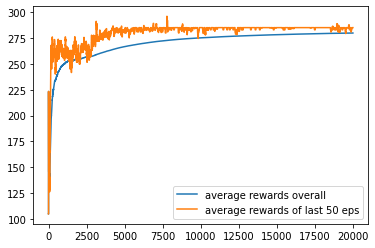

In [24]:
def cum_avg(lst):
  cum_sum = 0
  cum_avg = []
  for num in lst:
    cum_sum += num
    cum_avg.append(cum_sum / len(cum_avg + [0]))
  return cum_avg

def cum_avg_window(lst, window_size=50):
  cum_sum = 0
  cum_avg = []
  for i, num in enumerate(lst):
    start = max(0, i - window_size + 1)
    cum_sum = sum(lst[start:i+1])
    cum_avg.append(cum_sum / (i - start + 1))
  return cum_avg


plt.plot(cum_avg(episodes_reward),label = "average rewards overall")
plt.plot(cum_avg_window(episodes_reward), label = "average rewards of last 50 eps")
plt.legend()

In [25]:
#### random agent

max_episodes = 1000

random_episodes_reward = np.zeros(max_episodes)
for i in range(max_episodes):
    state = env.reset()
    done = False
    while done == False:
        action = env.action_space.sample()
        state, reward, done, truncated, info = env.step(action)
        random_episodes_reward[i] += reward

Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21200.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21200.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21200.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21201.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21201.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21201.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21202.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21202.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21202.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21203.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21203.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21203.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21204.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21204.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21204.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21300.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21300.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21300.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21301.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21301.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21301.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21302.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21302.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21302.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21303.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21303.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21303.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21304.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21304.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21304.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21400.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21400.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21400.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21401.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21401.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21401.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21402.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21402.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21402.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21403.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21403.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21403.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21404.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21404.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21404.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21500.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21500.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21500.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21501.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21501.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21501.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21502.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21502.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21502.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21503.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21503.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21503.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21504.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21504.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21504.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21600.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21600.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21600.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21601.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21601.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21601.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21602.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21602.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21602.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21603.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21603.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21603.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21604.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21604.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21604.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21700.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21700.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21700.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21701.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21701.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21701.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21702.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21702.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21702.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21703.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21703.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21703.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21704.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21704.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21704.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21800.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21800.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21800.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21801.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21801.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21801.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21802.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21802.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21802.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21803.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21803.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21803.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21804.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21804.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21804.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21900.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21900.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21900.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21901.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21901.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21901.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21902.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21902.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21902.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21903.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21903.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21903.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21904.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21904.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-21904.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22000.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22000.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22000.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22001.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22001.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22001.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22002.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22002.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22002.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22003.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22003.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22003.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22004.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22004.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22004.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22100.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22100.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22100.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22101.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22101.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22101.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22102.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22102.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22102.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22103.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22103.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22103.mp4
Moviepy - Building video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22104.mp4.
Moviepy - Writing video /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22104.mp4



Moviepy - Done !
Moviepy - video ready /home/hugo/BATH/miles/videos/02_12_38.513245/SpaceInvaders-v5-episode-22104.mp4


In [49]:
### agent with entropy

agent2_rewards = [180, 260, 140.0, 115.0, 110.0, 210.0, 180.0, 120.0, 155.0, 180.0, 210.0, 460.0, 180.0, 180.0, 180.0, 260.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 285.0, 180.0, 260.0, 260.0, 180.0, 240.0, 385.0, 565.0, 155.0, 210.0, 180.0, 210.0, 240.0, 295.0, 110.0, 120.0, 155.0, 80.0, 300.0, 50.0, 120.0, 15.0, 75.0, 80.0, 110.0, 80.0, 120.0, 110.0, 270.0, 75.0, 125.0, 320.0, 135.0, 210.0, 240.0, 180.0, 155.0, 265.0, 75.0, 210.0, 135.0, 390.0, 155.0, 200.0, 210.0, 150.0, 180.0, 425.0, 99.99999999999818, 180.00000000000182, 155.0, 125.0, 35.0, 210.0, 45.0, 315.0, 120.0, 275.0, 110.0, 155.0, 180.0, 90.0, 125.0, 125.0, 125.0, 155.0, 210.0, 105.0, 210.0, 125.0, 700.0, 320.0, 365.0, 210.0, 45.0, 140.0, 465.0, 185.0, 120.0, 405.0, 105.0, 160.0, 310.0, 105.0, 180.0, 255.0, 240.0, 50.0, 135.0, 90.0, 215.0, 195.0, 745.0, 150.0, 155.0, 135.0, 125.0, 155.0, 10.0, 135.0, 180.0, 65.0, 150.0, 30.0, 570.0, 440.0, 85.0, 50.0, 240.0, 490.0, 105.0, 55.0, 230.0, 105.0, 110.0, 330.0, 110.0, 460.0, 185.0, 140.0, 285.0, 65.0, 80.0, 275.0, 240.0, 205.0, 120.0, 225.0, 30.0, 575.0, 120.0, 5.000000000003638, 319.99999999999636, 120.0, 155.0, 135.0, 160.0, 100.0, 275.0, 105.0, 205.0, 180.0, 35.0, 320.0, 105.0, 170.0, 120.0, 240.0, 35.0, 470.0, 155.0, 140.0, 65.0, 120.0, 55.0, 135.0, 180.0, 65.0, 110.0, 120.0, 155.0, 155.0, 210.0, 320.0, 165.0, 495.0, 255.0, 290.0, 45.0, 210.0, 275.0, 240.0, 460.0, 80.0, 315.0, 155.0, 210.0, 255.0, 625.0, 320.0, 210.0, 240.0, 105.0, 715.0, 240.0, 185.0, 155.0, 185.0, 105.0, 240.0, 240.0, 65.0, 225.0, 180.0, 330.0, 415.0, 240.0, 460.0, 110.0, 155.0, 155.0, 410.0, 130.0, 210.0, 50.0, 315.0, 210.0, 100.0, 210.0, 210.0, 335.0, 295.0, 390.0, 185.0, 315.0, 155.0, 285.0, 105.0, 380.0, 210.0, 210.0, 35.0, 380.0, 155.0, 460.0, 180.0, 120.0, 210.0, 210.0, 390.0, 320.0, 260.0, 330.0, 135.0, 110.0, 155.0, 134.99999999999272, 255.00000000001455, 254.99999999999272, 180.0, 410.0, 260.0, 260.0, 209.99999999999272, 110.00000000000728, 155.0, 155.0, 210.0, 210.00000000000728, 209.99999999999272, 210.0, 210.0, 80.0, 185.0, 155.0, 380.0, 240.0, 439.9999999999927, 455.0000000000073, 105.0, 485.0, 210.0, 120.0, 210.0, 105.00000000000728, 104.99999999999272, 30.0, 210.0, 134.99999999999272, 150.00000000000728, 210.0, 105.0, 210.0, 225.00000000000728, 154.99999999999272, 370.0, 605.0000000000073, 255.0, 429.9999999999927, 245.0, 135.00000000000728, 139.99999999999272, 275.0, 260.0, 260.0, 135.0, 260.0, 210.0, 210.0, 320.0, 210.0, 165.0, 105.0, 125.0, 305.0, 410.0, 215.0, 240.0, 120.0, 210.0, 210.0, 240.0, 425.0, 60.0, 245.0, 470.0, 120.0, 365.0, 425.0, 210.0, 180.0, 160.0, 105.0, 225.0, 380.0, 530.0, 545.0, 105.0, 260.0, 185.0, 485.0, 390.0, 210.0, 210.0, 355.0, 310.0, 265.0, 105.0, 210.0, 420.0, 225.0, 210.0, 80.0, 210.0, 490.0, 250.0, 210.0, 75.0, 270.0, 190.0, 180.0, 380.0, 155.0, 210.0, 210.0, 180.0, 110.0, 185.0, 240.0, 210.0, 155.0, 245.0, 375.0, 475.0, 135.0, 210.0, 310.0, 335.0, 405.0, 125.0, 300.0, 255.0, 210.0, 315.0, 105.0, 240.0, 200.0, 285.0, 120.0, 210.0, 210.0, 305.0, 160.0, 340.0, 445.0, 410.0, 210.0, 210.0, 350.0, 185.0, 230.0, 55.0, 120.0, 75.0, 210.0, 290.0, 155.0, 235.0, 260.0, 180.0, 460.0, 155.0, 210.0, 135.0, 140.0, 260.0, 180.0, 355.0, 260.0, 210.0, 275.0, 180.0, 210.0, 215.0, 300.0, 155.0, 210.0, 210.0, 560.0, 395.0, 155.0, 210.0, 75.0, 210.0, 315.0, 290.0, 210.0, 290.0, 240.0, 210.0, 210.0, 260.0, 210.0, 275.0, 350.0, 455.0, 240.0, 240.0, 135.0, 180.0, 135.0, 270.0, 210.0, 215.0, 50.0, 440.0, 180.0, 185.0, 210.0, 155.0, 625.0, 210.0, 245.0, 475.0, 250.0, 225.0, 410.0, 180.0, 180.0, 465.0, 455.0, 105.0, 750.0, 260.0, 260.0, 210.0, 245.0, 270.0, 545.0, 210.0, 210.0, 255.0, 285.0, 155.0, 210.0, 210.0, 210.0, 210.0, 315.0, 240.0, 210.0, 155.0, 320.0, 215.0, 260.0, 250.0, 380.0, 260.0, 265.0, 470.0, 210.0, 680.0, 250.0, 225.0, 270.0, 210.0, 530.0, 255.0, 210.0, 210.0, 285.0, 460.0, 240.0, 310.0, 454.99999999998545, 245.00000000001455, 285.0, 155.0, 210.0, 105.0, 155.0, 365.0, 210.0, 620.0, 210.0, 210.0, 210.0, 285.0, 270.0, 185.0, 210.0, 210.0, 260.0, 410.0, 345.0, 245.0, 460.0, 240.0, 155.0, 255.0, 210.0, 155.0, 105.0, 210.0, 210.0, 410.0, 545.0, 180.0, 265.0, 210.0, 260.0, 180.0, 260.0, 210.0, 210.0, 179.99999999998545, 210.00000000001455, 210.0, 485.0, 260.0, 260.0, 260.0, 210.0, 410.0, 210.0, 210.0, 180.0, 210.0, 265.0, 180.0, 565.0, 265.0, 660.0, 485.0, 515.0, 180.0, 210.0, 295.0, 195.0, 260.0, 210.0, 210.0, 210.0, 210.0, 210.0, 105.0, 210.0, 460.0, 315.0, 210.0, 180.0, 420.0, 155.0, 390.0, 210.0, 240.0, 110.0, 225.0, 210.0, 260.0, 240.0, 240.0, 230.0, 210.0, 460.0, 270.0, 210.0, 640.0, 270.0, 345.0, 210.0, 180.0, 260.0, 210.0, 210.0, 210.0, 210.0, 395.0, 410.0, 210.0, 210.0, 210.0, 255.0, 210.0, 410.0, 260.0, 155.0, 265.0, 290.0, 210.0, 155.0, 530.0, 240.0, 410.0, 180.0, 210.0, 345.0, 210.0, 390.0, 105.0, 240.0, 285.0, 300.0, 300.0, 345.0, 320.0, 180.0, 240.0, 270.0, 210.0, 485.0, 135.0, 260.0, 265.0, 135.0, 155.0, 135.0, 355.0, 260.0, 255.0, 210.0, 180.0, 315.0, 210.0, 135.0, 210.0, 260.0, 260.0, 210.0, 275.0, 260.0, 590.0, 210.0, 210.0, 210.0, 260.0, 135.0, 210.0, 410.0, 545.0, 260.0, 210.0, 210.0, 230.0, 315.0, 210.0, 390.0, 355.0, 185.0, 210.0, 105.0, 240.0, 225.0, 260.0, 210.0, 135.0, 295.0, 185.0, 180.0, 210.0, 270.0, 210.0, 410.0, 210.0, 180.0, 260.0, 210.0, 210.0, 210.0, 210.0, 310.0, 210.0, 210.0, 240.0, 140.0, 155.0, 255.0, 210.0, 270.0, 635.0, 210.0, 155.0, 260.0, 135.0, 210.0, 180.0, 180.0, 365.0, 260.0, 515.0, 105.0, 210.0, 260.0, 285.0, 180.0, 240.0, 315.0, 210.0, 265.0, 210.0, 410.0, 440.0, 105.0, 365.0, 180.0, 410.0, 185.0, 155.0, 260.0, 180.0, 440.0, 315.0, 265.0, 340.0, 285.0, 230.0, 210.0, 210.0, 265.0, 210.0, 270.0, 260.0, 210.0, 260.0, 210.0, 210.0, 180.0, 270.0, 260.0, 635.0, 410.0, 180.0, 330.0, 180.0, 260.0, 260.0, 370.0, 180.0, 285.0, 270.0, 300.0, 265.0, 255.0, 180.0, 260.0, 265.0, 285.0, 210.0, 180.0, 240.0, 225.0, 395.0, 180.0, 260.0, 315.0, 240.0, 210.0, 490.0, 240.0, 105.0, 210.0, 210.0, 285.0, 330.0, 210.0, 155.0, 305.0, 210.0, 260.0, 240.0, 210.0, 345.0, 275.0, 155.0, 270.0, 285.0, 225.0, 270.0, 240.0, 210.0, 520.0, 210.0, 180.0, 380.0, 385.0, 180.0, 210.0, 275.0, 275.0, 210.0, 240.0, 210.0, 260.0, 240.0, 210.0, 345.0, 355.0, 210.0, 210.0, 210.0, 340.0, 410.0, 240.0, 105.0, 210.0, 210.0, 180.0, 375.0, 590.0, 260.0, 210.0, 210.0, 240.0, 325.0, 280.0, 410.0, 285.0, 240.0, 440.0, 270.0, 285.0, 210.0, 350.0, 180.0, 285.0, 275.0, 210.0, 370.0, 210.0, 380.0, 260.0, 310.0, 210.0, 410.0, 285.0, 180.0, 210.0, 300.0, 260.0, 260.0, 210.0, 210.0, 210.0, 305.0, 365.0, 210.0, 285.0, 260.0, 180.0, 240.0, 210.0, 210.0, 225.0, 295.0, 410.0, 285.0, 285.0, 410.0, 365.0, 225.0, 210.0, 410.0, 285.0, 260.0, 210.0, 255.0, 210.0, 285.0, 260.0, 210.0, 240.0, 260.0, 210.0, 255.0, 260.0, 285.0, 260.0, 210.0, 285.0, 525.0, 180.0, 210.0, 240.0, 180.0, 240.0, 210.0, 260.0, 180.0, 210.0, 180.0, 530.0, 270.0, 210.0, 210.0, 225.0, 240.0, 155.0, 110.0, 380.0, 240.0, 265.0, 240.0, 255.0, 335.0, 210.0, 210.0, 285.0, 240.0, 470.0, 565.0, 460.0, 270.0, 180.0, 240.0, 305.0, 155.0, 210.0, 345.0, 495.0, 240.0, 180.0, 210.0, 240.0, 330.0, 260.0, 180.0, 255.0, 210.0, 210.0, 180.0, 210.0, 260.0, 315.0, 210.0, 260.0, 155.0, 180.0, 500.0, 240.0, 260.0, 155.0, 210.0, 255.0, 240.0, 210.0, 180.0, 105.0, 210.0, 440.0, 310.0, 210.0, 240.0, 210.0, 300.0, 155.0, 210.0, 210.0, 210.0, 240.0, 285.0, 210.0, 240.0, 420.0, 285.0, 315.0, 210.0, 270.0, 320.0, 290.0, 210.0, 110.0, 210.0, 210.0, 180.0, 260.0, 225.0, 210.0, 540.0, 210.0, 260.0, 415.0, 270.0, 365.0, 240.0, 210.0, 245.0, 260.0, 180.0, 210.0, 485.0, 210.0, 210.0, 265.0, 330.0, 210.0, 490.0, 310.0, 235.0, 105.0, 210.0, 210.0, 260.0, 210.0, 440.0, 440.0, 180.0, 295.0, 240.0, 210.0, 255.0, 240.0, 210.0000000000291, 209.9999999999709, 105.0, 300.0, 305.0, 260.0, 180.0, 260.0, 185.0, 240.0, 790.0, 210.0, 270.0, 260.0, 240.0, 240.0, 485.0, 210.0, 265.0, 545.0, 260.0, 490.0, 265.0, 420.0, 485.0, 210.0, 225.0, 305.0, 270.0, 285.0, 640.0, 290.0, 260.0, 210.0, 210.0, 210.0, 265.0, 240.0, 260.0, 240.0, 550.0, 180.0, 260.0, 260.0, 390.0, 390.0, 210.0, 460.0, 210.0, 210.0, 290.0, 240.0, 440.0, 215.0, 210.0, 260.0, 260.0, 420.0, 240.0, 210.0, 270.0, 375.0, 225.0, 210.0, 290.0, 210.0, 315.0, 260.0, 300.0, 210.0, 215.0, 265.0, 210.0, 300.0, 490.0, 155.0, 210.0, 240.0, 285.0, 260.0, 210.0, 590.0, 310.0, 210.0, 210.0, 225.0, 255.0, 240.0, 240.0, 240.0, 460.0, 575.0, 270.0, 450.0, 255.0, 270.0, 385.0, 240.0, 315.0, 260.0, 230.0, 460.0, 440.0, 210.0, 210.0, 380.0, 395.0, 210.0, 160.0, 180.0, 410.0, 260.0, 240.0, 300.0, 240.0, 310.0, 440.0, 135.0, 530.0, 210.0, 210.0, 285.0, 260.0, 180.0, 240.0, 240.0, 285.0, 210.0, 285.0, 260.0, 240.0, 380.0, 210.0, 210.0, 210.0, 240.0, 410.0, 210.0, 545.0, 210.0, 210.0, 180.0, 240.0, 535.0, 495.0, 290.0, 210.0, 260.0, 250.0, 210.0, 260.0, 240.0, 285.0, 210.0, 260.0, 180.0, 165.0, 285.0, 265.0, 240.0, 240.0, 260.0, 260.0, 275.0, 460.0, 260.0, 210.0, 285.0, 295.0, 260.0, 335.0, 240.0, 240.0, 285.0, 210.0, 260.0, 285.0, 265.0, 390.0, 210.0, 260.0, 210.0, 210.0, 210.0, 270.0, 290.0, 260.0, 440.0, 240.0, 380.0, 245.0, 290.0, 210.0, 240.0, 210.0, 490.0, 590.0, 270.0, 590.0, 210.0, 360.0, 240.0, 315.0, 260.0, 180.0, 285.0, 180.0, 315.0, 210.0, 240.0, 460.0, 260.0, 210.0, 210.0, 210.0, 245.0, 225.0, 240.0, 260.0, 180.0, 180.0, 210.0, 620.0, 460.0, 260.0, 445.0, 780.0, 210.0, 180.0, 210.0, 210.0, 210.0, 180.0, 590.0, 210.0, 285.0, 210.0, 210.0, 285.0, 240.0, 270.0, 260.0, 180.0, 210.0, 240.0, 285.0, 265.0, 240.0, 105.0, 275.0, 260.0, 210.0, 285.0, 285.0, 275.0, 290.0, 260.0, 210.0, 240.0, 285.0, 240.0, 210.0, 210.0, 320.0, 390.0, 390.0, 600.0, 260.0, 260.0, 210.0, 260.0, 210.0, 105.0, 210.0, 210.0, 210.0, 380.0, 180.0, 320.0, 410.0, 240.0, 210.0, 265.0, 285.0, 285.0, 210.0, 210.0, 285.0, 260.0, 410.0, 420.0, 210.0, 210.0, 410.0, 285.0, 365.0, 210.0, 260.0, 210.0, 210.0, 265.0, 265.0, 260.0, 260.0, 210.0, 345.0, 315.0, 210.0, 290.0, 460.0, 380.0, 240.0, 260.0, 240.0, 335.0, 285.0, 385.0, 385.0, 420.0, 210.0, 240.0, 150.0, 475.0, 210.0, 345.0, 155.0, 210.0, 105.0, 240.0, 210.0, 410.0, 210.0, 155.0, 420.0, 225.0, 210.0, 210.0, 180.0, 270.0, 240.0, 225.0, 210.0, 240.0, 260.0, 180.0, 240.0, 210.0, 180.0, 380.0, 410.0, 105.0, 210.0, 530.0, 210.0, 260.0, 210.0, 460.0, 260.0, 355.0, 180.0, 210.0, 210.0, 245.0, 315.0, 565.0, 285.0, 210.0, 240.0, 180.0, 490.0, 210.0, 185.0, 180.0, 440.0, 500.0, 240.0, 210.0, 105.0, 495.0, 210.0, 595.0, 210.0, 240.0, 260.0, 210.0, 460.0, 210.0, 315.0, 210.0, 285.0, 240.0, 260.0, 210.0, 310.0, 725.0, 225.0, 210.0, 210.0, 240.0, 410.0, 180.0, 335.0, 210.0, 155.0, 240.0, 260.0, 210.0, 670.0, 255.0, 260.0, 180.0, 355.0, 155.0, 155.0, 210.0, 240.0, 210.0, 310.0, 395.0, 590.0, 225.0, 180.0, 210.0, 210.0, 260.0, 210.0, 260.0, 210.0, 260.0, 210.0, 240.0, 180.0, 240.0, 270.0, 275.0, 180.0, 240.0, 260.0, 565.0, 310.0, 590.0, 270.0, 440.0, 210.0, 240.0, 180.0, 245.0, 210.0, 300.0, 155.0, 590.0, 240.0, 415.0, 210.0, 210.0, 410.0, 375.0000000000582, 209.9999999999418, 345.0, 239.9999999999418, 490.0000000000582, 179.9999999999418, 260.0000000001164, 515.0, 239.9999999999418, 240.0000000000582, 264.9999999999418, 180.0, 240.0, 240.0, 209.9999999999418, 265.0000000000582, 210.0, 239.9999999999418, 300.0000000000582, 210.0, 260.0, 249.9999999999418, 455.0000000000582, 620.0, 210.0000000000582, 239.99999999988358, 290.0000000000582, 210.0, 235.0, 180.0000000000582, 179.9999999999418, 240.0, 295.0, 210.0, 260.0, 210.0000000000582, 210.0, 474.9999999998836, 180.0, 280.0000000000582, 260.0, 215.0000000000582, 409.9999999999418, 210.0, 209.9999999999418, 240.0000000000582, 300.0, 345.0, 180.0, 210.0, 209.9999999999418, 275.0000000000582, 179.9999999999418, 335.0, 240.0000000000582, 209.9999999999418, 305.0000000001164, 459.9999999999418, 179.9999999999418, 270.0, 210.00000000011642, 669.9999999999418, 180.0, 245.0, 285.0, 419.9999999999418, 265.0000000000582, 210.0, 210.0, 395.0, 210.0, 210.0000000000582, 259.9999999999418, 240.0, 210.0000000000582, 179.9999999999418, 210.0000000000582, 209.9999999999418, 239.9999999999418, 435.0000000000582, 240.0, 565.0, 210.0, 239.9999999999418, 180.0, 210.0000000000582, 470.0, 269.9999999999418, 180.0000000000582, 210.0, 285.0, 259.9999999999418, 335.0000000000582, 210.0, 260.0, 210.0, 260.0000000000582, 284.9999999999418, 180.0, 260.0, 210.0, 210.0, 284.9999999999418, 590.0000000000582, 210.0, 259.9999999999418, 210.0, 315.0000000000582, 180.0, 240.0000000000582, 209.9999999999418, 390.0, 210.0000000000582, 210.0, 209.9999999999418, 210.0000000000582, 264.9999999999418, 210.0, 240.0000000000582, 240.0, 364.9999999999418, 210.0000000000582, 459.9999999999418, 180.0, 640.0, 320.0, 265.0, 670.0000000000582, 284.9999999999418, 259.9999999999418, 210.0000000000582, 345.0000000000582, 264.9999999999418, 260.0, 260.0, 460.0, 135.0, 179.9999999999418, 260.0000000000582, 210.0, 470.0, 285.0, 239.9999999999418, 365.0000000000582, 210.0, 490.0000000000582, 259.9999999998836, 285.0000000000582, 210.0, 290.0, 345.0, 209.9999999999418, 390.0000000000582, 259.9999999999418, 795.0000000000582, 284.9999999999418, 210.0000000000582, 284.9999999999418, 240.0000000000582, 285.0, 284.9999999999418, 265.0000000000582, 270.0, 419.9999999999418, 270.0000000001164, 314.9999999999418, 260.0, 239.9999999999418, 180.00000000011642, 489.9999999999418, 260.0, 240.0, 240.0, 350.0, 300.0000000000582, 395.0, 260.0, 259.9999999999418, 315.0000000000582, 210.0, 315.0, 209.9999999999418, 210.0, 415.0, 565.0, 435.0, 209.9999999999418, 240.0000000000582, 285.0, 180.0, 210.0, 210.0, 590.0000000000582, 264.9999999999418, 410.0000000000582, 209.99999999988358, 240.00000000011642, 210.0, 434.9999999998836, 515.0000000000582, 179.9999999999418, 180.0000000000582, 209.9999999999418, 295.0000000001164, 284.9999999999418, 285.0000000000582, 209.99999999988358, 240.0000000000582, 260.0, 260.0000000000582, 209.9999999999418, 210.0, 260.0, 390.0, 265.0, 210.0, 260.0000000000582, 314.9999999998836, 210.0000000000582, 410.0, 260.0000000000582, 285.0, 179.99999999988358, 240.0, 240.0000000000582, 210.0000000000582, 354.9999999998836, 410.0000000001164, 289.9999999998836, 380.0000000000582, 240.0, 179.9999999999418, 240.0000000000582, 344.9999999999418, 210.00000000011642, 209.99999999988358, 240.0000000000582, 285.0000000000582, 259.9999999998836, 210.00000000011642, 259.9999999999418, 460.0000000000582, 260.0, 260.0, 594.9999999998836, 210.0000000000582, 210.0, 209.9999999999418, 180.0, 210.0000000000582, 260.0000000000582, 274.9999999999418, 210.0, 290.0, 210.0, 245.0, 410.0000000000582, 299.9999999999418, 240.0, 260.0, 180.0000000000582, 389.9999999998836, 210.0000000000582, 240.0000000000582, 264.9999999999418, 444.9999999999418, 210.0, 240.00000000011642, 259.9999999999418, 155.0000000000582, 264.9999999998836, 315.0000000000582, 285.0, 315.0, 439.9999999999418, 210.0000000000582, 210.0, 259.9999999999418, 210.0000000000582, 260.0, 210.0, 155.0, 310.0, 409.9999999999418, 285.0000000000582, 390.0, 460.0, 260.0000000000582, 244.9999999999418, 210.0000000000582, 260.0, 464.9999999999418, 285.0, 210.0, 674.9999999999418, 180.0, 210.00000000011642, 179.9999999999418, 180.0, 180.0, 210.0, 209.9999999999418, 225.0000000000582, 364.9999999999418, 410.0000000001164, 254.9999999999418, 275.0, 240.0, 320.0000000000582, 264.9999999999418, 240.0000000000582, 765.0, 244.9999999999418, 180.0, 225.0, 210.0, 315.0, 210.0, 240.0000000000582, 274.9999999998836, 210.0000000000582, 210.0, 225.0, 420.0000000000582, 209.9999999999418, 415.0, 239.9999999999418, 410.0000000000582, 409.9999999999418, 285.0000000000582, 289.9999999999418, 460.0000000001164, 265.0, 209.9999999999418, 210.0, 410.0, 260.0000000000582, 259.9999999999418, 260.0000000000582, 254.99999999988358, 255.00000000011642, 329.9999999998836, 620.0000000000582, 210.0000000000582, 210.0, 284.9999999999418, 225.0000000000582, 329.9999999998836, 210.0000000000582, 565.0, 269.9999999999418, 225.0000000000582, 650.0, 180.0, 210.0, 290.0, 259.9999999999418, 210.0000000000582, 210.0000000000582, 459.9999999999418, 210.0, 284.9999999999418, 210.0000000000582, 239.9999999999418, 260.0, 460.0, 240.00000000011642, 305.0, 294.9999999999418, 435.0, 490.0000000000582, 259.9999999998836, 285.0000000000582, 209.9999999999418, 260.0000000000582, 264.9999999999418, 485.0, 240.0000000000582, 240.0, 210.0, 210.0000000000582, 179.9999999999418, 210.0, 290.0, 180.0, 240.0000000000582, 284.9999999999418, 180.0, 410.0, 265.0, 370.0, 259.9999999999418, 380.0, 180.0000000000582, 259.9999999999418, 410.0000000001164, 284.9999999999418, 255.0, 590.0, 315.0, 215.0, 240.0000000000582, 284.9999999999418, 179.9999999999418, 290.0000000000582, 240.0, 334.9999999999418, 260.0000000001164, 239.99999999988358, 285.0000000000582, 420.0000000000582, 239.9999999999418, 265.0, 590.0, 210.0, 490.0, 155.0000000000582, 209.9999999999418, 379.9999999999418, 180.00000000011642, 459.9999999999418, 420.0000000000582, 514.9999999999418, 500.0, 270.0000000000582, 269.9999999999418, 240.0, 210.0, 260.0, 210.0000000000582, 284.9999999999418, 180.0, 260.0, 470.0000000000582, 259.9999999999418, 275.0, 265.0, 260.0, 210.0, 410.0000000000582, 284.9999999998836, 410.0000000000582, 244.9999999999418, 240.0000000000582, 410.0, 259.9999999999418, 240.0000000000582, 245.0000000000582, 524.9999999999418, 260.0, 210.0000000000582, 285.0, 209.9999999999418, 260.0, 180.0, 420.0000000000582, 564.9999999999418, 260.0, 240.0000000000582, 379.9999999998836, 240.0, 410.0000000000582, 210.0, 180.0, 620.0, 590.0, 180.0, 260.0, 209.9999999999418, 210.00000000011642, 299.9999999999418, 259.9999999999418, 210.0000000000582, 180.0000000000582, 259.9999999999418, 410.0, 225.0, 410.0, 290.0, 265.0, 215.0, 240.0, 240.0, 210.0, 210.0, 280.0, 210.0, 260.0, 240.0, 260.0, 440.0, 285.0, 345.0, 210.0, 210.0, 285.0, 500.0, 315.0, 210.0, 685.0, 210.0, 240.0, 285.0, 210.0, 260.0, 155.0, 440.0, 240.0, 410.0, 210.0, 210.0, 285.0, 590.0, 240.0, 180.0, 180.0, 210.0, 240.0, 390.0, 240.0, 265.0, 260.0, 260.0, 210.0, 210.0, 535.0, 210.0, 180.0, 240.0, 330.0, 180.0, 210.0, 210.0, 210.0, 340.0, 105.0, 470.0, 270.0, 260.0, 290.0, 290.0, 320.0, 210.0, 335.0, 315.0, 270.0, 210.0, 285.0, 210.0, 120.0, 210.0, 260.0, 620.0, 105.0, 240.0, 155.0, 180.0, 225.0, 225.0, 210.0, 180.0, 450.0, 450.0, 155.0, 260.0, 180.0, 285.0, 210.0, 240.0, 180.0, 210.0, 440.0, 155.0, 290.0, 210.0, 210.0, 395.0, 240.0, 210.0, 260.0, 210.0, 210.0, 260.0, 345.0, 275.0, 260.0, 210.0, 495.0, 315.0, 155.0, 265.0, 265.0, 510.0, 300.0, 240.0, 290.0, 260.0, 210.0, 105.0, 210.0, 210.0, 285.0, 260.0, 265.0, 210.0, 320.0, 210.0, 270.0, 180.0, 264.9999999998836, 570.0000000001164, 255.0, 245.0, 265.0, 290.0, 260.0, 260.0, 285.0, 260.0, 210.0, 250.0, 260.0, 260.0, 260.0, 210.0, 290.0, 240.0, 210.0, 210.0, 315.0, 419.9999999998836, 240.00000000011642, 210.0, 260.0, 210.0, 240.0, 260.0, 250.0, 345.0, 460.0, 210.0, 260.0, 104.99999999988358, 210.00000000011642, 190.0, 315.0, 105.0, 495.0, 180.0, 285.0, 155.0, 285.0, 580.0, 620.0, 270.0, 545.0, 260.0, 285.0, 210.0, 265.0, 390.0, 210.0, 270.0, 325.0, 275.0, 210.0, 380.0, 105.0, 365.0, 180.0, 260.0, 180.0, 240.0, 315.0, 210.0, 215.00000000011642, 259.9999999998836, 240.0, 260.0, 215.0, 210.0, 285.0000000001164, 209.99999999988358, 105.0, 265.0, 240.0, 210.0, 210.0, 355.0, 210.0, 260.0, 270.0, 315.0, 590.0, 210.0, 359.9999999998836, 260.0000000001164, 260.0, 270.0, 530.0, 210.0, 260.0, 305.0, 180.0, 180.0, 260.0, 210.0, 240.0, 260.0, 250.0, 515.0, 315.0, 360.0, 210.0, 225.0, 180.0, 210.0, 224.99999999988358, 210.00000000011642, 210.0, 590.0, 210.0, 285.0000000001164, 259.9999999998836, 210.0, 260.0, 180.0, 135.0, 180.0, 185.0, 240.0, 210.0, 105.0, 210.0, 210.0, 300.0, 365.0, 215.0, 210.0, 210.0, 155.0, 180.0, 260.0, 410.0, 470.0, 210.0, 290.0, 210.0, 120.0, 260.0, 365.0, 420.0, 315.0, 210.0, 210.00000000011642, 104.99999999988358, 275.0, 155.0, 210.0, 210.0, 260.0, 290.0, 210.0, 210.0, 410.0, 260.0, 210.0, 214.99999999988358, 215.00000000023283, 209.99999999988358, 285.0, 120.0, 260.0, 105.0, 240.0, 330.0, 135.0, 315.0, 135.0, 210.0, 210.0, 155.0, 60.0, 295.0, 180.0, 210.0, 155.0, 180.0, 110.00000000011642, 179.99999999988358, 210.0, 210.0, 135.0, 75.0, 260.0, 210.0, 345.0, 105.0, 270.0, 240.0, 210.0, 365.0, 145.0, 210.0, 210.0, 210.0, 275.0, 240.0, 105.0, 155.0, 345.0, 210.0, 155.0, 210.0, 180.0, 190.0, 260.0, 160.0, 240.0, 135.0, 210.0, 240.0, 209.99999999988358, 185.00000000011642, 240.0, 180.0, 165.0, 210.0, 210.0, 210.0, 525.0, 210.0, 365.0, 730.0, 380.0, 210.0, 210.0, 210.0, 290.0, 260.0, 105.0, 240.0, 210.0, 135.0, 410.0, 335.0, 545.0, 185.0, 210.00000000011642, 289.9999999998836, 155.0, 155.0, 210.0, 245.0, 155.00000000011642, 259.9999999998836, 240.0, 180.0, 275.0, 240.0, 360.0, 250.0, 375.0, 210.0, 620.0, 210.0, 510.0, 210.0, 280.0, 255.0, 210.00000000011642, 134.99999999988358, 105.0, 105.0, 210.0, 275.0, 179.99999999988358, 260.0000000001164, 180.0, 275.0, 135.0, 410.0, 260.0, 105.0, 120.0, 210.0, 155.0, 134.99999999988358, 210.00000000011642, 120.0, 215.0, 155.0, 215.0, 210.0, 210.0, 105.0, 465.0000000001164, 330.0, 209.99999999988358, 365.0000000001164, 149.99999999988358, 210.0, 260.0, 155.0, 310.0, 155.0, 550.0, 260.0, 515.0, 300.0, 180.0, 405.0, 155.0, 260.0, 245.0, 135.0, 225.0, 190.0, 210.0, 240.0, 139.99999999988358, 210.00000000011642, 330.0, 240.0, 215.0, 180.0, 240.0, 180.0, 210.0, 365.0, 240.0, 270.0, 339.9999999998836, 225.00000000011642, 259.9999999998836, 210.00000000011642, 365.0, 240.0, 240.0, 210.0, 495.0, 240.0, 240.0, 290.0, 210.0, 265.0, 335.0, 210.0, 500.0, 120.0, 210.0, 410.0, 105.0, 210.0, 495.0, 440.0, 240.0, 210.0, 120.0, 209.99999999988358, 210.00000000023283, 209.99999999988358, 210.0, 285.0, 210.0, 240.0, 310.0, 410.0, 460.0, 290.0, 314.9999999998836, 240.00000000023283, 214.99999999988358, 240.0, 210.0, 210.0, 270.0, 270.0, 215.0, 210.0, 745.0, 410.0, 260.0, 285.0, 210.0, 210.0, 180.0, 260.0, 299.9999999998836, 225.00000000011642, 259.9999999998836, 380.0000000001164, 180.0, 260.0, 260.0, 624.9999999998836, 440.0000000001164, 105.00000000011642, 274.9999999998836, 240.0, 725.0000000001164, 314.9999999998836, 470.0000000001164, 134.99999999976717, 490.0000000001164, 210.0, 700.0, 290.0, 265.0, 410.0, 240.00000000011642, 409.9999999998836, 240.0, 290.0, 235.0, 210.0, 285.0, 209.99999999988358, 290.0000000001164, 225.0, 240.0, 260.0, 239.99999999988358, 565.0000000001164, 260.0, 310.0, 210.0, 240.0, 335.0, 670.0, 104.99999999988358, 210.00000000011642, 260.0, 450.0, 285.0, 210.0, 240.00000000011642, 209.99999999988358, 430.0, 365.0, 210.0, 260.0, 285.0, 265.0, 240.0, 239.99999999988358, 290.0, 210.00000000011642, 330.0000000001164, 439.9999999998836, 180.00000000011642, 239.99999999988358, 350.0, 305.0, 285.0, 319.9999999998836, 395.0, 260.0000000001164, 270.0, 330.0, 210.0, 210.0, 240.0, 210.0, 259.9999999998836, 335.0, 385.0000000001164, 209.99999999988358, 260.00000000023283, 259.99999999976717, 420.0000000001164, 260.0, 239.99999999988358, 285.0000000001164, 289.9999999998836, 260.0000000001164, 365.0, 625.0, 260.0, 179.99999999988358, 240.00000000011642, 285.0, 225.0, 344.9999999998836, 210.00000000011642, 210.0, 210.0, 285.0, 590.0, 265.0, 209.99999999988358, 265.0000000001164, 315.0, 210.0, 240.0, 285.0000000001164, 589.9999999998836, 210.0, 210.0, 210.0, 260.0, 260.0, 260.0, 210.0, 525.0, 335.0, 210.00000000011642, 259.99999999976717, 210.00000000023283, 209.99999999988358, 260.0, 270.0, 285.0, 225.0, 240.00000000011642, 489.9999999998836, 260.0, 210.0, 265.0, 515.0, 260.0, 210.0, 260.0, 105.0, 390.0, 270.0, 210.00000000011642, 134.99999999988358, 210.0, 259.9999999998836, 245.00000000011642, 155.0, 210.0, 255.0, 210.0, 210.0, 285.0, 240.0, 239.99999999988358, 260.0000000001164, 290.0, 260.0, 275.0, 210.0, 270.0, 120.00000000011642, 285.0, 119.99999999976717, 280.0000000001164, 105.00000000011642, 284.9999999998836, 179.99999999988358, 195.00000000011642, 210.00000000011642, 274.9999999998836, 230.00000000011642, 224.99999999988358, 50.0, 210.0, 155.0, 210.00000000011642, 179.99999999988358, 240.0, 180.0, 335.0000000001164, 179.99999999988358, 215.0, 260.0, 225.0, 260.0, 564.9999999998836, 225.00000000011642, 210.0, 180.0, 210.0, 175.0, 209.99999999988358, 255.00000000011642, 210.0, 565.0000000001164, 619.9999999998836, 210.0, 210.0, 80.0, 260.0, 210.0, 260.0, 210.0, 474.9999999998836, 105.00000000011642, 325.0000000001164, 214.99999999988358, 490.0, 210.0, 210.0, 210.0, 270.0, 410.0, 210.0, 260.0000000001164, 209.99999999976717, 135.00000000011642, 240.0, 390.0, 260.0, 210.0, 360.0, 210.0, 210.0, 415.0, 210.0, 290.0, 210.00000000011642, 484.99999999976717, 215.0, 410.00000000023283, 724.9999999998836, 260.0, 210.0, 215.0, 345.0, 260.0, 700.0, 270.0, 210.0, 475.0, 260.0, 180.0, 470.0000000001164, 209.99999999988358, 180.0, 285.0, 210.0, 210.0, 210.0, 284.9999999998836, 260.0000000001164, 210.00000000011642, 410.0, 344.99999999976717, 265.0000000001164, 259.9999999998836, 475.0000000001164, 319.9999999998836, 410.0000000001164, 209.99999999988358, 240.00000000011642, 345.0, 239.99999999988358, 180.0, 350.0000000001164, 290.0, 285.0, 225.0, 235.0, 210.0, 180.0, 390.0, 335.0, 255.0, 285.0000000001164, 474.9999999998836, 460.0000000001164, 104.99999999976717, 210.00000000011642, 210.0, 215.0, 210.0, 240.0, 240.0, 260.0000000001164, 209.99999999988358, 240.0, 180.0, 210.00000000011642, 224.99999999976717, 180.00000000011642, 210.0, 285.0, 209.99999999988358, 180.00000000011642, 210.0, 215.00000000011642, 135.0, 249.99999999988358, 215.0, 180.00000000011642, 284.9999999998836, 355.0, 240.0, 240.00000000011642, 314.9999999998836, 345.0000000001164, 210.0, 154.99999999988358, 104.99999999988358, 180.00000000011642, 260.0, 240.0, 285.0, 270.0000000001164, 209.99999999976717, 135.00000000011642, 210.0, 260.0, 285.0, 375.0, 390.0, 210.0, 155.0, 210.0, 295.0, 260.0, 210.0, 380.0000000001164, 289.9999999998836, 410.0, 210.0, 210.0, 209.99999999988358, 225.00000000011642, 180.0, 310.0, 410.0, 264.9999999998836, 180.0, 435.00000000023283, 104.99999999988358, 210.0, 210.0, 180.0, 210.0, 224.99999999988358, 210.00000000011642, 119.99999999988358, 240.0, 260.0, 290.0000000001164, 790.0, 284.9999999998836, 210.00000000011642, 210.0, 180.0, 210.0, 265.0, 210.0, 180.0, 210.0, 209.99999999988358, 240.00000000011642, 214.99999999988358, 240.00000000023283, 209.99999999988358, 210.0, 239.99999999988358, 240.00000000011642, 210.00000000011642, 409.99999999976717, 240.00000000011642, 410.0, 209.99999999988358, 210.00000000011642, 210.0, 590.0, 209.99999999988358, 210.00000000011642, 210.0, 260.0000000001164, 209.99999999988358, 515.0000000001164, 209.99999999988358, 240.0, 210.0, 265.0, 180.0, 210.0, 319.9999999998836, 260.0000000001164, 260.0000000001164, 270.0, 464.9999999998836, 260.0, 120.0, 180.0, 240.0, 210.0, 260.0, 105.0, 290.0, 365.0, 209.99999999988358, 265.00000000023283, 209.99999999988358, 210.0, 180.0, 340.0, 210.0, 274.9999999998836, 240.00000000023283, 209.99999999988358, 209.99999999988358, 210.00000000011642, 210.0, 210.0, 210.0, 240.0, 210.0, 210.0, 239.99999999988358, 240.00000000011642, 155.0, 225.0, 260.0, 370.0, 255.00000000011642, 424.9999999998836, 265.0, 260.0, 315.0, 485.0, 260.0000000001164, 210.0, 154.99999999988358, 500.0000000001164, 209.99999999988358, 240.0, 850.0, 260.0, 180.00000000011642, 209.99999999976717, 180.0, 135.00000000011642, 564.9999999998836, 260.00000000023283, 224.99999999988358, 155.00000000011642, 104.99999999988358, 210.0, 414.9999999998836, 335.0000000001164, 430.0, 239.99999999988358, 210.00000000011642, 209.99999999988358, 260.0000000001164, 335.0000000001164, 239.99999999988358, 180.0, 210.0, 180.0, 235.0, 260.0, 210.00000000011642, 210.0, 209.99999999988358, 260.0, 389.9999999998836, 210.00000000011642, 210.0, 210.0, 260.0, 209.99999999988358, 215.00000000011642, 245.0, 380.0, 240.0, 180.0, 245.00000000011642, 409.9999999998836, 270.0, 375.0, 309.9999999998836, 440.0000000001164, 364.9999999998836, 265.0000000001164, 565.0, 210.0, 559.9999999998836, 270.0000000001164, 155.0, 155.0, 280.0, 210.0, 210.0, 260.0, 210.0, 210.00000000011642, 564.9999999998836, 225.00000000011642, 259.9999999998836, 365.0, 420.0, 180.0, 260.0, 530.0000000001164, 334.9999999998836, 210.0, 214.99999999988358, 260.0, 210.00000000011642, 105.0, 210.0, 260.0, 240.0, 240.0, 260.0000000001164, 239.99999999988358, 210.0, 260.0, 179.99999999988358, 210.00000000011642, 215.0, 504.9999999998836, 240.00000000023283, 264.99999999976717, 260.00000000023283, 105.0, 104.99999999988358, 210.00000000011642, 284.9999999998836, 210.0, 330.0, 210.0, 265.0, 325.0, 315.0, 180.0, 210.0, 210.0, 390.0, 379.9999999998836, 315.0000000001164, 210.0, 180.0, 265.0000000001164, 344.99999999976717, 265.0000000001164, 255.0, 185.0, 210.0, 180.0, 410.0, 240.0, 210.00000000011642, 244.99999999988358, 255.0, 110.0, 260.0, 105.0, 210.0, 215.0, 260.0, 284.9999999998836, 265.0000000001164, 155.00000000011642, 139.99999999988358, 209.99999999988358, 280.0000000001164, 210.0, 370.0, 210.00000000011642, 209.99999999976717, 255.0, 240.00000000011642, 105.00000000011642, 104.99999999988358, 210.0, 215.0, 410.0, 180.00000000011642, 409.9999999998836, 335.0, 210.0, 500.0, 455.0, 209.99999999988358, 210.0, 410.0000000001164, 460.0, 185.0, 209.99999999988358, 210.00000000011642, 210.0, 180.0, 790.0, 425.0, 180.00000000011642, 179.99999999988358, 105.0, 265.0, 210.0, 210.0, 260.0, 320.0, 210.0, 260.0, 105.0, 210.0, 210.00000000011642, 329.9999999998836, 209.99999999988358, 210.00000000011642, 340.0, 210.0, 210.00000000011642, 210.0, 209.99999999976717, 265.00000000023283, 239.99999999988358, 665.0, 180.0, 210.0, 260.0000000001164, 470.0, 334.9999999998836, 210.0, 215.0, 265.0, 210.0, 360.0, 155.0, 364.9999999998836, 215.00000000011642, 260.0, 365.0, 220.0, 180.0, 210.0, 210.0, 210.00000000011642, 464.9999999998836, 260.0, 210.0, 180.0, 255.0, 210.0, 209.99999999988358, 210.0, 210.00000000011642, 475.0, 275.0, 265.0, 465.0, 209.99999999988358, 180.00000000011642, 155.0, 105.0, 210.00000000011642, 134.99999999988358, 270.0000000001164, 210.0, 144.99999999988358, 264.9999999998836, 210.00000000011642, 210.0, 329.9999999998836, 440.0000000001164, 120.0, 370.0, 275.0, 155.0, 120.00000000011642, 209.99999999988358, 110.00000000011642, 284.99999999976717, 275.0, 120.00000000023283, 259.9999999998836, 180.0, 224.99999999988358, 365.0000000001164, 180.00000000011642, 209.99999999988358, 215.0, 180.00000000011642, 239.99999999988358, 260.0, 209.99999999988358, 210.0, 210.00000000011642, 725.0, 260.0, 259.9999999998836, 230.00000000011642, 390.0, 210.0, 364.9999999998836, 210.0, 155.00000000011642, 160.0, 410.0, 209.99999999988358, 240.00000000011642, 209.99999999988358, 210.0, 575.0000000001164, 260.0, 210.0, 284.9999999998836, 240.00000000023283, 260.0, 209.99999999988358, 180.0, 260.0, 515.0, 215.0, 180.0, 210.0, 180.0, 180.0, 250.00000000011642, 209.99999999976717, 245.00000000011642, 209.99999999988358, 155.00000000011642, 210.0, 210.0, 290.0, 210.0, 80.0, 105.00000000011642, 154.99999999976717, 225.00000000011642, 180.00000000011642, 399.9999999998836, 269.9999999998836, 375.0000000001164, 210.0, 104.99999999988358, 225.00000000011642, 209.99999999988358, 210.00000000011642, 185.0, 105.0, 180.0, 104.99999999988358, 255.00000000011642, 210.0, 225.0, 179.99999999988358, 185.0, 390.00000000023283, 209.99999999988358, 240.0, 275.0, 260.0, 260.0, 210.0, 180.0, 210.0, 285.0, 135.0, 180.0, 105.0, 259.9999999998836, 230.00000000023283, 309.9999999998836, 105.0, 210.0, 440.0000000001164, 225.0, 210.0, 209.99999999988358, 210.0, 365.0, 209.99999999988358, 240.00000000023283, 239.99999999988358, 410.0000000001164, 259.9999999998836, 134.99999999988358, 210.00000000011642, 210.0, 240.0, 285.0, 104.99999999988358, 260.0000000001164, 240.0, 179.99999999988358, 210.00000000023283, 239.99999999988358, 240.0, 210.0, 210.0, 500.0, 315.0000000001164, 285.0, 494.9999999998836, 365.0, 330.0, 270.0, 210.0, 210.00000000011642, 259.9999999998836, 210.0, 265.0, 210.0, 215.0, 210.0, 240.0, 209.99999999988358, 290.0000000001164, 210.00000000011642, 239.99999999988358, 180.00000000011642, 419.9999999998836, 239.99999999988358, 210.00000000023283, 424.99999999976717, 265.0000000001164, 240.0, 420.0, 260.0, 210.0, 485.0, 210.0, 110.0, 239.99999999988358, 210.00000000011642, 240.0, 210.0, 120.00000000011642, 179.99999999988358, 209.99999999988358, 210.00000000011642, 110.0, 265.0, 439.9999999998836, 260.00000000023283, 209.99999999988358, 259.9999999998836, 210.0, 210.00000000011642, 215.0, 260.0, 210.0, 255.00000000011642, 209.99999999988358, 285.0, 210.0, 154.99999999988358, 260.00000000023283, 209.99999999988358, 180.0, 309.9999999998836, 210.0, 210.00000000023283, 214.99999999976717, 210.00000000011642, 224.99999999988358, 110.00000000011642, 605.0000000001164, 209.99999999988358, 210.0, 185.0, 210.0, 210.0, 330.0, 260.0, 210.0, 260.0, 180.0, 210.0, 179.99999999988358, 210.00000000011642, 440.0, 230.0, 210.0, 240.0, 290.0, 210.0, 179.99999999988358, 210.00000000011642, 239.99999999988358, 210.00000000011642, 264.9999999998836, 240.00000000011642, 515.0, 265.0, 210.0, 260.0, 180.00000000011642, 229.99999999976717, 210.00000000011642, 185.0, 260.0, 330.0000000001164, 349.9999999998836, 259.9999999998836, 210.00000000011642, 209.99999999988358, 360.00000000023283, 439.9999999998836, 225.0, 260.0000000001164, 259.99999999976717, 240.0, 225.0, 575.0, 185.00000000011642, 215.0, 225.0, 194.99999999988358, 285.0000000001164, 185.0, 285.0, 355.0, 135.0, 180.00000000011642, 310.0, 240.0, 240.0, 210.0, 239.99999999988358, 230.0, 450.0, 440.0000000001164, 239.99999999976717, 240.00000000011642, 179.99999999988358, 105.00000000011642, 135.0, 260.0, 550.0, 215.0, 365.0, 564.9999999998836, 210.00000000011642, 260.0, 275.0000000001164, 224.99999999976717, 440.0000000001164, 180.0, 184.99999999988358, 260.0000000001164, 210.0, 210.0, 104.99999999988358, 490.00000000023283, 309.99999999976717, 215.0, 180.00000000011642, 180.0, 179.99999999988358, 260.0000000001164, 389.9999999998836, 210.00000000023283, 209.99999999976717, 225.00000000011642, 180.0, 275.0, 210.0, 110.0, 225.0, 209.99999999988358, 210.00000000011642, 210.0, 294.9999999998836, 210.00000000011642, 134.99999999988358, 335.0000000001164, 340.0, 120.0, 234.99999999988358, 260.0000000001164, 209.99999999988358, 215.0, 210.00000000011642, 419.9999999998836, 225.00000000023283, 545.0, 134.99999999988358, 225.0, 225.0, 154.99999999988358, 440.0000000001164, 214.99999999988358, 155.0, 255.00000000023283, 364.99999999976717, 215.00000000011642, 274.9999999998836, 210.0, 210.00000000011642, 210.00000000011642, 179.99999999988358, 395.0, 110.0, 135.0, 374.9999999998836, 190.00000000023283, 210.0, 210.0, 224.99999999988358, 210.0, 209.99999999988358, 225.00000000023283, 99.99999999976717, 260.0000000001164, 104.99999999988358, 210.00000000011642, 430.0000000001164, 304.9999999998836, 105.0, 264.9999999998836, 210.00000000011642, 350.0, 260.0, 210.0, 390.0000000001164, 209.99999999976717, 440.00000000023283, 134.99999999976717, 240.00000000011642, 455.0000000001164, 259.9999999998836, 239.99999999988358, 260.0, 240.00000000011642, 470.0, 210.0, 210.0, 155.0, 210.0, 240.00000000011642, 209.99999999988358, 265.0, 334.9999999998836, 255.0, 285.0, 210.0, 80.00000000011642, 180.0, 180.0, 220.00000000011642, 154.99999999976717, 210.00000000011642, 209.99999999988358, 165.00000000011642, 210.0, 155.0, 155.0, 465.0, 305.0, 260.0, 165.0, 230.0, 209.99999999988358, 225.00000000011642, 80.0, 345.0, 210.00000000011642, 239.99999999976717, 260.00000000023283, 209.99999999988358, 260.0000000001164, 109.99999999988358, 240.0, 215.0, 210.0, 185.00000000011642, 134.99999999988358, 240.0, 485.0, 395.0, 345.0, 134.99999999988358, 640.0000000001164, 180.0, 210.0, 210.00000000011642, 439.9999999998836, 260.0000000001164, 234.99999999988358, 240.0, 210.0, 605.0, 239.99999999988358, 210.0, 260.0000000001164, 390.0, 310.0, 224.99999999988358, 295.0, 410.00000000023283, 259.9999999998836, 210.0, 210.0, 240.0, 470.0, 180.00000000011642, 104.99999999976717, 210.00000000023283, 209.99999999976717, 210.00000000011642, 240.0, 620.0000000001164, 134.99999999988358, 764.9999999998836, 180.00000000011642, 209.99999999988358, 420.00000000023283, 315.0, 209.99999999976717, 260.00000000023283, 180.0, 209.99999999988358, 210.00000000011642, 260.0, 260.0, 104.99999999988358, 144.99999999988358, 260.0000000001164, 535.0, 209.99999999988358, 260.0000000001164, 240.00000000011642, 314.99999999976717, 315.0000000001164, 210.0, 145.0, 155.00000000011642, 309.9999999998836, 240.00000000011642, 265.0, 329.99999999976717, 240.00000000023283, 334.9999999998836, 260.0, 210.0, 210.0, 289.9999999998836, 210.00000000011642, 210.0, 259.9999999998836, 270.0000000001164, 210.00000000011642, 244.99999999988358, 75.0, 365.0, 240.0, 265.0, 285.0, 260.0, 260.0, 210.0, 259.9999999998836, 240.00000000011642, 240.00000000011642, 269.9999999998836, 335.0, 155.0, 319.9999999998836, 210.00000000011642, 390.0, 365.0000000001164, 109.99999999988358, 209.99999999988358, 210.00000000023283, 209.99999999988358, 260.0, 224.99999999988358, 210.00000000023283, 209.99999999988358, 270.0, 155.0, 210.00000000011642, 214.99999999976717, 290.0000000001164, 209.99999999988358, 210.00000000011642, 210.0, 285.0, 239.99999999988358, 320.0000000001164, 545.0, 209.99999999988358, 545.0, 210.0, 210.00000000011642, 225.0, 210.00000000011642, 239.99999999988358, 284.9999999998836, 210.00000000011642, 319.9999999998836, 245.00000000023283, 515.0, 209.99999999988358, 210.0, 180.00000000011642, 240.0, 209.99999999988358, 210.0, 290.0, 315.0000000001164, 240.0, 209.99999999988358, 210.0, 185.0, 210.0, 329.9999999998836, 260.0000000001164, 335.0, 225.0, 180.0, 240.0, 210.00000000011642, 364.9999999998836, 180.0, 209.99999999988358, 210.00000000023283, 209.99999999976717, 180.00000000011642, 110.0, 210.0, 210.0, 180.00000000011642, 179.99999999976717, 210.00000000011642, 260.0000000001164, 269.9999999998836, 209.99999999988358, 180.00000000011642, 210.0, 209.99999999988358, 155.00000000011642, 180.00000000011642, 314.9999999998836, 209.99999999988358, 210.00000000011642, 420.0, 315.0, 425.0000000001164, 209.99999999976717, 240.0, 270.0000000001164, 435.0, 459.9999999998836, 330.0000000001164, 365.0000000001164, 259.9999999998836, 285.0, 210.0, 285.0, 465.0, 245.00000000011642, 240.0, 264.9999999998836, 260.0, 209.99999999988358, 285.00000000023283, 209.99999999988358, 410.0, 240.00000000011642, 259.99999999976717, 515.0000000001164, 270.0, 180.00000000011642, 274.99999999976717, 260.0000000001164, 300.0, 260.0000000001164, 259.99999999976717, 210.00000000023283, 284.9999999998836, 240.0, 269.9999999998836, 225.00000000011642, 260.0000000001164, 389.99999999976717, 315.0000000001164, 310.0, 450.0000000001164, 264.9999999998836, 240.0, 209.99999999988358, 280.0, 260.0000000001164, 225.0, 285.0, 210.0, 259.9999999998836, 390.0000000001164, 260.0000000001164, 240.0, 179.99999999988358, 305.0000000001164, 344.9999999998836, 260.0, 210.00000000011642, 309.9999999998836, 259.9999999998836, 210.0, 260.0000000001164, 259.9999999998836, 240.0, 225.00000000023283, 240.0, 209.99999999988358, 180.0, 290.0000000001164, 290.0, 260.0, 269.99999999976717, 440.00000000023283, 420.0, 374.9999999998836, 275.0, 209.99999999988358, 310.0000000001164, 300.0, 615.0000000001164, 209.99999999976717, 180.00000000011642, 225.0, 365.0, 209.99999999988358, 180.0, 260.0, 260.0000000001164, 210.0, 259.9999999998836, 210.00000000023283, 289.9999999998836, 210.0, 260.0, 260.0, 530.0, 260.0000000001164, 224.99999999988358, 285.0, 459.9999999998836, 210.00000000011642, 260.0, 260.0000000001164, 210.0, 210.0, 209.99999999976717, 215.0, 155.0, 210.00000000023283, 269.9999999998836, 460.0, 284.9999999998836, 240.00000000023283, 209.99999999988358, 209.99999999988358, 285.0000000001164, 259.9999999998836, 275.0, 210.00000000011642, 265.0000000001164, 209.99999999988358, 210.0, 210.00000000011642, 284.9999999998836, 230.0, 285.0, 224.99999999988358, 210.0, 210.00000000011642, 490.0, 225.00000000011642, 259.9999999998836, 180.00000000011642, 285.0, 119.99999999988358, 210.0, 240.0, 244.99999999988358, 260.0000000001164, 209.99999999988358, 210.00000000011642, 335.0, 494.9999999998836, 260.0000000001164, 210.00000000011642, 284.9999999998836, 239.99999999988358, 360.00000000023283, 210.0, 319.9999999998836, 240.00000000011642, 590.0, 269.9999999998836, 210.0, 260.0, 259.9999999998836, 210.0, 620.0000000002328, 364.99999999976717, 670.0000000001164, 265.0, 259.9999999998836, 245.00000000011642, 459.9999999998836, 240.00000000023283, 209.99999999988358, 409.9999999998836, 260.0, 285.00000000023283, 320.0, 260.0, 265.0, 309.9999999998836, 265.0000000001164, 259.9999999998836, 360.0, 209.99999999988358, 290.0000000001164, 285.0, 265.0000000001164, 259.99999999976717, 260.0000000001164, 210.00000000011642, 275.0, 314.9999999998836, 239.99999999988358, 470.0000000001164, 439.9999999998836, 285.0, 210.0, 260.0000000001164, 259.9999999998836, 210.00000000011642, 260.0, 284.9999999998836, 260.0, 210.00000000011642, 210.0, 210.0, 210.00000000011642, 209.99999999988358, 530.0000000001164, 324.9999999998836, 210.00000000011642, 179.99999999988358, 155.0, 670.0, 379.9999999998836, 260.0000000001164, 155.0, 210.00000000011642, 334.9999999998836, 420.0, 229.99999999988358, 260.00000000023283, 449.9999999998836, 210.0, 210.0, 260.0, 265.0, 210.00000000011642, 240.0, 240.0, 260.0, 229.99999999976717, 210.00000000011642, 210.00000000011642, 180.0, 259.9999999998836, 299.9999999998836, 285.00000000023283, 310.0, 180.0, 210.0, 134.99999999976717, 225.00000000011642, 210.00000000011642, 239.99999999976717, 285.0, 210.0, 260.0000000001164, 179.99999999988358, 260.00000000023283, 210.0, 210.0, 315.0, 230.0, 239.99999999988358, 264.9999999998836, 240.00000000011642, 330.0, 459.9999999998836, 210.0, 295.0000000001164, 314.9999999998836, 210.0, 210.00000000011642, 155.00000000011642, 209.99999999988358, 210.0, 360.0000000001164, 269.9999999998836, 380.0, 135.0, 215.0, 625.0, 260.0, 230.0, 180.0, 260.0, 260.0, 320.0, 260.0, 120.0, 180.0, 210.0, 260.0, 135.0, 210.0, 230.0, 210.0, 260.0, 250.0, 225.0, 210.0, 345.0, 185.0, 390.0, 285.0, 225.0, 440.0, 210.0, 210.0, 225.0, 210.0, 210.0, 235.0, 240.0, 210.0, 210.0, 240.0, 210.0, 155.0, 135.0, 180.0, 365.0, 225.0, 635.0, 105.0, 210.0, 240.0, 105.0, 240.0, 155.0, 210.0, 155.0, 135.0, 110.0, 240.0, 235.0, 240.0, 240.0, 260.0, 155.0, 905.0, 210.0, 210.0, 260.0, 225.0, 255.0, 210.0, 320.0, 105.0, 320.0, 320.0, 625.0, 180.0, 110.0, 210.0, 210.0, 155.0, 260.0, 210.0, 180.0, 240.0, 135.0, 455.0, 105.0, 265.0, 225.0, 180.0, 120.0, 105.0, 315.0, 80.0, 155.0, 180.0, 135.0, 210.0, 330.0, 255.0, 180.0, 455.0, 105.0, 155.0, 260.0, 180.0, 140.0, 180.0, 180.0, 210.0, 155.0, 180.0, 485.0, 180.0, 240.0, 210.0, 120.0, 240.0, 210.0, 155.0, 165.0, 105.0, 240.0, 225.0, 180.0, 490.0, 210.0, 210.0, 180.0, 210.0, 230.0, 475.0, 195.0, 210.0, 155.0, 180.0, 370.0, 575.0, 135.0, 105.0, 260.0, 210.0, 215.0, 120.0, 225.0, 210.0, 255.0, 210.0, 260.0, 155.0, 105.0, 255.0, 260.0, 610.0, 210.0, 225.0, 390.00000000023283, 589.9999999997672, 210.0, 240.0, 215.0, 240.0, 225.0, 240.0, 180.0, 180.0, 260.0, 335.0, 210.0, 180.0, 260.0, 240.0, 365.0, 295.0, 270.0, 590.0, 260.0, 240.0, 210.0, 260.0, 260.0, 285.0, 180.0, 225.0, 215.0, 240.0, 410.0, 210.0, 290.0, 395.0, 210.0, 215.0, 185.0, 210.00000000023283, 154.99999999976717, 180.0, 120.0, 160.0, 225.0, 335.0, 210.0, 495.0, 240.0, 180.0, 315.0, 135.0, 260.0, 270.0, 155.0, 180.0, 260.0, 150.0, 210.0, 180.0, 210.0, 210.0, 230.0, 104.99999999976717, 210.00000000023283, 220.0, 120.0, 240.0, 225.0, 134.99999999976717, 320.00000000023283, 305.0, 210.0, 210.0, 210.0, 155.0, 215.0, 240.0, 210.0, 210.0, 155.0, 285.0, 260.0, 120.0, 180.0, 155.0, 185.0, 210.0, 210.00000000023283, 309.99999999976717, 210.0, 120.0, 260.0, 210.0, 210.0, 180.0, 210.0, 210.0, 265.0, 210.0, 130.0, 260.0, 210.0, 210.0, 210.0, 180.0, 120.0, 365.0, 215.0, 595.0, 280.0, 285.0, 239.99999999976717, 210.00000000023283, 210.0, 270.0, 330.0, 299.99999999976717, 315.00000000023283, 320.0, 210.0, 255.0, 210.0, 265.0, 265.0, 260.0, 120.0, 210.0, 345.0, 210.0, 210.0, 210.0, 260.0, 340.0, 260.0, 240.0, 240.0, 560.0, 210.0, 245.0, 260.0, 415.0, 210.0, 210.0, 425.0, 180.0, 225.0, 105.0, 260.0, 210.0, 240.0, 210.0, 215.0, 260.0, 155.0, 105.0, 180.0, 315.0, 430.0, 105.0, 245.0, 210.0, 260.0, 260.0, 210.0, 240.0, 210.0, 255.0, 239.99999999976717, 180.00000000023283, 290.0, 260.0, 210.0, 375.0, 180.0, 260.0, 280.0, 210.0, 210.0, 185.0, 210.0, 210.0, 210.0, 260.0, 210.0, 345.0, 265.0, 105.0, 240.0, 155.0, 180.0, 260.0, 460.0, 260.0, 240.0, 245.0, 210.00000000023283, 229.99999999976717, 420.0, 490.0, 210.0, 360.0, 180.0, 210.0, 410.0, 209.99999999976717, 105.00000000023283, 259.99999999976717, 370.00000000023283, 210.0, 180.0, 310.0, 215.0, 210.0, 180.0, 225.00000000023283, 314.99999999976717, 210.0, 240.0, 370.0, 210.0, 240.0, 274.99999999976717, 310.00000000023283, 210.0, 210.0, 210.0, 365.0, 210.0, 420.0, 210.0, 270.0, 210.0, 260.0, 230.0, 180.00000000023283, 209.99999999976717, 240.0, 210.0, 180.0, 210.0, 210.0, 180.0, 210.0, 210.0, 210.0, 260.0, 210.0, 155.0, 210.00000000023283, 259.99999999976717, 210.0, 265.0, 590.0, 565.0, 240.0, 210.0, 155.0, 440.0, 260.0, 260.0, 210.0, 180.0, 270.0, 210.0, 210.0, 210.0, 260.0, 225.0, 210.0, 260.0, 155.0, 225.0, 240.0, 180.0, 210.0, 210.0, 270.0, 135.0, 210.0, 180.0, 210.0, 210.0, 190.0, 620.0, 180.0, 180.00000000023283, 209.99999999976717, 210.0, 240.0, 315.0, 120.0, 210.0, 180.00000000023283, 484.99999999976717, 155.0, 225.0, 530.0, 260.0, 335.0, 425.0, 215.0, 340.0, 210.0, 210.0, 259.99999999976717, 210.00000000023283, 120.0, 210.0, 260.0, 105.0, 155.0, 235.0, 715.0, 450.0, 460.0, 105.0, 210.0, 155.0, 210.0, 210.0, 180.0, 135.0, 320.0, 245.0, 105.0, 210.0, 254.99999999976717, 210.00000000023283, 210.0, 180.0, 310.0, 210.0, 210.0, 345.0, 260.0, 330.0, 210.0, 240.0, 210.0, 240.0, 575.0, 235.0, 230.0, 410.0, 184.99999999976717, 290.0, 110.00000000023283, 140.0, 335.0, 120.0, 210.0, 445.0, 260.0, 260.0, 210.0, 240.0, 180.0, 210.0, 210.0, 255.0, 575.0, 135.0, 180.0, 260.0, 285.0, 209.99999999976717, 210.00000000023283, 210.0, 180.0, 209.99999999976717, 155.00000000023283, 159.99999999976717, 240.00000000023283, 225.0, 145.0, 210.0, 210.0, 180.0, 180.0, 180.0, 250.0, 260.0, 290.0, 425.00000000023283, 209.99999999976717, 275.0, 210.00000000023283, 470.0, 289.99999999976717, 210.0, 210.0, 210.0, 239.99999999976717, 210.00000000023283, 240.0, 240.0, 210.0, 390.0, 250.0, 210.0, 240.0, 260.00000000023283, 264.99999999976717, 260.0, 225.0, 310.0, 210.0, 285.0, 240.0, 210.0, 210.0, 315.0, 179.99999999976717, 260.00000000023283, 260.0, 289.99999999976717, 440.00000000023283, 260.0, 260.0, 210.0, 209.99999999976717, 460.00000000023283, 210.0, 260.0, 670.0, 260.0, 240.0, 280.0, 259.99999999976717, 210.00000000023283, 285.0, 210.0, 210.0, 290.0, 315.0, 240.0, 260.0, 260.0, 210.0, 210.0, 210.0, 420.0, 225.0, 270.0, 180.0, 410.0, 155.00000000023283, 154.99999999976717, 210.0, 260.0, 275.0, 235.0, 210.0, 240.0, 210.0, 255.0, 440.00000000023283, 284.99999999976717, 345.0, 460.0, 260.0, 290.0, 180.00000000023283, 214.99999999976717, 285.0, 185.0, 260.0, 320.0, 240.0, 415.0, 210.0, 260.0, 240.0, 240.0, 390.0, 210.0, 260.0, 260.0, 265.0, 210.0, 260.0, 225.0, 480.0, 285.0, 210.0, 210.0, 210.0, 635.0, 265.0, 210.0, 239.99999999976717, 260.00000000023283, 180.00000000023283, 259.99999999976717, 240.0, 285.00000000023283, 154.99999999976717, 210.00000000023283, 265.0, 259.99999999976717, 240.0, 260.0, 275.0, 245.0, 285.0, 215.0, 210.0, 105.0, 260.0, 259.99999999976717, 465.00000000023283, 210.0, 330.0, 260.0, 210.00000000023283, 264.99999999976717, 210.0, 260.0, 365.00000000023283, 259.99999999976717, 210.00000000023283, 314.99999999976717, 290.0, 330.0, 390.0, 210.0, 260.0, 270.0, 210.0, 240.0, 260.0, 210.00000000023283, 269.99999999976717, 210.0, 285.0, 105.0, 440.0, 210.0, 260.0, 245.0, 210.0, 210.00000000023283, 209.99999999976717, 210.0, 209.99999999976717, 230.00000000023283, 210.0, 260.0, 210.0, 314.99999999976717, 210.00000000023283, 210.0, 209.99999999976717, 210.00000000023283, 260.0, 210.0, 259.99999999976717, 260.00000000023283, 310.0, 260.0, 210.00000000023283, 244.99999999976717, 210.0, 165.0, 180.0, 240.0, 275.0, 240.0, 210.0, 260.0, 209.99999999976717, 210.00000000046566, 214.99999999976717, 290.0, 290.0, 864.9999999997672, 240.00000000023283, 210.0, 240.0, 210.0, 230.0, 225.0, 210.0, 209.99999999976717, 210.00000000023283, 210.0, 155.0, 210.0, 105.0, 225.0, 260.0, 260.0, 285.00000000023283, 284.99999999976717, 445.0, 209.99999999976717, 255.00000000023283, 270.0, 240.0, 285.0, 335.0, 180.0, 260.0, 515.0, 155.0, 210.0, 180.0, 210.0, 210.0, 135.0, 155.0, 135.0, 260.0, 135.0, 525.0, 105.0, 135.0, 120.0, 160.0, 470.0, 225.0, 105.0, 110.0, 680.0, 225.0, 275.0, 209.99999999976717, 160.00000000023283, 210.0, 290.00000000023283, 240.0, 209.99999999976717, 210.0, 180.0, 265.0, 285.0, 105.0, 195.0, 210.0, 125.0, 120.0, 155.0, 270.0, 155.0, 110.0, 675.0, 285.0, 260.0, 210.0, 265.0, 179.99999999976717, 240.00000000023283, 269.99999999976717, 210.00000000023283, 285.0, 210.0, 210.00000000023283, 179.99999999976717, 390.00000000023283, 179.99999999976717, 209.99999999976717, 120.00000000023283, 210.0, 259.99999999976717, 155.0, 110.00000000023283, 210.0, 355.0, 180.0, 260.0, 185.00000000023283, 209.99999999976717, 215.0, 180.0, 180.0, 240.0, 210.00000000023283, 209.99999999976717, 120.0, 135.0, 180.0, 140.0, 284.99999999976717, 240.00000000023283, 610.0, 245.0, 250.0, 380.00000000023283, 239.99999999976717, 135.0, 180.0, 110.0, 180.0, 185.0, 105.0, 245.0, 105.0, 110.0, 155.0, 755.0, 210.0, 210.0, 240.0, 224.99999999976717, 180.00000000023283, 560.0, 110.0, 225.0, 155.0, 240.0, 225.0, 210.00000000023283, 209.99999999976717, 210.0, 210.0, 180.00000000023283, 155.0, 284.99999999976717, 485.0, 105.0, 180.0, 120.0, 110.0, 260.0, 180.0, 210.0, 105.0, 260.0, 155.0, 180.00000000023283, 239.99999999953434, 180.00000000046566, 214.99999999976717, 210.0, 180.0, 210.0, 210.0, 180.0, 210.00000000023283, 209.99999999976717, 210.0, 210.0, 155.0, 260.0, 235.0, 255.0, 260.0, 180.0, 155.0, 210.0, 160.0, 295.0, 209.99999999976717, 155.00000000023283, 210.0, 255.0, 210.0, 260.0, 235.0, 240.0, 210.0, 440.0, 310.0, 210.0, 240.0, 210.0, 180.0, 224.99999999976717, 425.00000000023283, 340.0, 260.00000000023283, 179.99999999976717, 215.0, 260.0, 210.0, 225.0, 180.0, 210.0, 340.00000000023283, 209.99999999953434, 210.00000000046566, 209.99999999976717, 180.0, 345.0, 255.0, 155.0, 155.00000000023283, 229.99999999976717, 185.0, 210.0, 180.0, 209.99999999976717, 315.00000000023283, 450.0, 79.99999999976717, 260.00000000023283, 240.0, 620.0, 245.0, 240.0, 240.0, 425.0, 209.99999999976717, 220.00000000023283, 210.0, 290.00000000023283, 154.99999999976717, 210.0, 180.0, 335.0, 130.0, 165.0, 210.0, 210.0, 585.0, 314.99999999976717, 150.00000000023283, 240.0, 255.00000000023283, 665.0, 209.99999999976717, 285.0, 210.0, 210.0, 184.99999999976717, 260.00000000023283, 155.0, 180.0, 210.0, 345.0, 210.00000000023283, 209.99999999976717, 210.00000000023283, 424.99999999976717, 215.00000000023283, 134.99999999976717, 255.0, 225.0, 180.0, 210.0, 265.0, 210.0, 240.0, 210.0, 390.0, 260.0, 470.0, 210.0, 365.0, 210.0, 285.0, 209.99999999976717, 135.00000000023283, 105.0, 210.0, 180.0, 110.0, 155.0, 179.99999999976717, 120.00000000023283, 210.0, 180.00000000023283, 209.99999999976717, 180.00000000023283, 119.99999999976717, 155.0, 255.0, 155.0, 240.0, 240.0, 105.0, 185.0, 210.0, 210.0, 180.0, 180.0, 180.0, 240.0, 210.0, 260.0, 290.00000000023283, 179.99999999976717, 215.0, 210.0, 345.0, 255.0, 225.0, 210.0, 210.0, 265.0, 324.99999999976717, 260.00000000046566, 154.99999999976717, 155.00000000023283, 214.99999999976717, 135.00000000023283, 269.99999999976717, 270.0, 209.99999999976717, 135.00000000023283, 240.0, 265.0, 180.0, 210.0, 180.0, 180.0, 230.0, 200.0, 310.0, 230.0, 155.00000000023283, 179.99999999976717, 210.0, 140.0, 240.0, 200.0, 399.99999999976717, 230.00000000023283, 210.0, 210.0, 240.0, 239.99999999976717, 180.00000000023283, 105.0, 155.0, 155.00000000023283, 209.99999999976717, 495.0, 210.0, 230.0, 240.0, 240.0, 215.0, 210.0, 260.00000000023283, 154.99999999953434, 210.00000000023283, 260.0, 180.0, 210.0, 210.0, 240.0, 240.0, 275.0, 240.0, 215.0, 120.0, 285.0, 270.0, 240.0, 260.0, 210.0, 270.0, 265.0, 260.0, 260.0, 180.0, 155.0, 250.0, 210.0, 210.0, 185.0, 209.99999999976717, 210.00000000023283, 210.0, 244.99999999976717, 290.00000000023283, 250.0, 240.0, 210.0, 375.00000000023283, 104.99999999976717, 565.0, 240.0, 390.00000000023283, 264.99999999976717, 365.00000000023283, 229.99999999976717, 225.0, 260.0, 390.0, 209.99999999976717, 210.00000000023283, 285.00000000023283, 179.99999999976717, 235.0, 135.0, 545.0, 239.99999999976717, 135.00000000023283, 180.0, 445.0, 270.0, 224.99999999976717, 240.0, 155.00000000023283, 210.0, 180.0, 210.0, 230.0, 260.0, 210.0, 210.0, 209.99999999976717, 185.00000000023283, 239.99999999976717, 105.00000000023283, 179.99999999976717, 180.00000000023283, 180.0, 210.0, 595.0000000002328, 234.99999999976717, 119.99999999976717, 180.00000000023283, 210.0, 240.00000000023283, 179.99999999976717, 229.99999999976717, 210.00000000023283, 224.99999999976717, 290.00000000023283, 240.0, 210.0, 260.0, 210.0, 185.00000000023283, 209.99999999976717, 180.00000000023283, 154.99999999976717, 255.0, 429.99999999976717, 180.00000000023283, 210.00000000023283, 259.99999999976717, 260.00000000023283, 209.99999999976717, 210.0, 180.0, 105.0, 210.0, 210.0, 230.0, 155.0, 210.0, 210.0, 205.0, 155.0, 135.0, 155.00000000023283, 104.99999999976717, 180.0, 209.99999999976717, 155.00000000023283, 155.00000000023283, 104.99999999976717, 80.0, 210.0, 210.0, 180.0, 160.00000000023283, 119.99999999976717, 210.0, 270.00000000023283, 184.99999999953434, 155.00000000023283, 145.0, 225.00000000023283, 124.99999999976717, 105.00000000023283, 119.99999999976717, 180.00000000023283, 179.99999999976717, 155.0, 185.0, 440.0, 110.0, 180.0, 120.0, 210.0, 140.0, 210.0, 120.0, 180.0, 240.0, 120.0, 105.0, 285.0, 155.0, 135.0, 200.0, 120.0, 105.0, 295.0, 105.0, 155.0, 180.0, 180.0, 135.0, 155.0, 195.0, 210.0, 155.0, 120.0, 105.0, 110.0, 210.0, 135.0, 135.0, 135.0, 180.0, 230.0, 120.0, 260.0, 180.0, 135.0, 210.0, 180.0, 105.0, 185.0, 135.0, 120.0, 135.0, 210.0, 210.0, 120.0, 215.0, 225.0, 545.0, 210.0, 135.0, 245.0, 240.0, 215.0, 120.0, 150.0, 155.0, 305.0, 210.0, 210.0, 155.0, 210.0, 155.0, 180.0, 210.0, 210.0, 80.0, 120.0, 150.0, 480.0, 305.0, 590.0, 285.0, 205.0, 105.0, 155.0, 155.0, 300.0, 260.0, 590.0, 180.0, 105.0, 210.0, 260.0, 240.0, 315.0, 260.0, 210.0, 135.0, 260.0, 210.0, 285.0, 260.0, 180.0, 260.0, 210.0, 315.0, 260.0, 185.0, 210.0, 155.0, 285.0, 345.0, 225.0, 210.0, 215.0, 105.0, 225.0, 210.0, 210.0, 505.0, 255.0, 210.0, 185.0, 105.0, 210.0, 260.0, 135.0, 230.0, 110.0, 210.0, 285.0, 375.0, 420.0, 285.0, 210.0, 440.0, 180.0, 210.0, 180.0, 210.0, 420.0, 290.0, 340.0, 210.0, 320.0, 210.0, 210.0, 210.0, 210.0, 240.0, 110.0, 210.0, 210.0, 210.0, 260.0, 210.0, 210.0, 210.0, 635.0, 180.0, 285.0, 210.0, 105.0, 285.0, 225.0, 105.0, 260.0, 120.0, 210.0, 255.0, 260.0, 210.0, 210.0, 210.0, 260.0, 120.0, 225.0, 475.0, 105.0, 260.0, 260.0, 210.0, 180.0, 285.0, 225.0, 260.0, 375.0, 195.0, 230.0, 225.0, 155.0, 180.0, 305.0, 210.0, 180.0, 105.0, 205.0, 315.0, 210.0, 180.0, 210.0, 210.0, 260.0, 485.0, 155.0, 215.0, 180.0, 180.0, 140.0, 210.0, 315.0, 210.0, 315.0, 180.0, 215.0, 210.0, 210.0, 320.0, 180.0, 240.0, 210.0, 240.0, 340.0, 315.0, 510.0, 210.0, 210.0, 310.0, 265.0, 260.0, 185.0, 210.0, 225.0, 260.0, 260.0, 210.0, 525.0, 260.0, 260.0, 275.0, 260.0, 380.0, 290.0, 250.0, 320.0, 365.0, 260.0, 240.0, 375.0, 410.0, 425.0, 260.0, 180.0, 210.0, 240.0, 210.0, 210.0, 180.0, 240.0, 320.0, 210.0, 260.0, 210.0, 180.0, 185.0, 410.0, 410.0, 360.0, 290.0, 210.0, 225.0, 210.0, 260.0, 315.0, 230.0, 315.0, 285.0, 215.0, 180.0, 245.0, 180.0, 210.0, 210.0, 210.0, 210.0, 265.0, 465.0, 210.0, 255.0, 210.0, 210.0, 210.0, 210.0, 420.0, 290.0, 210.0, 210.0, 155.0, 210.0, 260.0, 240.0, 180.0, 210.0, 515.0, 360.0, 105.0, 420.0, 210.0, 275.0, 210.0, 210.0, 240.0, 210.0, 225.0, 285.0, 210.0, 420.0, 260.0, 545.0, 210.0, 210.0, 260.0, 210.0, 390.0, 290.0, 315.0, 105.0, 320.0, 210.0, 210.0, 645.0, 225.0, 210.0, 335.0, 875.0, 240.0, 260.0, 210.0, 380.0, 210.0, 240.0, 265.0, 260.0, 265.0, 285.0, 460.0, 240.0, 265.0, 260.0, 335.0, 255.0, 210.0, 180.0, 210.0, 210.0, 260.0, 210.0, 260.0, 275.0, 470.0, 290.0, 460.0, 210.0, 240.0, 210.0, 345.0, 290.0, 275.0, 265.0, 210.0, 180.0, 260.0, 255.0, 440.0, 210.0, 210.0, 210.0, 210.0, 300.0, 240.0, 315.0, 110.0, 210.0, 225.0, 180.0, 565.0, 215.0, 210.0, 260.0, 155.0, 225.0, 210.0, 335.0, 210.0, 260.0, 210.0, 260.0, 225.0, 455.0, 210.0, 210.0, 285.0, 155.0, 260.0, 260.0, 535.0, 260.0, 260.0, 260.0, 260.0, 335.0, 390.0, 210.0, 420.0, 315.0, 285.0, 265.0, 260.0, 365.0, 615.0, 1100.0, 180.0, 260.0, 260.0, 225.0, 440.0, 180.0, 260.0, 410.0, 210.0, 210.0, 270.0, 250.0, 260.0, 180.0, 210.0, 590.0, 180.0, 180.0, 285.0, 110.0, 365.0, 360.0, 260.0, 260.0, 270.0, 240.0, 240.0, 290.0, 240.0, 450.0, 155.0, 240.0, 210.0, 225.0, 515.0, 240.0, 675.0, 210.0, 390.0, 225.0, 285.0, 210.0, 240.0, 265.0, 210.0, 210.0, 210.0, 210.0, 210.0, 290.0, 310.0, 280.0, 210.0, 345.0, 210.0, 270.0, 110.0, 285.0, 230.0, 240.0, 310.0, 255.0, 240.0, 420.0, 210.0, 285.0, 345.0, 260.0, 310.0, 240.0, 700.0, 260.0, 315.0, 315.0, 620.0, 260.0, 300.0, 485.0, 485.0, 260.0, 260.0, 260.0, 260.0, 300.0, 210.0, 210.0, 260.0, 210.0, 260.0, 210.0, 500.0, 210.0, 260.0, 460.0, 210.0, 420.0, 265.0, 260.0, 185.0, 290.0, 210.0, 210.0, 270.0, 365.0, 180.0, 315.0, 535.0, 520.0, 265.0, 260.0, 180.0, 210.0, 240.0, 210.0, 315.0, 345.0, 240.0, 260.0, 315.0, 290.0, 260.0, 270.0, 285.0, 240.0, 240.0, 210.0, 240.0, 210.0, 275.0, 345.0, 155.0, 260.0, 210.0, 490.0, 420.0, 315.0, 240.0, 260.0, 260.0, 270.0, 260.0, 180.0, 260.0, 440.00000000023283, 259.99999999976717, 105.0, 485.0, 209.99999999976717, 285.00000000023283, 210.0, 285.0, 329.99999999976717, 180.00000000023283, 210.00000000023283, 209.99999999976717, 210.0, 225.0, 210.0, 260.0, 210.0, 210.0, 260.0, 260.0, 210.0, 110.0, 210.0, 180.0, 180.0, 210.0, 135.0, 120.0, 120.0, 260.0, 460.0, 185.0, 105.0, 210.0, 140.0, 180.0, 360.0, 255.0, 240.0, 210.0, 210.0, 210.0, 260.0, 240.0, 105.0, 475.0, 260.0, 310.0, 240.0, 180.0, 345.0, 105.0, 210.0, 225.0, 210.0, 260.0, 155.0, 500.0, 335.0, 180.0, 210.0, 275.0, 210.0, 210.0, 105.0, 240.0, 210.0, 120.0, 285.0, 210.0, 210.0, 155.0, 260.0, 210.0, 285.0, 270.0, 490.0, 210.0, 225.0, 185.0, 225.0, 365.0, 260.0, 105.0, 245.0, 240.0, 260.0, 410.0, 285.0, 210.0, 215.0, 240.0, 285.0, 260.0, 185.0, 465.0, 105.0, 210.0, 260.0, 390.0, 260.0, 315.0, 180.0, 240.0, 260.0, 240.0, 210.0, 210.0, 620.0, 210.0, 260.0, 345.0, 210.0, 290.0, 210.0, 330.0, 460.0, 210.0, 575.0, 260.0, 260.0, 260.0, 665.0, 380.0, 485.0, 285.0, 260.0, 180.0, 260.0, 210.0, 500.0, 465.0, 240.0, 215.00000000023283, 209.99999999976717, 259.99999999976717, 260.0, 260.00000000023283, 260.0, 439.99999999976717, 260.0, 240.00000000023283, 410.0, 260.0, 260.0, 420.0, 240.0, 260.0, 285.0, 240.0, 275.0, 390.0, 210.0, 260.0, 240.0, 260.00000000023283, 694.9999999997672, 240.0, 210.0, 300.0, 345.0, 210.0, 430.0, 260.00000000023283, 629.9999999995343, 345.00000000023283, 560.0000000002328, 289.99999999976717, 260.00000000023283, 284.99999999976717, 285.00000000023283, 259.99999999976717, 240.0, 210.0, 285.0, 210.00000000023283, 224.99999999976717, 259.99999999976717, 450.0, 260.00000000023283, 285.0, 264.99999999976717, 240.00000000023283, 260.00000000023283, 214.99999999976717, 315.0, 320.0, 260.0, 210.00000000023283, 264.99999999976717, 210.0, 459.99999999976717, 420.00000000023283, 260.0, 275.0, 239.99999999976717, 180.00000000023283, 390.0, 260.0, 210.0, 490.00000000023283, 179.99999999976717, 225.0, 510.0, 269.99999999976717, 290.00000000023283, 260.0, 155.00000000023283, 209.99999999976717, 260.0, 180.0, 225.0, 210.0, 210.0, 345.0, 260.0, 390.0, 260.0, 225.0, 300.0, 120.0, 240.00000000023283, 209.99999999976717, 240.00000000023283, 239.99999999976717, 625.0, 210.00000000023283, 209.99999999976717, 210.0, 345.0, 210.0, 239.99999999976717, 210.00000000046566, 669.9999999997672, 180.0, 240.0, 210.0, 260.0, 260.0, 210.0, 345.0, 545.0, 590.0, 285.0, 260.0, 285.0, 260.0, 260.0, 239.99999999976717, 260.00000000046566, 364.99999999976717, 240.0, 310.0, 264.99999999976717, 365.00000000046566, 419.99999999953434, 240.0, 260.00000000023283, 259.99999999976717, 240.00000000046566, 259.99999999976717, 260.00000000023283, 209.99999999976717, 240.0, 415.0, 260.0, 179.99999999976717, 180.00000000023283, 259.99999999976717, 265.00000000023283, 155.0, 620.0, 400.0, 240.0, 210.0, 335.0, 240.0, 310.0, 209.99999999976717, 210.00000000046566, 564.9999999997672, 210.00000000023283, 259.99999999953434, 360.00000000023283, 260.0, 259.99999999976717, 460.00000000023283, 210.0, 230.0, 275.0, 210.00000000023283, 179.99999999976717, 340.0, 210.0, 260.0, 210.0, 210.0, 275.0, 260.0, 179.99999999976717, 210.00000000023283, 209.99999999976717, 135.0, 105.0, 210.00000000023283, 135.0, 295.0, 210.0, 260.0, 534.9999999997672, 460.00000000023283, 335.0, 340.0, 260.0, 259.99999999976717, 210.00000000023283, 460.00000000023283, 209.99999999976717, 285.0, 275.0, 285.0, 155.0, 210.00000000023283, 489.99999999953434, 210.00000000023283, 259.99999999976717, 155.00000000023283, 295.0, 240.0, 210.0, 210.00000000023283, 209.99999999953434, 285.00000000023283, 179.99999999976717, 210.00000000046566, 179.99999999976717, 210.00000000023283, 209.99999999976717, 565.0, 180.0, 405.0, 210.0, 180.0, 250.0, 104.99999999976717, 210.00000000046566, 359.99999999976717, 155.00000000023283, 259.99999999953434, 240.00000000023283, 109.99999999976717, 210.00000000023283, 210.0, 490.00000000023283, 544.9999999995343, 180.00000000023283, 260.0, 210.00000000023283, 439.99999999953434, 270.00000000023283, 210.0, 180.00000000023283, 209.99999999976717, 335.00000000023283, 154.99999999976717, 155.0, 210.0, 330.0, 179.99999999976717, 240.00000000023283, 209.99999999976717, 210.00000000023283, 260.0, 389.99999999976717, 240.00000000023283, 260.0, 180.00000000023283, 209.99999999976717, 220.0, 285.0, 260.0, 290.0, 315.0, 209.99999999976717, 210.00000000023283, 265.0, 420.0, 259.99999999976717, 260.00000000023283, 240.0, 280.0, 645.0, 345.0, 210.0, 260.0, 259.99999999976717, 290.00000000046566, 259.99999999976717, 210.00000000023283, 209.99999999976717, 309.99999999976717, 240.00000000023283, 344.99999999976717, 270.0, 260.0, 240.0, 210.00000000046566, 209.99999999976717, 210.00000000023283, 259.99999999976717, 250.0, 240.0, 245.00000000023283, 209.99999999976717, 155.0, 155.0, 240.0, 270.0, 210.00000000023283, 309.99999999953434, 240.00000000023283, 410.0, 274.99999999976717, 210.00000000046566, 284.99999999976717, 210.0, 180.00000000023283, 464.99999999976717, 290.0, 334.99999999976717, 390.00000000023283, 210.0, 335.0, 210.00000000023283, 289.99999999976717, 210.0, 274.99999999976717, 315.00000000023283, 210.0, 260.00000000023283, 209.99999999976717, 270.00000000023283, 254.99999999976717, 225.0, 565.0, 210.0, 260.0, 180.0, 179.99999999976717, 210.0, 285.00000000023283, 240.0, 315.0, 210.0, 310.0, 185.0, 260.0, 285.0, 400.00000000023283, 209.99999999976717, 285.00000000023283, 209.99999999976717, 134.99999999976717, 320.00000000023283, 260.0, 315.0, 259.99999999976717, 210.00000000023283, 210.0, 180.0, 260.0, 209.99999999976717, 215.00000000046566, 179.99999999976717, 209.99999999976717, 340.00000000046566, 144.99999999953434, 210.00000000023283, 560.0, 500.0, 259.99999999976717, 155.00000000023283, 905.0, 360.0, 210.0, 180.0, 110.0, 290.0, 105.00000000023283, 155.0, 239.99999999976717, 89.99999999976717, 180.00000000046566, 209.99999999953434, 260.00000000023283, 435.00000000023283, 179.99999999953434, 110.00000000023283, 280.0, 195.00000000023283, 259.99999999976717, 254.99999999976717, 210.00000000023283, 105.00000000023283, 579.9999999997672, 285.0, 135.0, 209.99999999976717, 470.00000000023283, 210.0, 105.00000000023283, 119.99999999976717, 210.0, 255.0, 260.0, 135.0, 315.0, 180.0, 165.00000000023283, 274.99999999976717, 155.0, 180.0, 210.0, 210.0, 230.0, 495.0, 255.0, 155.0, 180.0, 180.0, 105.0, 179.99999999976717, 155.00000000046566, 184.99999999976717, 135.0, 210.0, 210.00000000023283, 119.99999999976717, 360.0, 259.99999999976717, 150.00000000023283, 120.0, 210.0, 180.00000000023283, 214.99999999953434, 135.00000000023283, 180.0, 105.0, 220.0, 230.0, 620.0, 165.00000000023283, 134.99999999953434, 210.00000000023283, 210.0, 389.99999999976717, 135.0, 210.0, 225.00000000046566, 210.0, 239.99999999953434, 210.0, 260.00000000046566, 164.99999999976717, 179.99999999976717, 140.00000000046566, 209.99999999976717, 120.0, 209.99999999976717, 155.00000000023283, 285.0, 214.99999999976717, 320.00000000046566, 179.99999999976717, 210.0, 180.00000000023283, 134.99999999976717, 225.0, 210.00000000023283, 299.99999999976717, 105.00000000023283, 104.99999999976717, 155.0, 165.0, 210.0, 210.0, 120.0, 210.0, 210.0, 260.0, 135.0, 180.0, 210.00000000023283, 134.99999999976717, 210.00000000023283, 210.0, 154.99999999976717, 229.99999999976717, 315.00000000023283, 180.0, 259.99999999976717, 320.00000000023283, 460.0, 210.00000000023283, 209.99999999976717, 450.0, 180.0, 260.0, 240.00000000023283, 209.99999999976717, 255.0, 260.0, 260.0, 289.99999999976717, 240.0, 240.0, 320.00000000023283, 210.0, 210.0, 210.0, 425.00000000023283, 259.99999999976717, 390.0, 535.0000000002328, 239.99999999976717, 260.0, 240.0, 209.99999999976717, 390.00000000023283, 460.00000000023283, 334.99999999976717, 210.0, 180.0, 210.0, 180.0, 365.0, 210.0, 210.0, 250.00000000023283, 180.0, 209.99999999976717, 759.9999999997672, 230.00000000023283, 209.99999999976717, 330.0, 180.00000000046566, 209.99999999953434, 210.00000000023283, 285.0, 210.00000000023283, 264.99999999976717, 225.00000000023283, 210.0, 239.99999999976717, 390.0, 285.0, 285.0, 500.0, 105.0, 230.00000000023283, 179.99999999976717, 105.0, 565.0, 180.0, 155.0, 210.0, 209.99999999976717, 265.00000000023283, 250.00000000023283, 154.99999999953434, 155.00000000023283, 155.0, 180.0, 315.0, 210.0, 334.99999999976717, 210.0, 210.00000000046566, 545.0, 210.0, 209.99999999976717, 160.00000000023283, 209.99999999976717, 209.99999999976717, 225.0, 255.00000000046566, 179.99999999976717, 105.0, 209.99999999976717, 155.00000000023283, 180.00000000023283, 260.0, 209.99999999976717, 210.00000000023283, 209.99999999976717, 379.99999999976717, 180.00000000023283, 210.0, 210.00000000023283, 209.99999999976717, 290.0, 210.0, 230.0, 209.99999999976717, 210.00000000023283, 105.0, 210.0, 290.0, 245.00000000023283, 239.99999999976717, 285.00000000023283, 264.99999999976717, 225.00000000023283, 289.99999999976717, 265.0, 410.0, 239.99999999976717, 210.00000000023283, 265.0, 345.0, 210.00000000023283, 464.99999999976717, 290.0, 210.0, 240.0, 335.0, 239.99999999976717, 270.00000000023283, 260.0, 255.0, 439.99999999976717, 210.00000000023283, 285.0, 500.0, 210.0, 264.99999999976717, 210.00000000023283, 530.0, 210.0, 275.0, 180.0, 155.00000000023283, 209.99999999976717, 260.00000000023283, 104.99999999953434, 210.0, 210.00000000023283, 260.0, 210.0, 240.0, 210.0, 210.0, 180.0, 209.99999999976717, 210.00000000046566, 259.99999999976717, 240.0, 260.0, 210.00000000023283, 209.99999999976717, 240.0, 155.0, 214.99999999976717, 260.00000000023283, 210.00000000023283, 289.99999999976717, 265.0, 290.0, 260.0, 210.0, 440.0, 260.0, 320.0, 210.0, 260.0, 244.99999999976717, 265.00000000023283, 240.0, 320.0, 364.99999999976717, 365.00000000023283, 240.0, 210.0, 240.00000000023283, 209.99999999976717, 210.0, 154.99999999976717, 210.00000000046566, 240.0, 210.0, 210.0, 279.99999999976717, 315.0, 150.0, 180.0, 180.0, 215.0, 260.00000000023283, 359.99999999976717, 185.00000000023283, 255.0, 154.99999999976717, 209.99999999976717, 160.00000000023283, 225.0, 210.00000000023283, 259.99999999976717, 264.99999999976717, 210.00000000046566, 524.9999999995343, 210.00000000046566, 180.0, 284.99999999976717, 134.99999999976717, 210.00000000023283, 210.0, 210.0, 80.0, 180.0, 210.0, 225.0, 285.0, 260.0, 225.0, 240.0, 210.0, 455.0, 105.0, 255.0, 240.0, 300.0, 365.00000000023283, 154.99999999976717, 260.0, 235.0, 210.0, 215.0, 210.0, 260.0, 260.0, 470.0, 464.99999999976717, 180.00000000023283, 259.99999999976717, 265.00000000023283, 210.00000000023283, 255.0, 259.99999999976717, 240.0, 210.00000000023283, 239.99999999976717, 289.99999999976717, 260.00000000023283, 475.00000000023283, 284.99999999976717, 260.0, 290.0, 510.0, 530.0000000002328, 209.99999999976717, 470.0, 210.0, 435.0, 410.0, 210.0, 249.99999999976717, 460.00000000023283, 210.0, 259.99999999976717, 225.00000000023283, 264.99999999976717, 275.00000000046566, 390.0, 275.0, 289.99999999976717, 285.0, 209.99999999976717, 210.00000000023283, 245.00000000023283, 264.99999999976717, 180.0, 209.99999999976717, 365.00000000023283, 210.0, 265.00000000023283, 240.0, 209.99999999976717, 210.0, 210.0, 465.0, 210.0, 210.00000000023283, 244.99999999953434, 420.00000000023283, 290.0, 180.0, 225.0, 454.99999999976717, 285.00000000023283, 325.00000000023283, 209.99999999953434, 210.00000000023283, 209.99999999976717, 120.00000000023283, 285.00000000023283, 259.99999999976717, 210.0, 210.0, 210.0, 320.0, 450.0, 210.0, 185.00000000023283, 155.0, 209.99999999976717, 155.0, 180.0, 210.0, 180.0, 180.00000000023283, 209.99999999953434, 120.00000000023283, 210.0, 239.99999999976717, 245.0, 265.00000000023283, 155.0, 285.00000000023283, 209.99999999976717, 259.99999999976717, 180.0, 365.0, 105.00000000023283, 135.00000000023283, 209.99999999976717, 245.0, 210.0, 210.0, 105.00000000023283, 259.99999999976717, 239.99999999976717, 250.00000000046566, 209.99999999976717, 210.0, 210.0, 260.0, 284.99999999976717, 285.00000000023283, 135.0, 180.0, 290.0, 210.0, 590.0, 210.00000000023283, 254.99999999953434, 210.0, 110.00000000023283, 180.0, 695.0, 270.0, 155.0, 449.99999999976717, 465.0, 155.0, 180.00000000023283, 535.0, 155.0, 180.0, 210.0, 500.0, 345.0, 210.0, 210.0, 615.0, 105.0, 215.0, 210.00000000023283, 259.99999999953434, 155.0, 145.00000000023283, 155.0, 210.0, 260.0, 209.99999999976717, 240.00000000046566, 209.99999999953434, 180.0, 120.00000000023283, 155.0, 180.0, 105.0, 180.0, 180.0, 260.0, 210.0, 135.0, 185.0, 155.0, 135.0, 440.0, 120.0, 105.0, 315.0, 410.0, 395.0, 105.0, 210.0, 105.0, 230.0, 230.0, 165.0, 285.0, 240.0, 260.0, 315.0, 155.0, 180.0, 180.0, 180.0, 210.0, 210.0, 180.0, 185.0, 260.0, 240.0, 185.0, 180.0, 110.0, 180.0, 210.0, 230.0, 625.0, 210.0, 265.0, 105.0, 335.0, 210.0, 210.0, 210.0, 210.0, 260.0, 210.0, 210.0, 210.0, 255.0, 210.0, 105.0, 330.0, 210.0, 210.0, 290.0, 260.0, 210.0, 240.0, 955.0, 210.0, 515.0, 420.0, 340.0, 210.0, 290.0, 270.0, 210.0, 210.0, 240.0, 590.0, 265.0, 270.0, 270.0, 210.0, 315.0, 460.0, 390.0, 285.0, 210.0, 210.0, 210.0, 290.0, 210.0, 240.0, 290.0, 420.0, 210.0, 180.0, 210.0, 260.0, 160.0, 120.0, 210.0, 180.0, 180.0, 285.0, 235.0, 180.0, 135.0, 210.0, 230.0, 140.0, 155.0, 260.0, 260.0, 225.0, 180.0, 290.0, 210.0, 210.0, 240.0, 180.0, 620.0, 260.0, 210.0, 235.0, 305.0, 260.0, 180.0, 210.0, 180.0, 225.0, 215.0, 155.0, 210.0, 210.0, 485.0, 155.0, 210.0, 155.0, 160.0, 210.0, 210.0, 260.0, 210.0, 180.0, 125.0, 110.0, 240.0, 210.0, 310.0, 210.0, 105.0, 155.0, 180.0, 160.0, 210.0, 210.0, 105.0, 240.0, 155.0, 230.0, 315.0, 390.0, 240.0, 160.0, 180.0, 135.0, 345.0, 180.0, 180.0, 135.0, 210.0, 120.0, 180.0, 210.0, 225.0, 210.0, 185.0, 160.0, 310.0, 255.0, 180.0, 210.0, 235.0, 180.0, 210.0, 180.0, 155.0, 135.0, 180.0, 210.0, 210.0, 210.0, 180.0, 210.0, 490.0, 155.0, 230.0, 120.0, 135.0, 135.0, 440.0, 210.0, 270.0, 210.0, 110.0, 225.0, 185.0, 240.0, 180.0, 120.0, 210.0, 285.0, 260.0, 260.0, 180.0, 210.0, 260.0, 210.0, 210.0, 515.0, 210.0, 210.0, 210.0, 210.0, 260.0, 210.0, 285.0, 225.0, 260.0, 135.0, 210.0, 260.0, 265.0, 215.0, 210.0, 210.0, 245.0, 210.0, 155.0, 265.0, 210.0, 230.0, 160.0, 260.0, 260.0, 210.0, 180.0, 180.0, 210.0, 240.0, 210.0, 180.0, 335.0, 155.0, 440.0, 105.0, 210.0, 135.0, 180.0, 180.0, 155.0, 185.0, 155.0, 135.0, 210.0, 155.0, 180.0, 210.0, 180.0, 260.0, 290.0, 495.0, 275.0, 230.0, 180.0, 180.0, 260.0, 280.0, 140.0, 210.0, 155.0, 315.0, 210.0, 210.0, 235.0, 120.0, 180.0, 180.0, 155.0, 240.0, 315.0, 155.0, 210.0, 135.0, 310.0, 560.0, 205.0, 155.0, 105.0, 235.0, 210.0, 260.0, 180.0, 180.0, 210.0, 155.0, 150.0, 120.0, 110.0, 260.0, 210.0, 110.0, 155.0, 105.0, 180.0, 180.0, 110.0, 155.0, 180.0, 155.0, 130.0, 180.0, 210.0, 135.0, 110.0, 210.0, 210.0, 300.0, 135.0, 260.0, 120.0, 155.0, 155.0, 210.0, 420.0, 105.0, 155.0, 120.0, 240.0, 180.0, 210.0, 260.0, 260.0, 210.0, 210.0, 260.0, 105.0, 180.0, 180.0, 180.0, 135.0, 180.0, 155.0, 210.0, 105.0, 135.0, 180.0, 285.0, 210.0, 210.0, 180.0, 475.0, 180.0, 210.0, 120.0, 210.0, 260.0, 210.0, 110.0, 260.0, 260.0, 260.0, 240.0, 290.0, 180.0, 290.0, 180.0, 270.0, 210.0, 260.0, 155.0, 290.0, 155.0, 240.0, 210.0, 210.0, 315.0, 180.0, 460.0, 210.0, 195.0, 230.0, 290.0, 210.0, 260.0, 150.0, 240.0, 260.0, 210.0, 265.0, 210.0, 210.0, 210.0, 320.0, 210.0, 265.0, 260.0, 225.0, 240.0, 260.0, 215.0, 470.0, 260.0, 210.0, 410.0, 230.0, 210.0, 210.0, 240.0, 180.0, 180.0, 210.0, 210.0, 215.0, 105.0, 210.0, 210.0, 210.0, 315.0, 230.0, 240.0, 210.0, 260.0, 210.0, 210.0, 155.0, 245.0, 260.0, 270.0, 210.0, 240.0, 155.0, 185.0, 210.0, 230.0, 150.0, 210.0, 285.0, 260.0, 210.0, 260.0, 280.0, 210.0, 210.0, 275.0, 245.0, 210.0, 245.0, 350.0, 260.0, 285.0, 360.0, 135.0, 210.0, 255.0, 155.0, 260.0, 210.0, 180.0, 155.0, 260.0, 210.0, 145.0, 260.0, 145.0, 185.0, 195.0, 210.0, 105.0, 210.0, 155.0, 335.0, 210.0, 210.0, 210.0, 210.0, 155.0, 210.0, 260.0, 210.0, 260.0, 210.0, 265.0, 180.0, 180.0, 280.0, 180.0, 180.0, 460.0, 110.0, 260.0, 110.0, 180.0, 135.0, 180.0, 135.0, 155.0, 155.0, 350.0, 105.0, 110.0, 295.0, 125.0, 180.0, 210.0, 180.0, 105.0, 110.0, 120.0, 240.0, 105.0, 210.0, 440.0, 460.0, 215.0, 110.0, 120.0, 575.0, 215.0, 135.0, 180.0, 245.0, 125.0, 320.0, 270.0, 335.0, 245.0, 240.0, 145.0, 210.0, 210.0, 290.0, 290.0, 230.0, 210.0, 340.0, 130.0, 250.0, 155.0, 180.0, 420.0, 390.0, 185.0, 180.0, 105.0, 180.0, 180.0, 180.0, 185.0, 110.0, 245.0, 290.0, 225.0, 185.0, 155.0, 380.0, 240.0, 180.0, 105.0, 210.0, 210.0, 210.0, 180.0, 290.0, 260.0, 210.0, 260.0, 260.0, 270.0, 275.0, 210.0, 260.0, 260.0, 240.0, 225.0, 260.0, 210.0, 210.0, 680.0, 185.0, 240.0, 470.0, 460.0, 240.0, 210.0, 210.0, 240.0, 260.0, 155.0, 210.0, 285.0, 260.0, 240.0, 250.0, 260.0, 105.0, 285.0, 240.0, 365.0, 260.0, 260.0, 210.0, 400.0, 180.0, 105.0, 240.0, 210.0, 240.0, 210.0, 155.0, 250.0, 275.0, 120.0, 210.0, 210.0, 135.0, 425.0, 120.0, 210.0, 180.0, 185.0, 120.0, 360.0, 145.0, 210.0, 180.0, 240.0, 285.0, 180.0, 185.0, 105.0, 235.0, 285.0, 210.0, 210.0, 180.0, 135.0, 250.0, 105.0, 240.0, 225.0, 240.0, 225.0, 120.0, 260.0, 120.0, 260.0, 310.0, 210.0, 165.0, 255.0, 240.0, 155.0, 285.0, 160.0, 155.0, 290.0, 105.0, 410.0, 105.0, 105.0, 180.0, 210.0, 190.0, 180.0, 285.0, 180.0, 180.0, 155.0, 270.0, 120.0, 360.0, 120.0, 155.0, 105.0, 155.0, 120.0, 375.0, 165.0, 140.0, 230.0, 215.0, 105.0, 630.0, 110.0, 210.0, 105.0, 135.0, 105.0, 210.0, 185.0, 210.0, 110.0, 180.0, 105.0, 260.0, 105.0, 135.0, 210.0, 210.0, 155.0, 210.0, 105.0, 210.0, 120.0, 105.0, 135.0, 240.0, 105.0, 155.0, 260.0, 390.0, 155.0, 180.0, 365.0, 270.0, 210.0, 340.0, 180.0, 165.0, 110.0, 440.0, 260.0, 110.0, 210.0, 210.0, 120.0, 110.0, 155.0, 405.0, 135.0, 285.0, 160.0, 110.0, 155.0, 435.0, 135.0, 160.0, 225.0, 475.0, 155.0, 215.0, 180.0, 245.0, 240.0, 105.0, 105.0, 210.0, 110.0, 495.0, 155.0, 215.0, 120.0, 280.0, 185.0, 165.0, 310.0, 180.0, 105.0, 230.0, 280.0, 235.0, 160.0, 155.0, 420.0, 105.0, 290.0, 240.0, 210.0, 210.0, 90.0, 225.0, 120.0, 180.0, 155.0, 275.0, 110.0, 180.0, 365.0, 260.0, 230.0, 105.0, 180.0, 245.0, 105.0, 210.0, 105.0, 135.0, 105.0, 210.0, 180.0, 225.0, 155.0, 240.0, 135.0, 360.0, 210.0, 260.0, 150.0, 215.0, 155.0, 105.0, 205.0, 225.0, 285.0, 230.0, 180.0, 255.0, 180.0, 120.0, 110.0, 120.0, 120.0, 160.0, 135.0, 120.0, 155.0, 265.0, 180.0, 60.0, 30.0, 245.0, 90.0, 230.0, 15.0, 465.0, 180.0, 180.0, 210.0, 945.0, 120.0, 305.0, 135.0, 195.0, 155.0, 210.0, 185.0, 135.0, 365.0, 225.0, 110.0, 105.0, 225.0, 105.0, 210.0, 565.0, 180.0, 155.0, 180.0, 445.0, 180.0, 365.0, 105.0, 285.0, 105.0, 105.0, 210.0, 270.0, 180.0, 120.0, 210.0, 120.0, 305.0, 335.0, 315.0, 260.0, 255.0, 230.0, 215.0, 860.0, 180.0, 210.0, 210.0, 260.0, 155.0, 210.0, 250.0, 210.0, 210.0, 180.0, 135.0, 155.0, 240.0, 155.0, 210.0, 210.0, 210.0, 595.0, 270.0, 105.0, 225.0, 105.0, 105.0, 120.0, 210.0, 205.0, 210.0, 110.0, 155.0, 155.0, 135.0, 135.0, 195.0, 285.0, 210.0, 210.0, 185.0, 210.0, 260.0, 105.0, 260.0, 210.0, 210.0, 255.0, 210.0, 210.0, 185.0, 240.0, 210.0, 240.0, 155.0, 250.0, 210.0, 460.0, 260.0, 210.0, 255.0, 210.0, 235.0, 285.0, 290.0, 260.0, 210.0, 255.0, 265.0, 210.0, 245.0, 260.0, 240.0, 570.0, 210.0, 210.0, 210.0, 210.0, 300.0, 295.0, 210.0, 310.0, 210.0, 240.0, 160.0, 310.0, 470.0, 260.0, 260.0, 285.0, 260.0, 210.0, 180.0, 210.0, 260.0, 285.0, 210.0, 180.0, 180.0, 460.0, 260.0, 210.0, 240.0, 180.0, 560.0, 155.0, 565.0, 270.0, 290.0, 225.0, 270.0, 210.0, 460.0, 535.0, 260.0, 260.0, 210.0, 210.0, 210.0, 260.0, 260.0, 420.0, 240.0, 240.0, 270.0, 285.0, 265.0, 260.0, 265.0, 210.0, 240.0, 270.0, 295.0, 240.0, 260.0, 285.0, 285.0, 210.0, 295.0, 210.0, 500.0, 590.0, 460.0, 285.0, 365.0, 180.0, 285.0, 435.0, 210.0, 470.0, 285.0, 260.0, 290.0, 390.0, 265.0, 260.0, 210.0, 260.0, 290.0, 180.0, 265.0, 240.0, 460.0, 315.0, 225.0, 180.0, 260.0, 210.0, 210.0, 260.0, 210.0, 260.0, 210.0, 210.0, 210.0, 120.0, 210.0, 440.0, 225.0, 285.0, 210.0, 185.0, 315.0, 240.0, 260.0, 240.0, 240.0, 290.0, 395.0, 240.0, 240.0, 500.0, 620.0, 270.0, 210.0, 210.0, 210.0, 240.0, 135.0, 210.0, 185.0, 180.0, 260.0, 120.0, 315.0, 260.0, 210.0, 410.0, 315.0, 210.0, 225.0, 210.0, 390.0, 240.0, 160.0, 210.0, 475.0, 210.0, 210.0, 180.0, 180.0, 210.0, 210.0, 210.0, 255.0, 285.0, 210.0, 210.0, 325.0, 335.0, 210.0, 240.0, 260.0, 210.0, 210.0, 260.0, 245.0, 210.0, 260.0, 210.0, 340.0, 260.0, 265.0, 210.0, 210.0, 275.0, 260.0, 210.0, 260.0, 260.0, 345.0, 460.0, 460.0, 330.0, 360.0, 260.0, 260.0, 240.0, 210.0, 210.0, 500.0, 215.0, 395.0, 260.0, 260.0, 295.0, 310.0, 290.0, 260.0, 265.0, 460.0, 210.0, 210.0, 365.0, 260.0, 240.0, 240.0, 225.0, 210.0, 180.0, 210.0, 260.0, 210.0, 210.0, 210.0, 180.0, 155.0, 210.0, 180.0, 225.0, 230.0, 430.0, 155.0, 210.0, 210.0, 270.0, 210.0, 210.0, 210.0, 260.0, 155.0, 210.0, 210.0, 240.0, 240.0, 210.0, 240.0, 210.0, 180.0, 155.0, 215.0, 315.0, 210.0, 210.0, 210.0, 490.0, 390.0, 315.0, 265.0, 210.0, 260.0, 210.0, 545.0, 260.0, 210.0, 210.0, 210.0, 210.0, 255.0, 230.0, 210.0, 210.0, 425.0, 260.0, 510.0, 260.0, 245.0, 260.0, 210.0, 280.0, 260.0, 260.0, 270.0, 355.0, 210.0, 260.0, 210.0, 240.0, 260.0, 210.0, 285.0, 185.0, 270.0, 180.0, 260.0, 320.0, 560.0, 410.0, 240.0, 225.0, 210.0, 185.0, 210.0, 260.0, 260.0, 260.0, 210.0, 285.0, 240.0, 240.0, 385.0, 255.0, 435.0, 260.0, 290.0, 520.0, 260.0, 260.0, 260.0, 265.0, 240.0, 240.0, 210.0, 240.0, 210.0, 260.0, 210.0, 240.0, 210.0, 390.0, 260.0, 285.0, 210.0, 210.0, 210.0, 260.0, 265.0, 180.0, 460.0, 390.0, 210.0, 260.0, 260.0, 460.0, 210.0, 620.0, 210.0, 460.0, 265.0, 180.0, 260.0, 420.0, 260.0, 260.0, 260.0, 210.0, 210.0, 285.0, 240.0, 240.0, 240.0, 265.0, 240.0, 460.0, 335.0, 275.0, 210.0, 210.0, 225.0, 240.0, 210.0, 260.0, 240.0, 210.0, 260.0, 275.0, 210.0, 240.0, 210.0, 210.0, 260.0, 210.0, 260.0, 260.0, 210.0, 260.0, 560.0, 135.0, 260.0, 210.0, 285.0, 210.0, 240.0, 260.0, 210.0, 425.0, 240.0, 260.0, 470.0, 345.0, 345.0, 210.0, 260.0, 275.0, 210.0, 260.0, 260.0, 210.0, 210.0, 210.0, 225.0, 210.0, 210.0, 120.0, 210.0, 270.0, 180.0, 180.0, 410.0, 265.0, 365.0, 180.0, 110.0, 180.0, 210.0, 210.0, 210.0, 210.0, 180.0, 260.0, 180.0, 210.0, 210.0, 260.0, 210.0, 210.0, 260.0, 260.0, 240.0, 180.0, 260.0, 180.0, 390.0, 260.0, 210.0, 210.0, 225.0, 210.0, 240.0, 210.0, 210.0, 210.0, 240.0, 275.0, 265.0, 210.0, 460.0, 260.0, 285.0, 260.0, 495.0, 260.0, 260.0, 385.0, 260.0, 210.0, 240.0, 260.0, 240.0, 470.0, 240.0, 350.0, 180.0, 260.0, 210.0, 435.0, 290.0, 210.0, 180.0, 420.0, 255.0, 180.0, 110.0, 210.0, 565.0, 240.0, 210.0, 185.0, 230.0, 210.0, 180.0, 210.0, 185.0, 210.0, 135.0, 180.00000000023283, 409.99999999976717, 135.0, 105.0, 210.0, 135.0, 345.0, 285.0, 365.0, 240.0, 210.0, 210.0, 210.0, 215.0, 225.0, 120.0, 210.0, 215.0, 210.0, 120.0, 275.0, 180.0, 210.0, 260.0, 185.0, 210.0, 185.0, 260.0, 185.0, 210.0, 260.0, 185.0, 110.0, 410.0, 390.0, 155.0, 210.0, 410.0, 225.0, 155.0, 180.0, 180.0, 155.0, 185.0, 120.0, 120.0, 180.0, 110.0, 210.0, 155.0, 155.0, 120.0, 180.0, 285.0, 180.0, 180.0, 120.0, 440.0, 110.0, 185.0, 240.0, 260.0, 210.0, 185.0, 180.0, 185.0, 260.0, 240.0, 180.0, 235.0, 179.99999999976717, 105.00000000023283, 210.0, 210.0, 210.0, 209.99999999976717, 260.00000000023283, 560.0, 110.0, 335.0, 260.0, 210.0, 375.0, 210.0, 240.0, 210.0, 290.0, 210.0, 210.0, 135.0, 285.0, 565.0, 210.0, 365.0, 210.0, 215.0, 240.0, 240.0, 260.0, 180.0, 260.0, 260.0, 255.0, 260.0, 230.0, 285.0, 210.0, 155.0, 545.0, 185.0, 180.0, 210.0, 275.0, 225.0, 250.0, 210.0, 160.0, 210.0, 105.0, 265.0, 210.0, 210.0, 210.0, 210.0, 255.0, 210.0, 195.0, 210.0, 460.0, 280.0, 210.0, 185.0, 240.0, 135.0, 230.0, 235.0, 110.0, 210.0, 210.0, 210.0, 180.0, 185.0, 390.0, 210.0, 210.0, 275.0, 180.0, 185.0, 210.0, 210.0, 210.0, 235.0, 155.0, 185.0, 180.0, 140.0, 210.0, 180.0, 275.0, 260.0, 460.0, 365.0, 210.0, 210.0, 210.0, 210.0, 260.0, 290.0, 210.0, 210.0, 120.0, 260.0, 240.0, 180.0, 120.0, 225.0, 210.0, 210.0, 180.0, 180.0, 255.0, 260.0, 180.0, 260.0, 260.0, 260.0, 210.0, 240.0, 275.0, 210.0, 210.0, 185.0, 310.0, 240.0, 210.0, 180.0, 210.0, 240.0, 210.0, 320.0, 210.0, 260.0, 210.0, 155.0, 285.0, 180.0, 155.0, 210.0, 240.0, 105.0, 210.0, 440.0, 240.0, 210.0, 210.0, 180.0, 180.0, 210.0, 210.0, 210.0, 265.0, 210.0, 240.0, 155.0, 210.0, 210.0, 155.0, 210.0, 210.0, 210.0, 240.0, 240.0, 260.0, 180.0, 240.0, 275.0, 240.0, 260.0, 210.0, 260.0, 260.0, 285.0, 240.0, 265.0, 260.0, 210.0, 240.0, 240.0, 260.0, 240.0, 210.0, 260.0, 210.0, 260.0, 210.0, 260.0, 210.0, 210.0, 210.0, 395.0, 275.0, 260.0, 210.0, 285.0, 260.0, 315.0, 240.0, 210.0, 260.0, 315.0, 390.0, 210.0, 210.0, 270.0, 180.0, 240.0, 210.0, 210.0, 210.0, 215.0, 225.0, 260.0, 365.0, 260.0, 210.0, 210.0, 210.0, 290.0, 155.0, 210.0, 210.0, 210.0, 180.0, 635.0, 240.0, 210.0, 260.0, 270.0, 210.0, 290.0, 210.0, 210.0, 260.0, 210.0, 260.0, 225.0, 290.0, 215.0, 210.0, 210.0, 360.0, 210.0, 210.0, 240.0, 210.0, 260.0, 210.0, 210.0, 210.0, 260.0, 410.0, 210.0, 210.0, 210.0, 240.0, 290.0, 210.0, 240.0, 210.0, 275.0, 535.0, 265.0, 290.0, 390.0, 260.0, 210.0, 310.0, 210.0, 210.0, 420.0, 390.0, 185.0, 260.0, 210.0, 240.0, 265.0, 210.0, 260.0, 315.0, 260.0, 210.0, 260.0, 260.0, 260.0, 315.0, 290.0, 260.0, 210.0, 225.0, 145.0, 285.0, 240.0, 210.0, 210.0, 210.0, 315.0, 270.0, 260.0, 210.0, 180.0, 210.0, 260.0, 265.0, 420.0, 225.0, 210.0, 285.0, 265.0, 210.0, 285.0, 210.0, 210.0, 180.0, 210.0, 135.0, 210.0, 210.0, 260.0, 210.0, 305.0, 180.0, 210.0, 210.0, 275.0, 210.0, 235.0, 180.0, 180.0, 110.0, 210.0, 120.0, 210.0, 155.0, 160.0, 210.0, 120.0, 195.0, 110.0, 240.0, 180.0, 120.0, 160.0, 395.0, 230.0, 355.0, 470.0, 110.0, 135.0, 105.0, 110.0, 185.0, 180.0, 140.0, 195.0, 180.0, 230.0, 185.0, 260.0, 365.0, 210.0, 330.0, 210.0, 110.0, 210.0, 155.0, 240.0, 105.0, 110.0, 155.0, 110.0, 120.0, 180.0, 105.0, 180.0, 135.0, 105.0, 210.0, 180.0, 185.0, 135.0, 180.0, 390.0, 280.0, 260.0, 110.0, 160.0, 110.0, 155.0, 180.0, 105.0, 105.0, 190.0, 110.0, 535.0, 240.0, 130.0, 290.0, 215.0, 155.0, 110.0, 180.0, 290.0, 235.0, 180.0, 475.0, 180.0, 155.0, 290.0, 215.0, 230.0, 215.0, 250.0, 135.0, 155.0, 375.0, 110.0, 110.0, 210.0, 155.0, 125.0, 105.0, 105.0, 370.0, 155.0, 185.0, 110.0, 260.0, 135.0, 315.0, 110.0, 125.0, 120.0, 155.0, 245.0, 135.0, 285.0, 120.0, 210.0, 120.0, 180.0, 110.0, 485.0, 325.0, 260.0, 105.0, 390.0, 390.0, 110.0, 160.0, 470.0, 120.0, 120.0, 120.0, 150.0, 120.0, 200.0, 135.0, 110.0, 305.0, 110.0, 185.0, 440.0, 170.0, 210.0, 220.0, 260.0, 285.0, 340.0, 395.0, 155.0, 565.0, 210.0, 110.0, 170.0, 290.0, 270.0, 195.0, 105.0, 160.0, 180.0, 245.0, 155.0, 110.0, 290.0, 110.0, 225.0, 275.0, 420.0, 105.0, 250.0, 110.0, 110.0, 230.0, 120.0, 140.0, 180.0, 150.0, 360.0, 210.0, 135.0, 290.0, 110.0, 105.0, 135.0, 500.0, 535.0, 575.0, 155.0, 335.0, 110.0, 230.0, 110.0, 210.0, 155.0, 120.0, 570.0, 105.0, 135.0, 155.0, 215.0, 255.0, 180.0, 110.0, 110.0, 135.0, 185.0, 570.0, 105.0, 110.0, 155.0, 155.0, 535.0, 180.0, 210.0, 275.0, 180.0, 260.0, 210.0, 250.0, 215.0, 185.0, 180.0, 210.0, 210.0, 410.0, 210.0, 215.0, 210.0, 255.0, 270.0, 210.0, 210.0, 210.0, 150.0, 240.0, 210.0, 285.0, 225.0, 255.0, 255.0, 210.0, 210.0, 260.0, 480.0, 500.0, 210.0, 210.0, 210.0, 210.0, 260.0, 240.0, 240.0, 210.0, 210.0, 180.0, 180.0, 210.0, 240.0, 260.0, 210.0, 210.0, 210.0, 210.0, 210.0, 180.0, 255.0, 210.0, 210.0, 210.0, 155.0, 240.0, 210.0, 260.0, 210.0, 210.0, 255.0, 210.0, 180.0, 210.0, 210.0, 255.0, 165.0, 180.0, 365.0, 275.0, 180.0, 255.0, 210.0, 210.0, 210.0, 210.0, 180.0, 240.0, 155.0, 210.0, 210.0, 210.0, 270.0, 265.0, 210.0, 210.0, 290.0, 235.0, 285.0, 210.0, 210.0, 260.0, 275.0, 270.0, 260.0, 210.0, 260.0, 210.0, 210.0, 210.0, 210.0, 650.0, 260.0, 265.0, 260.0, 260.0, 210.0, 255.0, 240.0, 210.0, 680.0, 460.0, 225.0, 260.0, 270.0, 180.0, 210.0, 180.0, 260.0, 210.0, 155.0, 210.0, 260.0, 210.0, 180.0, 210.0, 210.0, 315.0, 210.0, 210.0, 195.0, 230.0, 210.0, 255.0, 210.0, 135.0, 210.0, 210.0, 210.0, 135.0, 135.0, 135.0, 155.0, 155.0, 155.0, 105.0, 155.0, 210.0, 210.0, 155.0, 260.0, 105.0, 105.0, 495.0, 155.0, 120.0, 105.0, 175.0, 495.0, 105.0, 135.0, 225.0, 205.0, 215.0, 110.0, 335.0, 215.0, 230.0, 195.0, 300.0, 195.0, 110.0, 235.0, 195.0, 410.0, 250.0, 150.0, 345.0, 150.0, 215.0, 110.0, 680.0, 110.0, 160.0, 260.0, 250.0, 185.0, 130.0, 395.0, 110.0, 515.0, 260.0, 175.0, 105.0, 105.0, 135.0, 180.0, 320.0, 550.0, 110.0, 105.0, 155.0, 110.0, 440.0, 120.0, 230.0, 230.0, 110.0, 120.0, 110.0, 255.0, 410.0, 155.0, 455.0, 340.0, 210.0, 210.0, 185.0, 120.0, 345.0, 180.0, 180.0, 465.0, 135.0, 120.0, 180.0, 155.0, 155.0, 365.0, 150.0, 315.0, 155.0, 125.0, 210.0, 180.0, 105.0, 155.0, 210.0, 155.0, 440.0, 285.0, 180.0, 120.0, 185.0, 180.0, 210.0, 155.0, 135.0, 240.0, 105.0, 210.0, 180.0, 210.0, 155.0, 210.0, 110.0, 210.0, 210.0, 260.0, 180.0, 210.0, 180.0, 240.0, 180.0, 260.0, 265.0, 150.0, 210.0, 180.0, 105.0, 270.0, 230.0, 260.0, 420.0, 300.0, 210.0, 480.0, 260.0, 160.0, 155.0, 260.0, 110.0, 110.0, 105.0, 230.0, 435.0, 180.0, 340.0, 340.0, 110.0, 285.0, 175.0, 135.0, 185.0, 135.0, 135.0, 225.0, 270.0, 210.0, 240.0, 155.0, 215.0, 170.0, 185.0, 195.0, 110.0, 110.0, 160.0, 155.0, 215.0, 210.0, 125.0, 210.0, 920.0, 120.0, 110.0, 375.0, 105.0, 180.0, 525.0, 345.0, 600.0, 155.0, 105.0, 155.0, 160.0, 120.0, 335.0, 185.0, 185.0, 195.0, 120.0, 110.0, 270.0, 225.0, 235.0, 180.0, 260.0, 120.0, 105.0, 555.0, 155.0, 375.0, 150.0, 110.0, 170.0, 535.0, 210.0, 145.0, 540.0, 105.0, 490.0, 290.0, 395.0, 210.0, 105.0, 140.0, 210.0, 135.0, 450.0, 195.0, 180.0, 105.0, 205.0, 170.0, 255.0, 125.0, 150.0, 455.0, 140.0, 470.0, 475.0, 605.0, 210.0, 175.0, 240.0, 180.0, 225.0, 125.0, 215.0, 345.0, 105.0, 215.0, 110.0, 275.0, 255.0, 345.0, 330.0, 240.0, 415.0, 190.0, 105.0, 440.0, 210.0, 110.0, 240.0, 110.0, 145.0, 230.0, 110.0, 180.0, 180.0, 180.0, 120.0, 210.0, 110.0, 320.0, 155.0, 470.0, 155.0, 135.0, 185.0, 135.0, 155.0, 230.0, 180.0, 225.0, 245.0, 210.0, 265.0, 210.0, 210.0, 260.0, 210.0, 155.0, 315.0, 210.0, 335.0, 470.0, 260.0, 260.0, 210.0, 260.0, 225.0, 290.0, 265.0, 210.0, 290.0, 260.0, 390.0, 345.0, 210.0, 300.0, 290.0, 210.0, 225.0, 260.0, 260.0, 180.0, 420.0, 260.0, 210.0, 260.0, 260.0, 210.0, 345.0, 210.0, 265.0, 240.0, 260.0, 260.0, 300.0, 210.0, 260.0, 460.0, 260.0, 315.0, 310.0, 265.0, 510.0, 485.0, 210.0, 260.0, 265.0, 210.0, 260.0, 285.0, 260.0, 180.0, 260.0, 210.0, 320.0, 310.0, 285.0, 275.0, 260.0, 210.0, 210.0, 210.0, 240.0, 260.0, 260.0, 240.0, 575.0, 290.0, 260.0, 270.0, 180.0, 470.0, 210.0, 210.0, 210.0, 535.0, 135.0, 110.0, 110.0, 155.0, 260.0, 210.0, 210.0, 210.0, 155.0, 210.0, 325.0, 290.0, 180.0, 260.0, 285.0, 210.0, 210.0, 460.0, 315.0, 210.0, 210.0, 210.0, 155.0, 155.0, 135.0, 180.0, 145.0, 155.0, 210.0, 260.0, 180.0, 155.0, 210.0, 180.0, 120.0, 210.0, 135.0, 210.0, 135.0, 210.0, 210.0, 210.0, 155.0, 210.0, 240.0, 670.0, 210.0, 210.0, 210.0, 210.0, 410.0, 110.0, 135.0, 210.0, 245.0, 185.0, 155.0, 155.0, 180.0, 180.0, 210.0, 135.0, 120.0, 180.0, 210.0, 180.0, 210.0, 210.0, 470.0, 110.0, 120.0, 155.0, 110.0, 210.0, 260.0, 390.0, 240.0, 180.0, 210.0, 210.0, 210.0, 120.0, 210.0, 155.0, 120.0, 120.0, 615.0, 120.0, 180.0, 135.0, 105.0, 180.0, 120.0, 155.0, 250.0, 135.0, 210.0, 125.0, 155.0, 260.0, 155.0, 105.0, 155.0, 365.0, 210.0, 180.0, 180.0, 670.0, 210.0, 120.0, 210.0, 180.0, 155.0, 155.0, 210.0, 290.0, 110.0, 180.0, 135.0, 270.0, 135.0, 180.0, 145.0, 210.0, 110.0, 465.0, 185.0, 205.0, 105.0, 255.0, 135.0, 255.0, 155.0, 120.0, 120.0, 330.0, 135.0, 240.0, 495.0, 180.0, 385.0, 345.0, 105.0, 255.0, 345.0, 180.0, 365.0, 120.0, 255.0, 105.0, 120.0, 110.0, 140.0, 135.0, 185.0, 230.0, 180.0, 210.0, 210.0, 310.0, 735.0, 380.0, 360.0, 155.0, 485.0, 110.0, 155.0, 210.0, 145.0, 230.0, 210.0, 260.0, 210.0, 240.0, 135.0, 155.0, 345.0, 155.0, 135.0, 135.0, 365.0, 210.0, 135.0, 450.0, 310.0, 365.0, 105.0, 105.0, 110.0, 555.0, 240.0, 180.0, 345.0, 155.0, 155.0, 320.0, 135.0, 210.0, 180.0, 105.0, 135.0, 315.0, 210.0, 155.0, 135.0, 135.0, 110.0, 260.0, 155.0, 105.0, 180.0, 110.0, 265.0, 210.0, 180.0, 155.0, 180.0, 180.0, 135.0, 135.0, 265.0, 155.0, 210.0, 180.0, 155.0, 155.0, 155.0, 185.0, 80.0, 465.0, 135.0, 110.0, 600.0, 245.0, 120.0, 285.0, 155.0, 470.0, 110.0, 105.0, 105.0, 155.0, 420.0, 160.0, 135.0, 105.0, 435.0, 225.0, 120.0, 155.0, 305.0, 255.0, 240.0, 365.0, 135.0, 155.0, 335.0, 210.0, 120.0, 360.0, 340.0, 185.0, 210.0, 110.0, 105.0, 120.0, 180.0, 500.0, 185.0, 235.0, 205.0, 155.0, 120.0, 185.0, 180.0, 180.0, 180.0, 300.0, 110.0, 210.0, 365.0, 575.0, 120.0, 135.0, 120.0, 180.0, 225.0, 180.0, 155.0, 210.0, 185.0, 450.0, 105.0, 210.0, 110.0, 240.0, 155.0, 435.0, 185.0, 135.0, 155.0, 120.0, 165.0, 155.0, 155.0, 385.0, 180.0, 105.0, 135.0, 410.0, 210.0, 430.0, 135.0, 180.0, 155.0, 180.0, 180.0, 135.0, 105.0, 155.0, 260.0, 180.0, 180.0, 140.0, 155.0, 210.0, 180.0, 135.0, 155.0, 205.0, 210.0, 240.0, 105.0, 155.0, 420.0, 215.0, 225.0, 155.0, 135.0, 285.0, 110.0, 135.0, 415.0, 180.0, 155.0, 300.0, 110.0, 135.0, 180.0, 155.0, 135.0, 110.0, 155.0, 135.0, 180.0, 155.0, 235.0, 285.0, 210.0, 280.0, 285.0, 155.0, 195.0, 580.0, 105.0, 110.0, 180.0, 175.0, 220.0, 575.0, 120.0, 110.0, 155.0, 220.0, 365.0, 180.0, 155.0, 135.0, 260.0, 230.0, 745.0, 120.0, 135.0, 195.0, 210.0, 155.0, 180.0, 110.0, 335.0, 105.0, 105.0, 210.0, 155.0, 105.0, 255.0, 180.0, 210.0, 210.0, 210.0, 135.0, 210.0, 155.0, 210.0, 210.0, 315.0, 185.0, 225.0, 210.0, 210.0, 135.0, 260.0, 210.0, 290.0, 210.0, 155.0, 460.0, 210.0, 210.0, 260.0, 265.0, 225.0, 210.0, 210.0, 210.0, 210.0, 260.0, 260.0, 260.0, 480.0, 260.0, 180.0, 210.0, 260.0, 240.0, 275.0, 475.0, 260.0, 285.0, 245.0, 240.0, 265.0, 260.0, 270.0, 210.0, 445.0, 560.0, 335.0, 210.0, 335.0, 315.0, 285.0, 335.0, 210.0, 225.0, 210.0, 210.0, 210.0, 210.0, 220.0, 260.0, 210.0, 210.0, 135.0, 155.0, 330.0, 155.0, 495.0, 140.0, 155.0, 210.0, 180.0, 210.0, 185.0, 210.0, 155.0, 210.0, 145.0, 515.0, 210.0, 180.0, 120.0, 185.0, 210.0, 155.0, 210.0, 210.0, 240.0, 260.0, 180.0, 210.0, 260.0, 160.0, 155.0, 240.0, 415.0, 140.0, 110.0, 335.0, 110.0, 240.0, 240.0, 155.0, 650.0, 105.0, 105.0, 630.0, 180.0, 230.0, 230.0, 155.0, 155.0, 285.0, 105.0, 465.0, 180.0, 155.0, 180.0, 180.0, 210.0, 135.0, 210.0, 335.0, 180.0, 155.0, 105.0, 185.0, 185.0, 285.0, 365.0, 135.0, 110.0, 335.0, 105.0, 105.0, 120.0, 210.0, 260.0, 260.0, 180.0, 135.0, 365.0, 155.0, 135.0, 210.0, 155.0, 210.0, 155.0, 155.0, 210.0, 210.0, 180.0, 210.0, 370.0, 155.0, 110.0, 260.0, 290.0, 105.0, 645.0, 260.0, 260.0, 210.0, 155.0, 155.0, 245.0, 210.0, 390.0, 600.0, 345.0, 135.0, 510.0, 390.0, 110.0, 120.0, 345.0, 180.0, 155.0, 180.0, 210.0, 210.0, 180.0, 180.0, 155.0, 135.0, 180.0, 135.0, 155.0, 135.0, 180.0, 155.0, 140.0, 155.0, 110.0, 260.0, 230.0, 145.0, 210.0, 145.0, 155.0, 230.0, 155.0, 135.0, 140.0, 285.0, 285.0, 105.0, 240.0, 210.0, 335.0, 180.0, 210.0, 155.0, 210.0, 105.0, 180.0, 210.0, 180.0, 315.0, 315.0, 135.0, 180.0, 155.0, 110.0, 210.0, 180.0, 210.0, 105.0, 135.0, 155.0, 605.0, 155.0, 420.0, 225.0, 260.0, 105.0, 245.0, 110.0, 210.0, 245.0, 230.0, 255.0, 255.0, 290.0, 135.0, 235.0, 225.0, 225.0, 225.0, 295.0, 105.0, 450.0, 125.0, 155.0, 255.0, 235.0, 105.0, 130.0, 295.0, 235.0, 135.0, 530.0, 305.0, 105.0, 170.0, 150.0, 420.0, 105.0, 235.0, 335.0, 155.0, 285.0, 215.0, 385.0]

[]

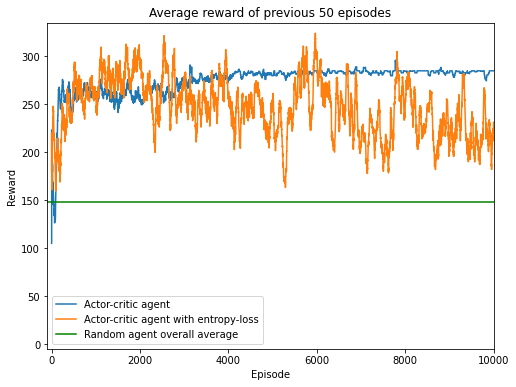

In [62]:
plt.figure(figsize=(8, 6))
# plt.plot(cum_avg(episodes_reward),label = "average rewards overall")
plt.plot(cum_avg_window(episodes_reward), label = "Actor-critic agent")
plt.plot(cum_avg_window(agent2_rewards), label = "Actor-critic agent with entropy-loss")
plt.axhline(y=np.mean(random_episodes_reward), color='g', label="Random agent overall average")
plt.ylim(-5, None)
plt.xlim(-100, 10000)
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.legend()
plt.title("Average reward of previous 50 episodes")
plt.plot()